In [1]:
# Librerías estándar y manipulación de archivos
import os
import joblib

# Manipulación de datos y operaciones básicas
import numpy as np

# Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns

# Modelos de Machine Learning
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

# Selección y validación de modelos
from sklearn.model_selection import GridSearchCV, StratifiedKFold,  cross_val_score, KFold

# Métricas de evaluación
from sklearn.metrics import confusion_matrix, precision_score, recall_score, accuracy_score, f1_score, roc_curve, auc

# Configuraciones adicionales
import warnings

#Se importan las librerias necesarias para el uso de pytorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from pytorch_tabnet.tab_model import TabNetClassifier


# Se ignoran los warnings en el notebook
warnings.filterwarnings('ignore')

# Se define el dispositivo a utilizar
print(torch.__version__)
print("CUDA disponible:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("Número de GPU disponibles:", torch.cuda.device_count())
    print("Nombre de la GPU 0:", torch.cuda.get_device_name(0))
    print("Dispositivo actual:", torch.cuda.current_device())

# Se define el dispositivo a utilizar
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

2.3.1+cu121
CUDA disponible: True
Número de GPU disponibles: 1
Nombre de la GPU 0: NVIDIA GeForce RTX 3090
Dispositivo actual: 0


In [2]:
def evaluar_modelo_sklearn(model, X_train, y_train, X_test, y_test, dataset_name, model_name, scoring):
    # Se establece la semilla para reproducibilidad
    scoring = scoring
    # Evaluación con datos de entrenamiento
    y_pred_train = model.predict(X_train)
    y_pred_train_prob = model.predict_proba(X_train)[:, 1]

    # Cálculo de métricas para datos de entrenamiento
    accuracy_train = accuracy_score(y_train, y_pred_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)

    # Visualización de métricas y gráficos para datos de entrenamiento
    print('\033[1m' + '.' * len("Resultados datos de entrenamiento:") + '\n' + "Resultados datos de entrenamiento:" + '\033[0m')
    print(f"Accuracy (Datos de Train): {accuracy_train}")
    print(f"Precision (Datos de Train): {precision_train}")
    print(f"Recall (Datos de Train): {recall_train}")
    print(f"F1 Score (Datos de Train): {f1_train}")

    # Gráficos para datos de entrenamiento
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Resultados de Train {model_name} ({scoring}) para el Dataset: - {dataset_name}', fontsize=16, fontweight='bold', y=1.05)
    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues', ax=axes[0],
                xticklabels=['Asiste', 'No-show'], yticklabels=['Asiste', 'No-show'])
    axes[0].set_title('Matriz de Confusión (Datos de Train)')
    axes[0].set_xlabel('Predicho')
    axes[0].set_ylabel('Real')
    print(conf_matrix_train)

    fpr_train, tpr_train, _ = roc_curve(y_train, y_pred_train_prob)
    roc_auc_train = auc(fpr_train, tpr_train)
    # Se imprime el resultado de AUC en train
    print(f"AUC (Datos de train): {roc_auc_train}")
    axes[1].plot(fpr_train, tpr_train, color='darkorange', lw=2, label=f'AUC = {roc_auc_train:.2f}')
    axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_title('Curva ROC (Datos de Train)')
    axes[1].set_xlabel('Tasa de Falsos Positivos')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos')
    axes[1].legend(loc="lower right")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    # Evaluación con datos de prueba
    y_pred_test = model.predict(X_test)
    y_pred_test_prob = model.predict_proba(X_test)[:, 1]

    # Cálculo de métricas para datos de prueba
    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)

    # Visualización de métricas y gráficos para datos de prueba
    print('\033[1m' + '.' * len("Resultados datos de test:") + '\n' + "Resultados datos de test:" + '\033[0m')
    print(f"Accuracy (Datos de Test): {accuracy_test}")
    print(f"Precision (Datos de Test): {precision_test}")
    print(f"Recall (Datos de Test): {recall_test}")
    print(f"F1 Score (Datos de Test): {f1_test}")

    # Gráficos para datos de prueba
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Resultados de Test {model_name} ({scoring}) para el Dataset: - {dataset_name}', fontsize=16, fontweight='bold', y=1.05)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)
    sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Reds', ax=axes[0],
                xticklabels=['Asiste', 'No-show'], yticklabels=['Asiste', 'No-show'])
    axes[0].set_title('Matriz de Confusión (Datos de Test)')
    axes[0].set_xlabel('Predicho')
    axes[0].set_ylabel('Real')
    print(conf_matrix_test)

    fpr_test, tpr_test, _ = roc_curve(y_test, y_pred_test_prob)
    roc_auc_test = auc(fpr_test, tpr_test)
    # Se imprime el resultado de AUC
    print(f"AUC (Datos de Test): {roc_auc_test}")
    axes[1].plot(fpr_test, tpr_test, color='darkorange', lw=2, label=f'AUC = {roc_auc_test:.2f}')
    axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_title('Curva ROC (Datos de Test)')
    axes[1].set_xlabel('Tasa de Falsos Positivos')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos')
    axes[1].legend(loc="lower right")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [3]:
def execute_model_logistic_regression(X, y, X_test, y_test, dataset_name, scoring):
    model_dir = 'models'
    model_name = 'Regresión Logística'
    scoring = scoring
    os.makedirs(model_dir, exist_ok=True)
    model_filename = os.path.join(model_dir, f'modelo_logistic_regression_{dataset_name}_{scoring}.joblib')
    params_log_filename = os.path.join(model_dir, f'modelo_logistic_regression_{dataset_name}_{scoring}_params.txt')

    if os.path.exists(model_filename):
        model = joblib.load(model_filename)
        print("Modelo cargado exitosamente.")
        if os.path.exists(params_log_filename):
            with open(params_log_filename, 'r') as f:
                best_params = f.read()
                print(f"Mejores hiperparámetros cargados: {best_params}")
        else:
            print("No se encontraron hiperparámetros guardados.")
        evaluar_modelo_sklearn(model, X, y, X_test, y_test, dataset_name, model_name, scoring)
        return

    # Se define el rango de hiperparámetros para la búsqueda en cuadrícula
    param_grid = {
        'C': [0.01, 0.1, 1, 10, 100],
        'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
        'max_iter': [100, 200, 300, 500, 1000]
    }

    # Configura la búsqueda en cuadrícula
    grid_search = GridSearchCV(LogisticRegression(), param_grid, cv=5, scoring=scoring, n_jobs=-1)
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    
    best_score = 0
    best_model = None
    best_params = None

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        grid_search.fit(X_train, y_train)
        candidate_model = grid_search.best_estimator_
        val_score = accuracy_score(y_val, candidate_model.predict(X_val))

        if val_score > best_score:
            best_score = val_score
            best_model = candidate_model
            best_params = grid_search.best_params_

    print(f"Mejores hiperparámetros: {best_params}")
    print(f"Mejor puntaje de validación: {best_score}")

    # Guardar los mejores hiperparámetros en un archivo de registro
    with open(params_log_filename, 'w') as f:
        f.write(str(best_params))

    # Guarda el mejor modelo
    joblib.dump(best_model, model_filename)
    print(f"Modelo guardado en {model_filename}")

    # Evalúa el mejor modelo
    evaluar_modelo_sklearn(best_model, X, y, X_test, y_test, dataset_name, model_name, scoring)

In [4]:
def execute_model_decision_tree(X, y, X_test, y_test, dataset_name, scoring):
    model_dir = 'models'
    model_name = 'Árbol de Decisión'
    scoring = scoring
    os.makedirs(model_dir, exist_ok=True)
    model_filename = os.path.join(model_dir, f'modelo_decision_tree_{dataset_name}_{scoring}.joblib')
    params_log_filename = os.path.join(model_dir, f'modelo_decision_tree_{dataset_name}_{scoring}_params.txt')

    if os.path.exists(model_filename):
        model = joblib.load(model_filename)
        print("Modelo cargado exitosamente.")
        if os.path.exists(params_log_filename):
            with open(params_log_filename, 'r') as f:
                best_params = f.read()
                print(f"Mejores hiperparámetros cargados: {best_params}")
        else:
            print("No se encontraron hiperparámetros guardados.")
        evaluar_modelo_sklearn(model, X, y, X_test, y_test, dataset_name, model_name, scoring)
        return

    # Se define el rango de hiperparámetros para la búsqueda en cuadrícula
    param_grid = {
        'criterion': ['gini', 'entropy'],
        'max_depth': [10, 15, 20],
        'min_samples_split': [2, 3, 5],
        'min_samples_leaf': [2, 3, 4]
    }

    # Configura la búsqueda en cuadrícula
    grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, scoring=scoring, n_jobs=-1)
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    
    best_score = 0
    best_model = None
    best_params = None

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        grid_search.fit(X_train, y_train)
        candidate_model = grid_search.best_estimator_
        val_score = accuracy_score(y_val, candidate_model.predict(X_val))

        if val_score > best_score:
            best_score = val_score
            best_model = candidate_model
            best_params = grid_search.best_params_

    print(f"Mejores hiperparámetros: {best_params}")
    print(f"Mejor puntaje de validación: {best_score}")

    # Guardar los mejores hiperparámetros en un archivo de registro
    with open(params_log_filename, 'w') as f:
        f.write(str(best_params))

    # Guarda el mejor modelo
    joblib.dump(best_model, model_filename)
    print(f"Modelo guardado en {model_filename}")

    # Evalúa el mejor modelo
    evaluar_modelo_sklearn(best_model, X, y, X_test, y_test, dataset_name, model_name, scoring)

In [5]:
# Se define la funcion para graficar la perdida por epoca para red neuronal de pytorch
def graficar_progreso(losses, inicio_folds, dataset_name, grado=3):
    plt.figure(figsize=(20, 10))
    # Gráfico original
    plt.plot(range(1, len(losses) + 1), losses, marker='o', linestyle='-', color='blue', label='Pérdida Real')

     # Marcar y anotar el inicio de cada fold
    for i, inicio in enumerate(inicio_folds):
        plt.axvline(x=inicio, color='black', linestyle='--', lw=1)
        plt.text(inicio, max(losses)*0.95, f'Inicio Fold {i+1}', rotation=90, color='black', fontsize=12, fontweight='bold')

    # Ajustando la curva de tendencia
    z = np.polyfit(range(1, len(losses) + 1), losses, grado)  # Ajuste polinomial
    p = np.poly1d(z)  # Creación de un polinomio
    plt.plot(range(1, len(losses) + 1), p(range(1, len(losses) + 1)), "r--", label='Curva de Tendencia')  # Curva de tendencia en rojo

    # Configuración del gráfico
    plt.title(f'Pérdida por Época a través de los Folds, Dataset: {dataset_name}')
    plt.xlabel('Época Total')
    plt.ylabel('Pérdida')
    plt.legend()
    plt.grid(True)
    plt.show()


In [6]:
def evaluar_modelo_pytorch(model, X_train_tensor, y_train, X_test_tensor, y_test, dataset_name):
    # Evaluación con datos de entrenamiento
    y_pred = model(X_train_tensor).detach().cpu().numpy()
    y_pred_bin = (y_pred > 0.5).astype(int)

    # Cálculo de métricas para datos de entrenamiento
    accuracy = accuracy_score(y_train, y_pred_bin)
    precision = precision_score(y_train, y_pred_bin)
    recall = recall_score(y_train, y_pred_bin)
    f1 = f1_score(y_train, y_pred_bin)

    # Visualización de métricas y gráficos para datos de entrenamiento
    print('\033[1m' + '.' * len("Resultados datos de entrenamiento:") + '\n' + "Resultados datos de entrenamiento:" + '\033[0m')
    print(f"Accuracy (Datos de Train): {accuracy}")
    print(f"Precision (Datos de Train): {precision}")
    print(f"Recall (Datos de Train): {recall}")
    print(f"F1 Score (Datos de Train): {f1}")

    # Gráficos para datos de entrenamiento
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Resultados de Train NeuralNet para el Dataset: - {dataset_name}', fontsize=16, fontweight='bold', y=1.05)
    conf_matrix = confusion_matrix(y_train, y_pred_bin)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', ax=axes[0],
                xticklabels=['Asiste', 'No-show'], yticklabels=['Asiste', 'No-show'])
    axes[0].set_title('Matriz de Confusión (Datos de Train)')
    axes[0].set_xlabel('Predicho')
    axes[0].set_ylabel('Real')
    print(conf_matrix)

    fpr, tpr, thresholds = roc_curve(y_train, y_pred)
    roc_auc = auc(fpr, tpr)
    # Se imprime el resultado de AUC en train
    print(f"AUC (Datos de Train): {roc_auc}")
    axes[1].plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
    axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_title('Curva ROC (Datos de Train)')
    axes[1].set_xlabel('Tasa de Falsos Positivos')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos')
    axes[1].legend(loc="lower right")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    # Evaluación con datos de prueba
    y_pred_test = model(X_test_tensor).detach().cpu().numpy()
    y_pred_test_bin = (y_pred_test > 0.5).astype(int)

    # Cálculo de métricas para datos de prueba
    accuracy_test = accuracy_score(y_test, y_pred_test_bin)
    precision_test = precision_score(y_test, y_pred_test_bin)
    recall_test = recall_score(y_test, y_pred_test_bin)
    f1_test = f1_score(y_test, y_pred_test_bin)

    # Visualización de métricas y gráficos para datos de prueba
    print('\033[1m' + '.' * len("Resultados datos de test:") + '\n' + "Resultados datos de test:" + '\033[0m')
    print(f"Accuracy (Datos de Test): {accuracy_test}")
    print(f"Precision (Datos de Test): {precision_test}")
    print(f"Recall (Datos de Test): {recall_test}")
    print(f"F1 Score (Datos de Test): {f1_test}")
    

    # Gráficos para datos de prueba
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Resultados de Test NeuralNet para el Dataset: - {dataset_name}', fontsize=16, fontweight='bold', y=1.05)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test_bin)
    sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Reds', ax=axes[0],
                xticklabels=['Asiste', 'No-show'], yticklabels=['Asiste', 'No-show'])
    axes[0].set_title('Matriz de Confusión (Datos de Test)')
    axes[0].set_xlabel('Predicho')
    axes[0].set_ylabel('Real')
    print(conf_matrix_test)

    fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_pred_test)
    roc_auc_test = auc(fpr_test, tpr_test)
    # Se imprime el resultado de AUC en test
    print(f"AUC (Datos de Test): {roc_auc_test}")
    axes[1].plot(fpr_test, tpr_test, color='darkorange', lw=2, label=f'AUC = {roc_auc_test:.2f}')
    axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_title('Curva ROC (Datos de Test)')
    axes[1].set_xlabel('Tasa de Falsos Positivos')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos')
    axes[1].legend(loc="lower right")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


In [7]:
def evaluar_modelo_tabnet(model, X_train, y_train, X_test, y_test, dataset_name):
    # Evaluación con datos de entrenamiento
    y_pred = model.predict_proba(X_train)[:, 1]
    y_pred_bin = (y_pred > 0.5).astype(int)

    # Cálculo de métricas para datos de entrenamiento
    accuracy = accuracy_score(y_train, y_pred_bin)
    precision = precision_score(y_train, y_pred_bin)
    recall = recall_score(y_train, y_pred_bin)
    f1 = f1_score(y_train, y_pred_bin)

    # Visualización de métricas y gráficos para datos de entrenamiento
    print('\033[1m' + '.' * len("Resultados datos de entrenamiento:") + '\n' + "Resultados datos de entrenamiento:" + '\033[0m')
    print(f"Accuracy (Datos de Train): {accuracy}")
    print(f"Precision (Datos de Train): {precision}")
    print(f"Recall (Datos de Train): {recall}")
    print(f"F1 Score (Datos de Train): {f1}")

    # Gráficos para datos de entrenamiento
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Resultados de Train TabNet para el Dataset: - {dataset_name}', fontsize=16, fontweight='bold', y=1.05)
    conf_matrix = confusion_matrix(y_train, y_pred_bin)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', ax=axes[0],
                xticklabels=['Asiste', 'No-show'], yticklabels=['Asiste', 'No-show'])
    axes[0].set_title('Matriz de Confusión (Datos de Train)')
    axes[0].set_xlabel('Predicho')
    axes[0].set_ylabel('Real')
    print(conf_matrix)

    fpr, tpr, thresholds = roc_curve(y_train, y_pred)
    roc_auc = auc(fpr, tpr)
    # Se imprime el resultado de AUC en train
    print(f"AUC (Datos de Train): {roc_auc}")
    axes[1].plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
    axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_title('Curva ROC (Datos de Train)')
    axes[1].set_xlabel('Tasa de Falsos Positivos')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos')
    axes[1].legend(loc="lower right")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    # Evaluación con datos de prueba
    y_pred_test = model.predict_proba(X_test)[:, 1]
    y_pred_test_bin = (y_pred_test > 0.5).astype(int)

    # Cálculo de métricas para datos de prueba
    accuracy_test = accuracy_score(y_test, y_pred_test_bin)
    precision_test = precision_score(y_test, y_pred_test_bin)
    recall_test = recall_score(y_test, y_pred_test_bin)
    f1_test = f1_score(y_test, y_pred_test_bin)

    # Visualización de métricas y gráficos para datos de prueba
    print('\033[1m' + '.' * len("Resultados datos de test:") + '\n' + "Resultados datos de test:" + '\033[0m')
    print(f"Accuracy (Datos de Test): {accuracy_test}")
    print(f"Precision (Datos de Test): {precision_test}")
    print(f"Recall (Datos de Test): {recall_test}")
    print(f"F1 Score (Datos de Test): {f1_test}")

    # Gráficos para datos de prueba
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Resultados de Test TabNet para el Dataset: - {dataset_name}', fontsize=16, fontweight='bold', y=1.05)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test_bin)
    sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Reds', ax=axes[0],
                xticklabels=['Asiste', 'No-show'], yticklabels=['Asiste', 'No-show'])
    axes[0].set_title('Matriz de Confusión (Datos de Test)')
    axes[0].set_xlabel('Predicho')
    axes[0].set_ylabel('Real')
    print(conf_matrix_test)

    fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_pred_test)
    roc_auc_test = auc(fpr_test, tpr_test)
    # Se imprime el resultado de AUC en test
    print(f"AUC (Datos de Test): {roc_auc_test}")
    axes[1].plot(fpr_test, tpr_test, color='darkorange', lw=2, label=f'AUC = {roc_auc_test:.2f}')
    axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_title('Curva ROC (Datos de Test)')
    axes[1].set_xlabel('Tasa de Falsos Positivos')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos')
    axes[1].legend(loc="lower right")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [8]:
# Se define la función para ejecutar el modelo en PyTorch de NeuralNet
def execute_model_pytorch(X_train, y_train, X_test, y_test, device, dataset_name):
    class NeuralNet(nn.Module):
        def __init__(self, input_size):
            super(NeuralNet, self).__init__()
            self.layer1 = nn.Linear(input_size, 64)
            self.bn1 = nn.BatchNorm1d(64)
            self.relu1 = nn.ReLU()

            self.layer2 = nn.Linear(64, 32)
            self.bn2 = nn.BatchNorm1d(32)
            self.relu2 = nn.ReLU()
            self.dropout1 = nn.Dropout(0.5)

            self.output_layer = nn.Linear(32, 1)
            self.sigmoid = nn.Sigmoid()

        def forward(self, x):
            out = self.bn1(self.layer1(x))
            out = self.relu1(out)

            out = self.bn2(self.layer2(out))
            out = self.relu2(out)
            out = self.dropout1(out)

            out = self.output_layer(out)
            out = self.sigmoid(out)
            return out

    model = NeuralNet(X_train.shape[1]).to(device)

    model_dir = 'models'
    os.makedirs(model_dir, exist_ok=True)
    model_filename = os.path.join(model_dir, f'modelo_pytorch_{dataset_name}.pth')

    if os.path.exists(model_filename):
        model.load_state_dict(torch.load(model_filename))
        print("Modelo cargado exitosamente.")

        X_test_tensor = torch.tensor(X_test).float().to(device)
        X_train_fold_tensor = torch.tensor(X_train).float().to(device)
        y_train_fold = y_train
        evaluar_modelo_pytorch(model, X_train_fold_tensor, y_train_fold, X_test_tensor, y_test, dataset_name)
        return

    skfolds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    num_epochs = 100
    patience = 10  # Número de épocas a esperar antes de detener el entrenamiento si no hay mejora
    fold_results = []
    losses = []
    inicio_folds = [1]
    epoca_actual = 0

    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5) 
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

    best_global_val_loss = float('inf')
    best_model_state = None

    for fold, (train_index, test_index) in enumerate(skfolds.split(X_train, y_train)):
        print(f'Comenzando el fold {fold+1}')

        X_train_fold = X_train[train_index]
        y_train_fold = y_train[train_index]
        X_valid_fold = X_train[test_index]
        y_valid_fold = y_train[test_index]

        X_train_fold_tensor = torch.tensor(X_train_fold).float().to(device)
        y_train_fold_tensor = torch.tensor(y_train_fold.to_numpy()[:, None]).float().to(device)
        X_valid_fold_tensor = torch.tensor(X_valid_fold).float().to(device)
        y_valid_fold_tensor = torch.tensor(y_valid_fold.to_numpy()[:, None]).float().to(device)

        train_loader = DataLoader(TensorDataset(X_train_fold_tensor, y_train_fold_tensor), batch_size=64, shuffle=True)
        valid_loader = DataLoader(TensorDataset(X_valid_fold_tensor, y_valid_fold_tensor), batch_size=64)

        epoch_losses = []
        best_val_loss = float('inf')
        patience_counter = 0

        for epoch in range(num_epochs):
            model.train()
            train_losses = []
            for inputs, targets in train_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                loss.backward()
                optimizer.step()
                train_losses.append(loss.item())

            model.eval()
            val_losses = []
            with torch.no_grad():
                for inputs, targets in valid_loader:
                    inputs, targets = inputs.to(device), targets.to(device)
                    outputs = model(inputs)
                    loss = criterion(outputs, targets)
                    val_losses.append(loss.item())

            epoch_train_loss = torch.tensor(train_losses).mean().item()
            epoch_val_loss = torch.tensor(val_losses).mean().item()
            epoch_losses.append((epoch_train_loss, epoch_val_loss))
            losses.append(epoch_val_loss)
            print(f'Fold {fold+1}, Epoch {epoch+1}, Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}')

            # Step the scheduler
            scheduler.step(epoch_val_loss)

            # Early Stopping
            if epoch_val_loss < best_val_loss:
                best_val_loss = epoch_val_loss
                patience_counter = 0
                # Guardar el mejor modelo del fold actual
                if epoch_val_loss < best_global_val_loss:
                    best_global_val_loss = epoch_val_loss
                    best_model_state = model.state_dict()
            else:
                patience_counter += 1

            if patience_counter >= patience and epoch >= (num_epochs // 2):  # Modificar la condición de stop
                print(f'Early stopping en la época {epoch+1}')
                break

        fold_results.append({
            'fold': fold+1,
            'epoch_losses': epoch_losses,
        })
        if fold < skfolds.n_splits - 1:
            epoca_actual += num_epochs
            inicio_folds.append(epoca_actual + 1)

    # Guardar el mejor modelo global
    torch.save(best_model_state, model_filename)
    print(f"Mejor modelo guardado en {model_filename}")

    graficar_progreso(losses, inicio_folds, dataset_name, grado=3)

    X_test_tensor = torch.tensor(X_test).float().to(device)

    X_train_fold_tensor = torch.tensor(X_train).float().to(device)
    y_train_fold = y_train

    evaluar_modelo_pytorch(model, X_train_fold_tensor, y_train_fold, X_test_tensor, y_test, dataset_name)


In [9]:
def execute_model_tabnet(X_train, y_train, X_test, y_test, device, dataset_name, num_epochs=100, patience=10):
    # Convertir los datos a numpy arrays si no lo están ya
    X_train = X_train.to_numpy() if hasattr(X_train, 'to_numpy') else X_train
    X_test = X_test.to_numpy() if hasattr(X_test, 'to_numpy') else X_test
    y_train = y_train.to_numpy() if hasattr(y_train, 'to_numpy') else y_train
    y_test = y_test.to_numpy() if hasattr(y_test, 'to_numpy') else y_test

    # Parámetros del modelo
    model_params = dict(
        n_d=64, n_a=64, n_steps=5,
        gamma=1.5, n_independent=2, n_shared=2,
        cat_idxs=[], cat_dims=[], cat_emb_dim=[],
        lambda_sparse=1e-3, momentum=0.3, clip_value=2.,
        optimizer_fn=torch.optim.Adam,
        optimizer_params=dict(lr=2e-2),
        scheduler_params={"step_size":10, "gamma":0.9},
        scheduler_fn=torch.optim.lr_scheduler.StepLR,
        epsilon=1e-15,
        device_name=device
    )

    model_dir = 'models'
    os.makedirs(model_dir, exist_ok=True)
    model_filename = os.path.join(model_dir, f'modelo_tabnet_{dataset_name}.pkl')

    if os.path.exists(model_filename):
        try:
            model = joblib.load(model_filename)
            print("Modelo cargado exitosamente.")
            evaluar_modelo_tabnet(model, X_train, y_train, X_test, y_test, dataset_name)
            return
        except Exception as e:
            print(f"Error al cargar el modelo: {e}. Procediendo con el entrenamiento.")

    skfolds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    fold_results = []
    losses = []
    inicio_folds = [1]
    epoca_actual = 0

    best_global_val_auc = 0
    best_model = None

    for fold, (train_index, valid_index) in enumerate(skfolds.split(X_train, y_train), 1):
        print(f'Comenzando el fold {fold}')

        X_train_fold, X_valid_fold = X_train[train_index], X_train[valid_index]
        y_train_fold, y_valid_fold = y_train[train_index], y_train[valid_index]

        try:
            # Inicializar un nuevo modelo para cada fold
            model = TabNetClassifier(**model_params)

            # Fit del modelo
            model.fit(
                X_train=X_train_fold, y_train=y_train_fold,
                eval_set=[(X_valid_fold, y_valid_fold)],
                eval_name=['valid'],
                eval_metric=['auc'],
                max_epochs=num_epochs, patience=patience,
                batch_size=1024, virtual_batch_size=128
            )

            # Guardar las métricas
            epoch_metrics = model.history['valid_auc']
            if epoch_metrics:
                losses.extend([-auc for auc in epoch_metrics])  # Convertimos AUC a pérdida
                fold_results.append({
                    'fold': fold,
                    'epoch_metrics': epoch_metrics,
                })
                print(f"Fold {fold} completado. Métricas registradas: {len(epoch_metrics)}")

                # Actualizar el mejor modelo global
                best_fold_auc = max(epoch_metrics)
                if best_fold_auc > best_global_val_auc:
                    best_global_val_auc = best_fold_auc
                    best_model = model

                if fold < skfolds.n_splits:
                    epoca_actual += len(epoch_metrics)
                    inicio_folds.append(epoca_actual + 1)
            else:
                print(f"Advertencia: No se registraron métricas para el fold {fold}")

        except Exception as e:
            print(f"Error en el fold {fold}: {e}")

    if losses:
        graficar_progreso(losses, inicio_folds, dataset_name, grado=3)
    else:
        print("No se registraron métricas durante el entrenamiento. No se puede graficar el progreso.")
   
    if best_model is not None:
        joblib.dump(best_model, model_filename)
        print(f"Mejor modelo guardado en {model_filename}")
        
        # Evaluación final
        evaluar_modelo_tabnet(best_model, X_train, y_train, X_test, y_test, dataset_name)
    else:
        print("No se pudo entrenar ningún modelo exitosamente.")


Ejecutando modelo para el dataset: P1-ALL-ADASYN

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 10, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6087605629719819
Precision (Datos de Train): 0.6286347907545835
Recall (Datos de Train): 0.4875669103364422
F1 Score (Datos de Train): 0.5491866252463506
[[51116 19425]
 [34559 32882]]
AUC (Datos de train): 0.6541411990368521


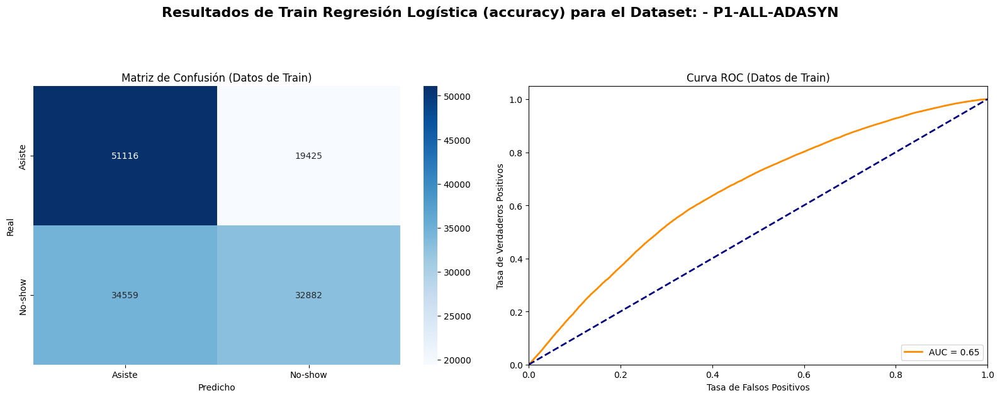

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6456985111101055
Precision (Datos de Test): 0.3069692801467217
Recall (Datos de Test): 0.600313830979601
F1 Score (Datos de Test): 0.4062191884717482
[[11590  6046]
 [ 1783  2678]]
AUC (Datos de Test): 0.6637975811027036


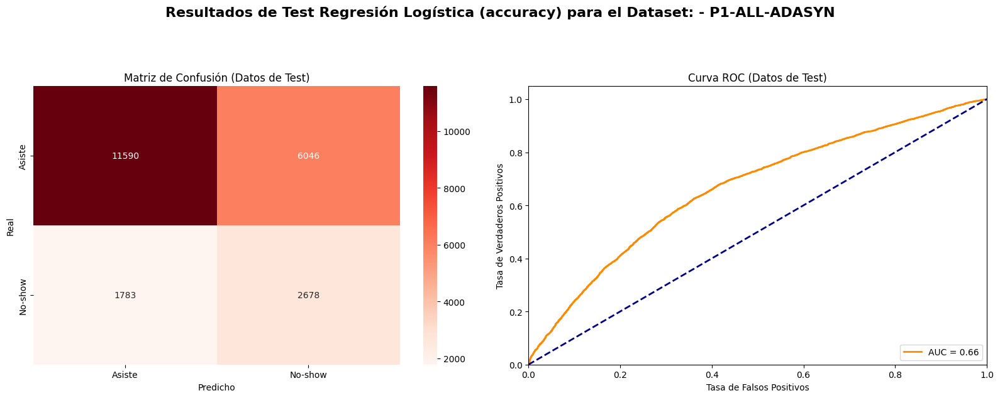

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8050905190532098
Precision (Datos de Train): 0.7664235495104803
Recall (Datos de Train): 0.8647706884536113
F1 Score (Datos de Train): 0.8126323709731357
[[52767 17774]
 [ 9120 58321]]
AUC (Datos de train): 0.9048800057520864


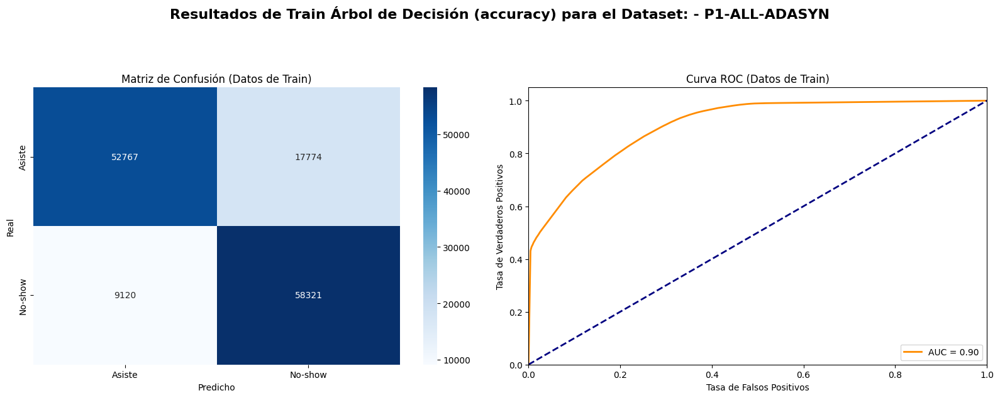

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6514911526451554
Precision (Datos de Test): 0.2882906429691584
Recall (Datos de Test): 0.49450795785698276
F1 Score (Datos de Test): 0.3642367704119541
[[12190  5446]
 [ 2255  2206]]
AUC (Datos de Test): 0.6399312679344065


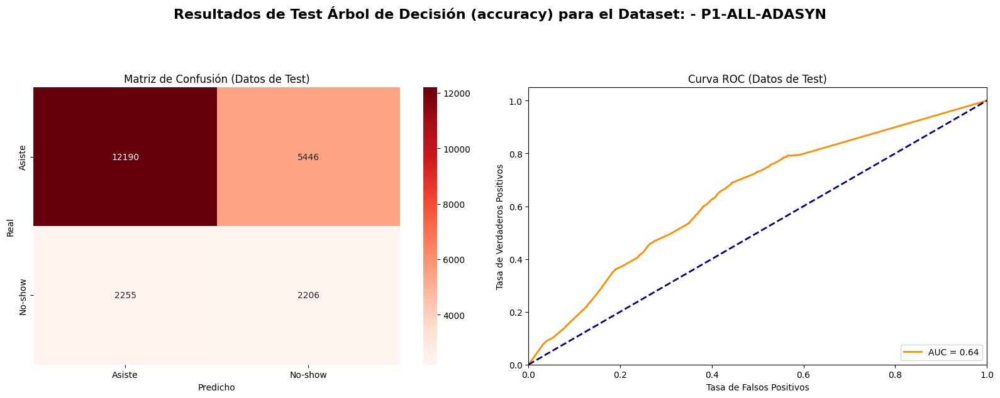

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 10, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6087605629719819
Precision (Datos de Train): 0.6286347907545835
Recall (Datos de Train): 0.4875669103364422
F1 Score (Datos de Train): 0.5491866252463506
[[51116 19425]
 [34559 32882]]
AUC (Datos de train): 0.6541411990368521


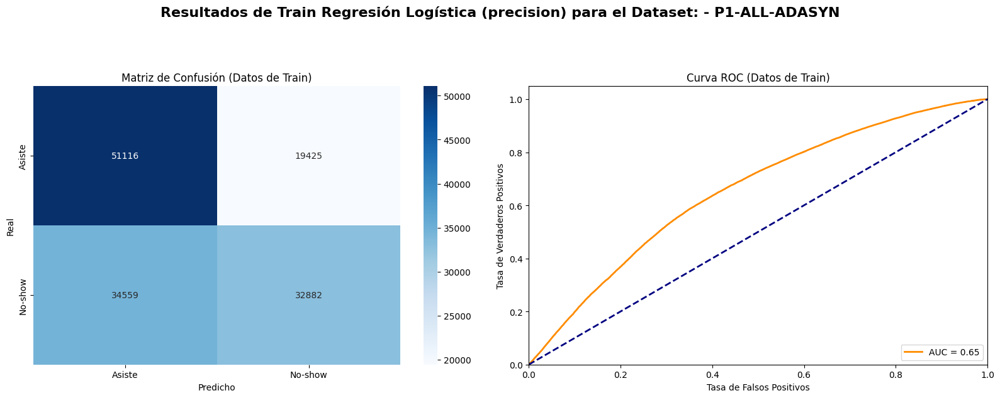

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6456985111101055
Precision (Datos de Test): 0.3069692801467217
Recall (Datos de Test): 0.600313830979601
F1 Score (Datos de Test): 0.4062191884717482
[[11590  6046]
 [ 1783  2678]]
AUC (Datos de Test): 0.6637975811027036


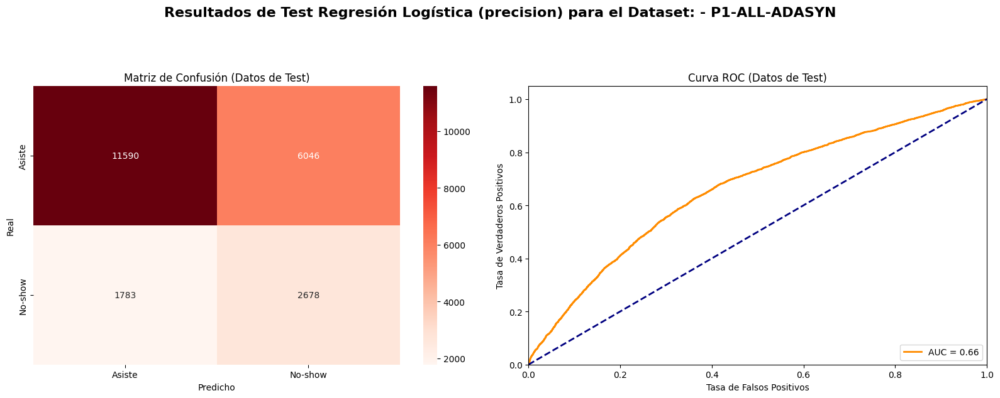

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8051050136974388
Precision (Datos de Train): 0.7666188866825349
Recall (Datos de Train): 0.8643999940688899
F1 Score (Datos de Train): 0.8125784059546709
[[52794 17747]
 [ 9145 58296]]
AUC (Datos de train): 0.904876852845026


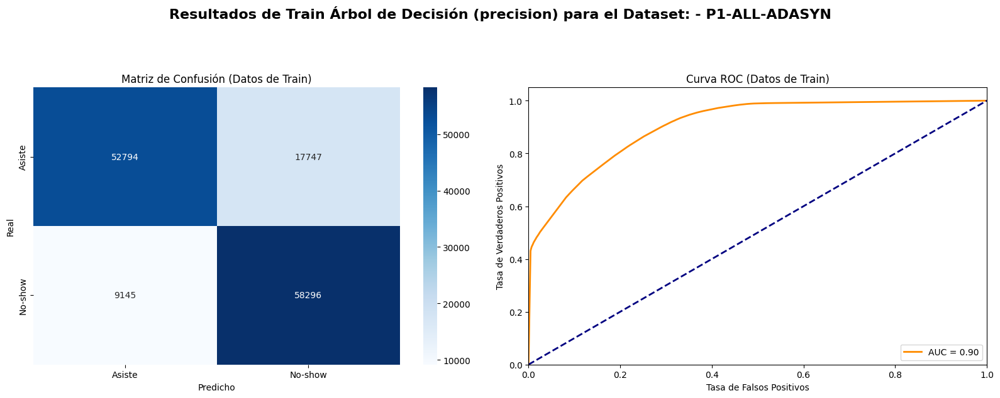

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6518079377291035
Precision (Datos de Test): 0.28894111502807157
Recall (Datos de Test): 0.49607711275498767
F1 Score (Datos de Test): 0.36518151815181515
[[12190  5446]
 [ 2248  2213]]
AUC (Datos de Test): 0.6397867732896819


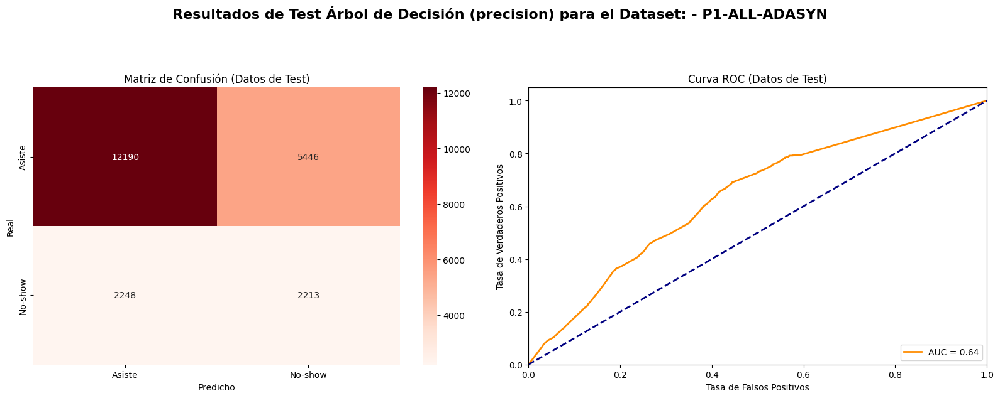

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 10, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6087605629719819
Precision (Datos de Train): 0.6286347907545835
Recall (Datos de Train): 0.4875669103364422
F1 Score (Datos de Train): 0.5491866252463506
[[51116 19425]
 [34559 32882]]
AUC (Datos de train): 0.6541411990368521


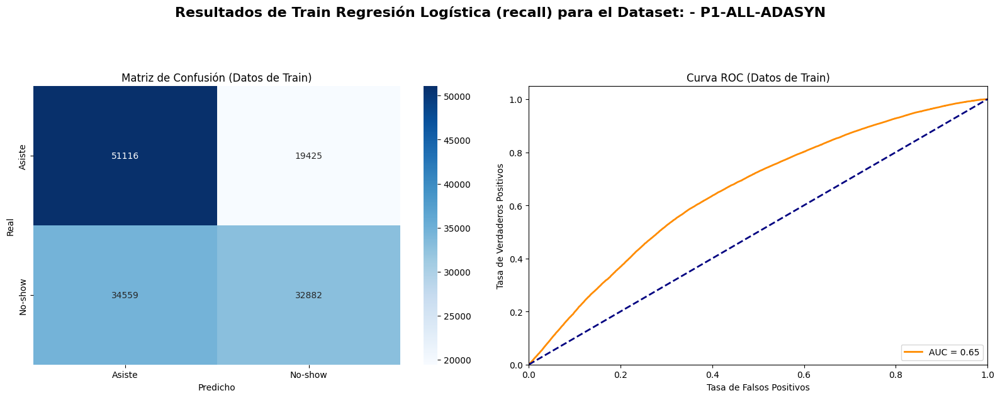

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6456985111101055
Precision (Datos de Test): 0.3069692801467217
Recall (Datos de Test): 0.600313830979601
F1 Score (Datos de Test): 0.4062191884717482
[[11590  6046]
 [ 1783  2678]]
AUC (Datos de Test): 0.6637975811027036


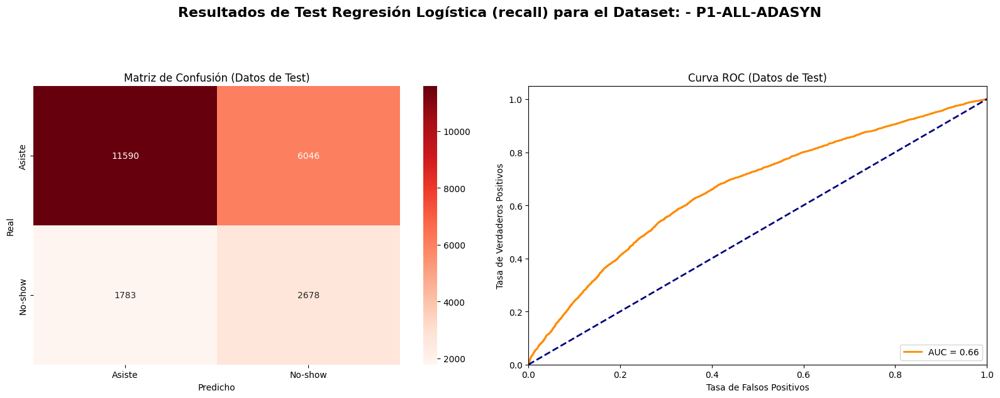

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 3, 'min_samples_split': 5}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7329361800814599
Precision (Datos de Train): 0.6721245062624489
Recall (Datos de Train): 0.8856185406503462
F1 Score (Datos de Train): 0.7642414781451531
[[41405 29136]
 [ 7714 59727]]
AUC (Datos de train): 0.8117977251740771


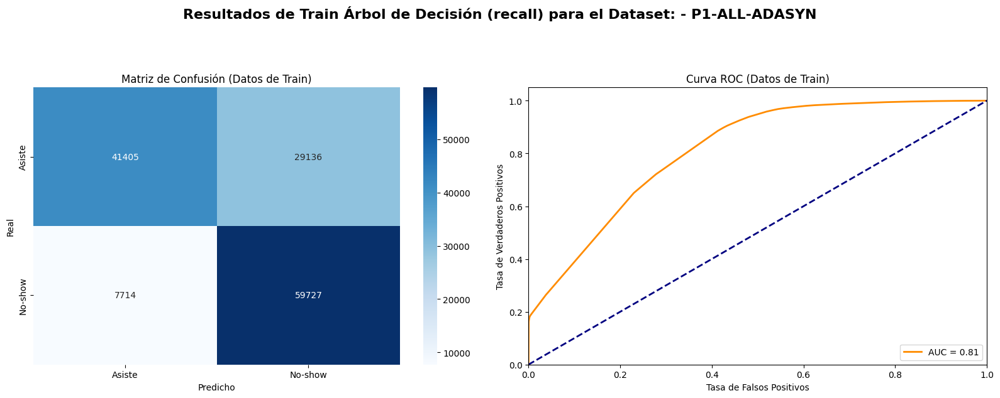

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6139747477033082
Precision (Datos de Test): 0.3049937697690022
Recall (Datos de Test): 0.7132929836359561
F1 Score (Datos de Test): 0.4272861554988586
[[10385  7251]
 [ 1279  3182]]
AUC (Datos de Test): 0.7152432037564134


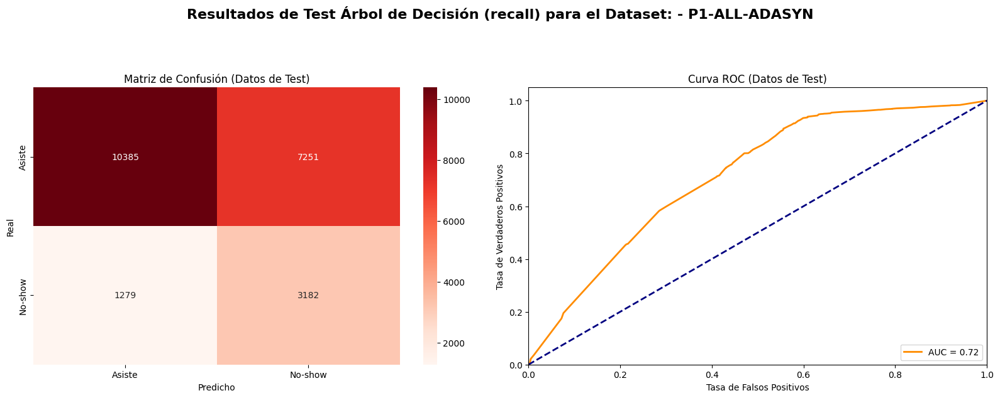

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6828281949819541
Precision (Datos de Train): 0.6315871375059744
Recall (Datos de Train): 0.8425438531457126
F1 Score (Datos de Train): 0.72197092905062
[[37396 33145]
 [10619 56822]]
AUC (Datos de Train): 0.7438151922325269


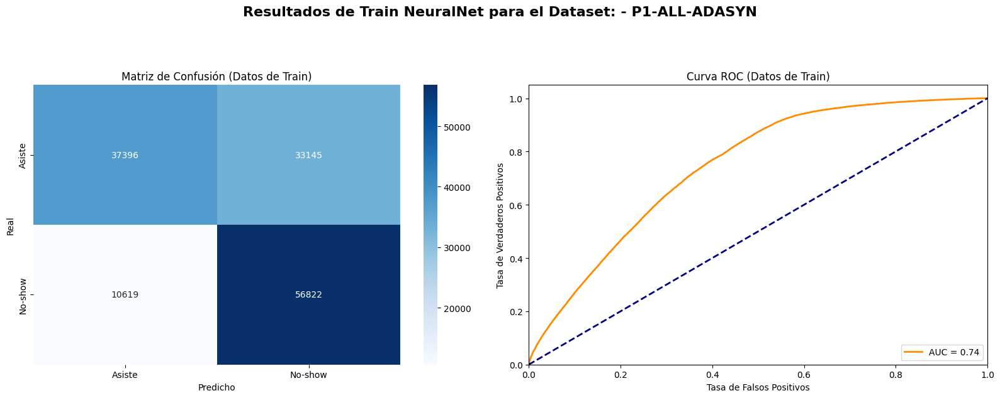

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.5350047517762592
Precision (Datos de Test): 0.2801391620027227
Recall (Datos de Test): 0.8303071060300381
F1 Score (Datos de Test): 0.4189334388961149
[[8118 9518]
 [ 757 3704]]
AUC (Datos de Test): 0.6874033387007857


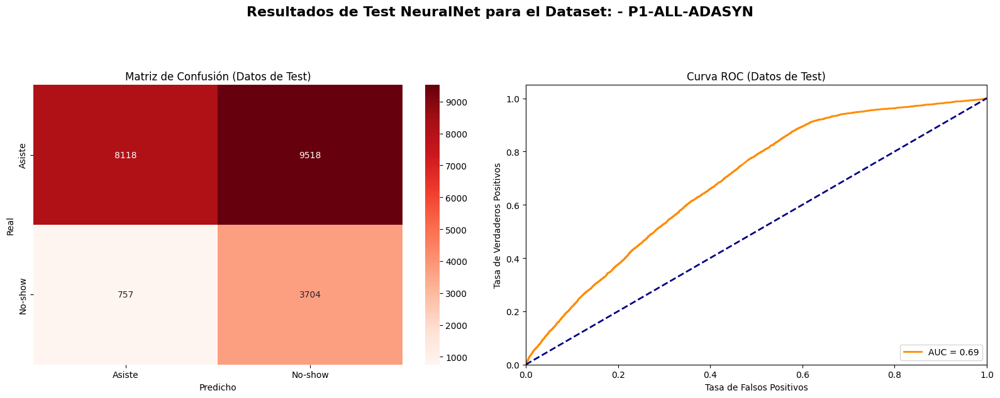

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6913293038222377
Precision (Datos de Train): 0.6325842456836759
Recall (Datos de Train): 0.8790201806023042
F1 Score (Datos de Train): 0.7357140640997797
[[36109 34432]
 [ 8159 59282]]
AUC (Datos de Train): 0.7523814887403515


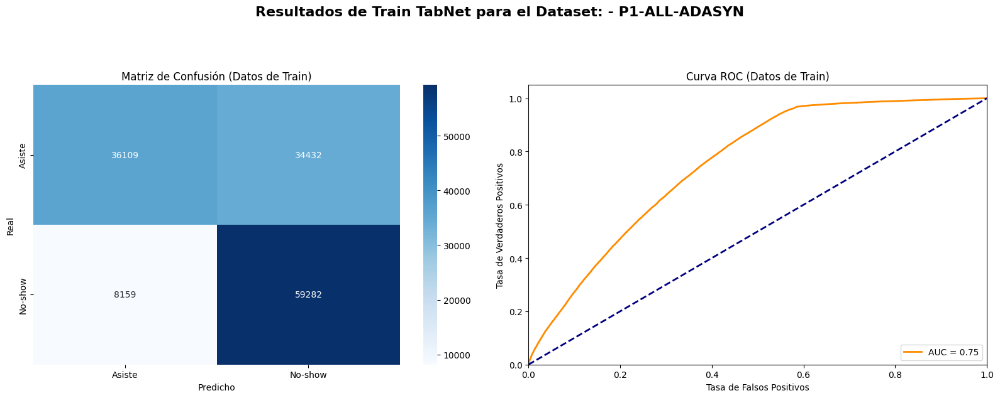

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.588993981083405
Precision (Datos de Test): 0.3019288469781397
Recall (Datos de Test): 0.7895090786819099
F1 Score (Datos de Test): 0.4368101203026169
[[9493 8143]
 [ 939 3522]]
AUC (Datos de Test): 0.7256306883644543


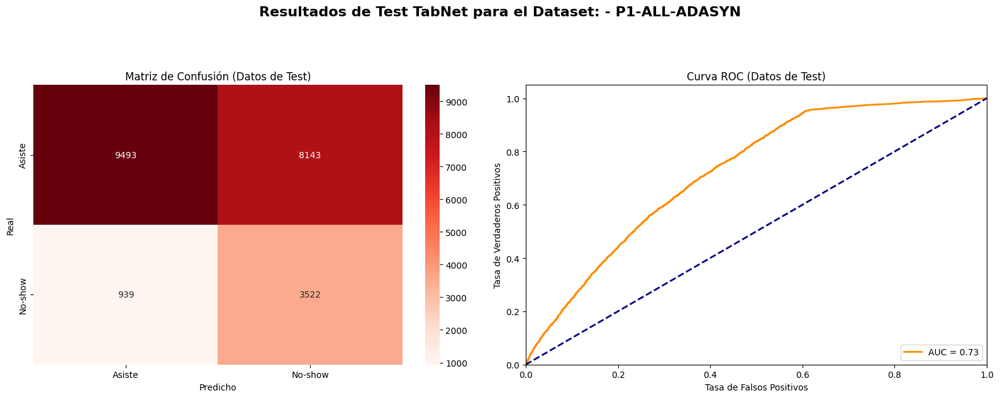


Ejecutando modelo para el dataset: P1-ALL

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 100, 'solver': 'newton-cg'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6390387560372246
Precision (Datos de Train): 0.6369383265481579
Recall (Datos de Train): 0.44351516005211816
F1 Score (Datos de Train): 0.5229134013556015
[[56183 14358]
 [31605 25189]]
AUC (Datos de train): 0.6952501997055615


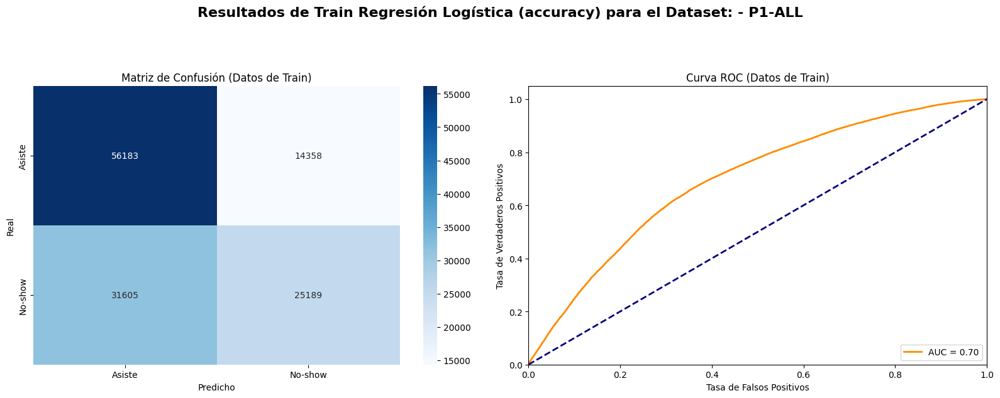

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6772412544689325
Precision (Datos de Test): 0.32047318187928486
Recall (Datos de Test): 0.5344093252633939
F1 Score (Datos de Test): 0.400672268907563
[[12581  5055]
 [ 2077  2384]]
AUC (Datos de Test): 0.6597757795961461


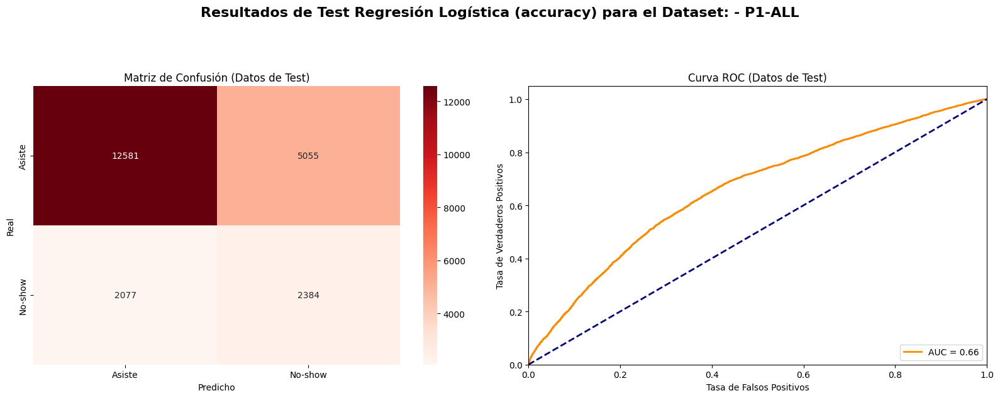

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8485883692621824
Precision (Datos de Train): 0.8265721846925274
Recall (Datos de Train): 0.8359157657499031
F1 Score (Datos de Train): 0.8312177186378359
[[60580  9961]
 [ 9319 47475]]
AUC (Datos de train): 0.9336915361498659


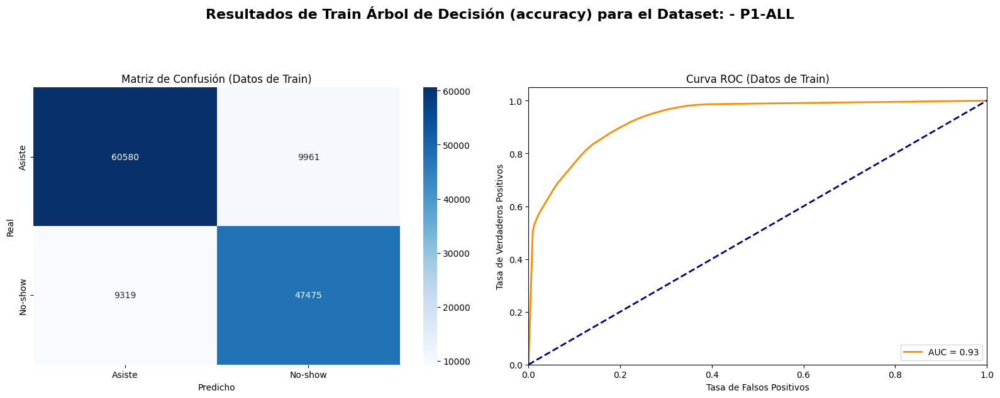

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7082409376838484
Precision (Datos de Test): 0.3074835207444746
Recall (Datos de Test): 0.35552566689083165
F1 Score (Datos de Test): 0.3297640087327165
[[14064  3572]
 [ 2875  1586]]
AUC (Datos de Test): 0.6270235478478865


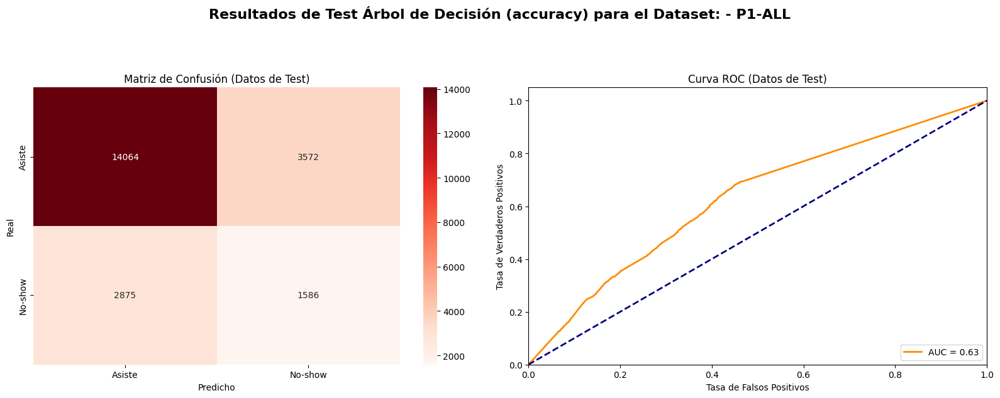

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 500, 'solver': 'sag'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6390309027368751
Precision (Datos de Train): 0.6369360712118147
Recall (Datos de Train): 0.4434799450646195
F1 Score (Datos de Train): 0.5228881645871827
[[56184 14357]
 [31607 25187]]
AUC (Datos de train): 0.6952505047247328


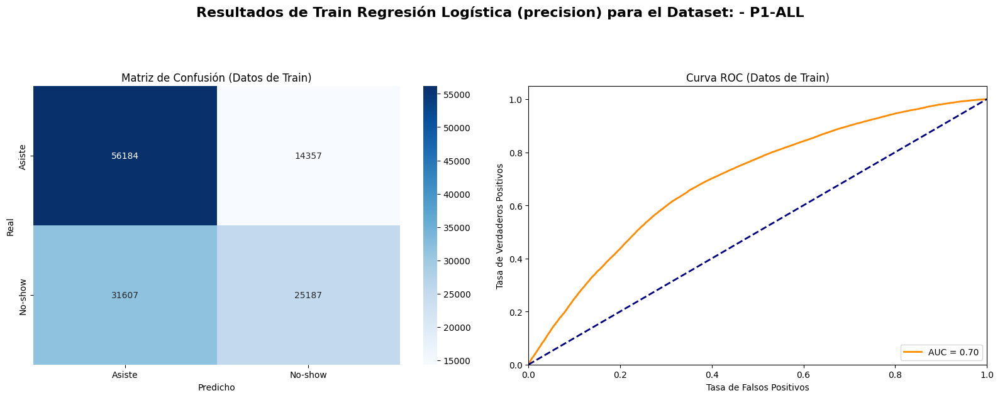

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6772865094809251
Precision (Datos de Test): 0.3205162678139285
Recall (Datos de Test): 0.5344093252633939
F1 Score (Datos de Test): 0.40070594167577106
[[12582  5054]
 [ 2077  2384]]
AUC (Datos de Test): 0.6597666279296963


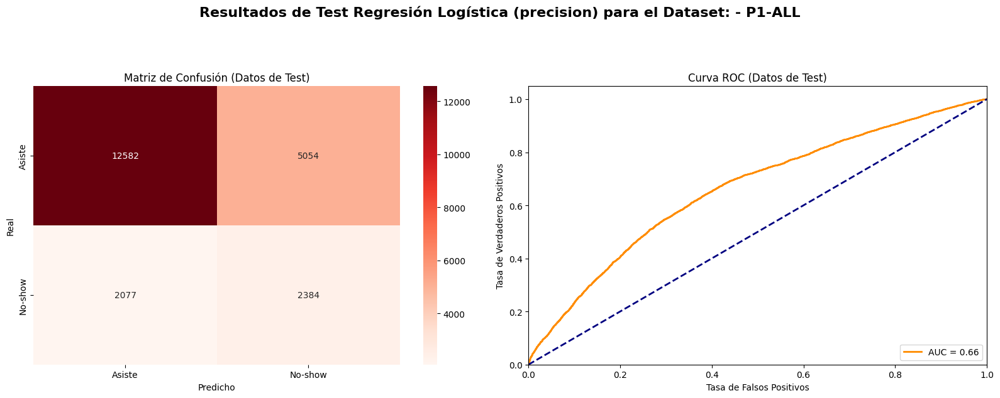

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8488789413751129
Precision (Datos de Train): 0.8268999738835205
Recall (Datos de Train): 0.8362327006373913
F1 Score (Datos de Train): 0.8315401518003309
[[60599  9942]
 [ 9301 47493]]
AUC (Datos de train): 0.9338955409340702


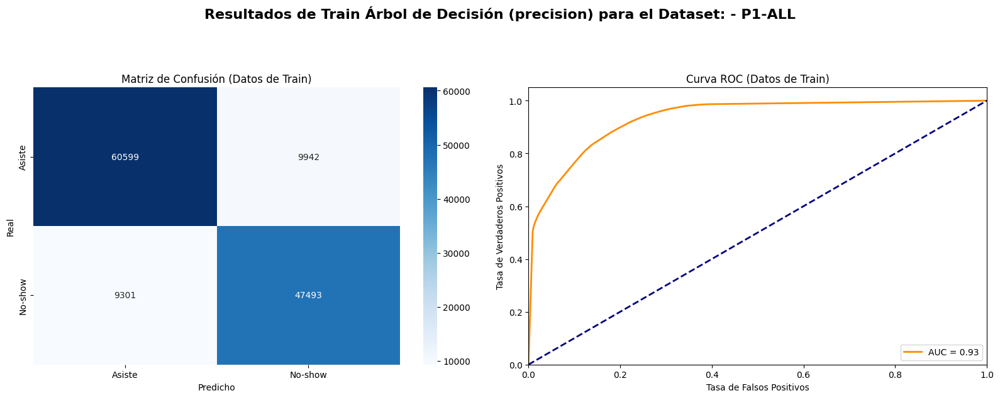

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7069285423360637
Precision (Datos de Test): 0.30531400966183575
Recall (Datos de Test): 0.354180676978256
F1 Score (Datos de Test): 0.32793690327936903
[[14041  3595]
 [ 2881  1580]]
AUC (Datos de Test): 0.6266650313147147


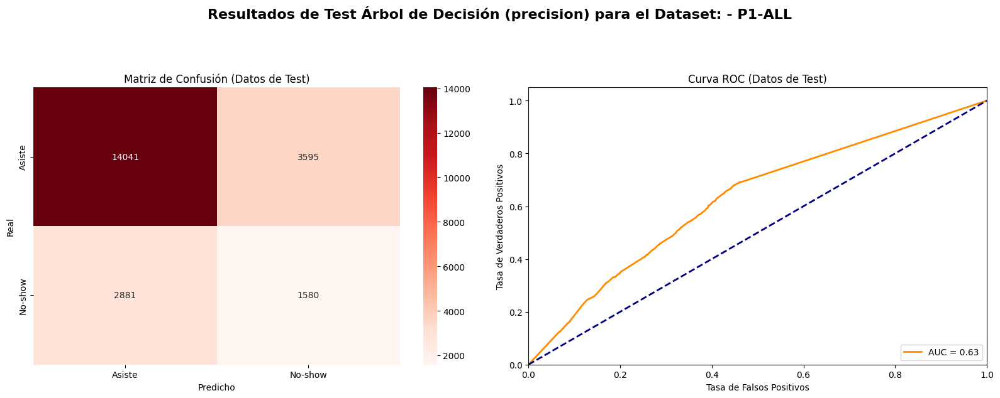

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 100, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6390387560372246
Precision (Datos de Train): 0.6369314015525045
Recall (Datos de Train): 0.4435327675458675
F1 Score (Datos de Train): 0.5229233052738652
[[56182 14359]
 [31604 25190]]
AUC (Datos de train): 0.6952651141945325


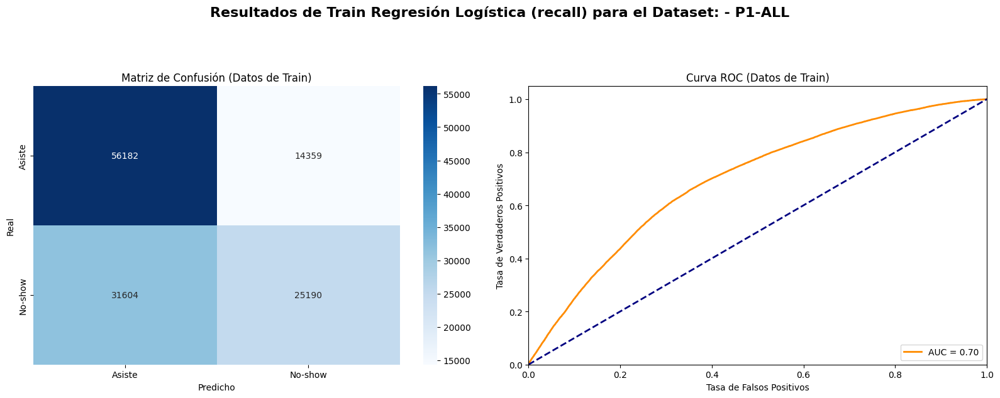

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.676969724396977
Precision (Datos de Test): 0.320263193232174
Recall (Datos de Test): 0.5346334902488231
F1 Score (Datos de Test): 0.40057104467584814
[[12574  5062]
 [ 2076  2385]]
AUC (Datos de Test): 0.6596935925471676


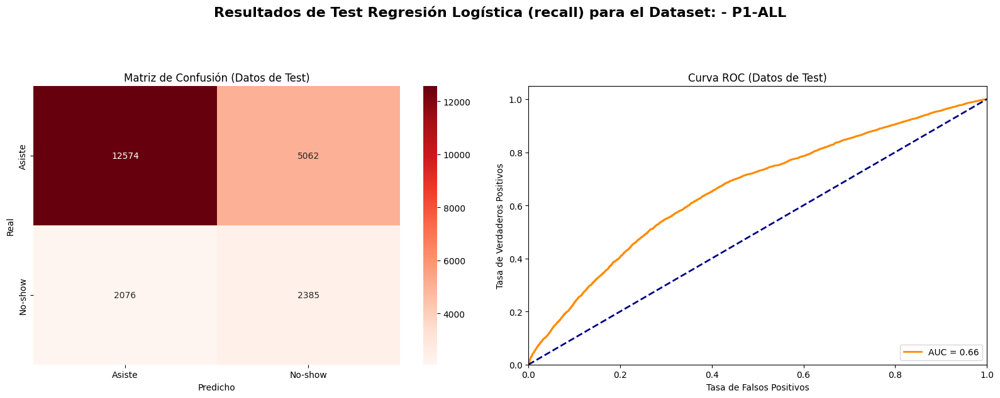

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 3, 'min_samples_split': 5}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8265205952801665
Precision (Datos de Train): 0.786847847649276
Recall (Datos de Train): 0.8380814874810719
F1 Score (Datos de Train): 0.8116569752570639
[[57647 12894]
 [ 9196 47598]]
AUC (Datos de train): 0.9153137625358468


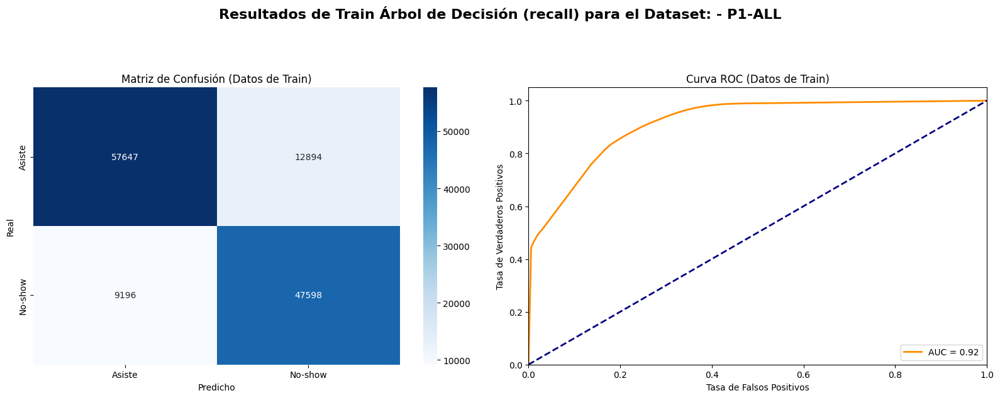

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6999140154772141
Precision (Datos de Test): 0.32201443569553806
Recall (Datos de Test): 0.4400358663976687
F1 Score (Datos de Test): 0.3718859524486123
[[13503  4133]
 [ 2498  1963]]
AUC (Datos de Test): 0.6465595784417041


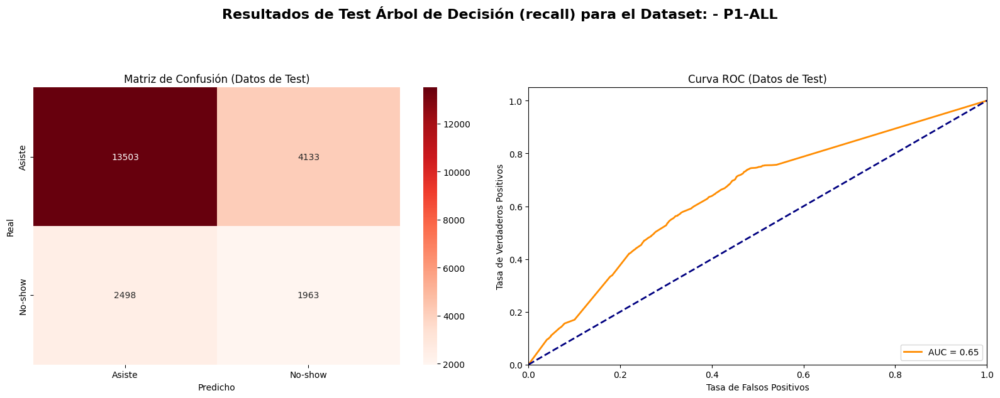

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7114697451604036
Precision (Datos de Train): 0.6488878329819143
Recall (Datos de Train): 0.7694474768461457
F1 Score (Datos de Train): 0.7040438214918641
[[46895 23646]
 [13094 43700]]
AUC (Datos de Train): 0.7926428108633474


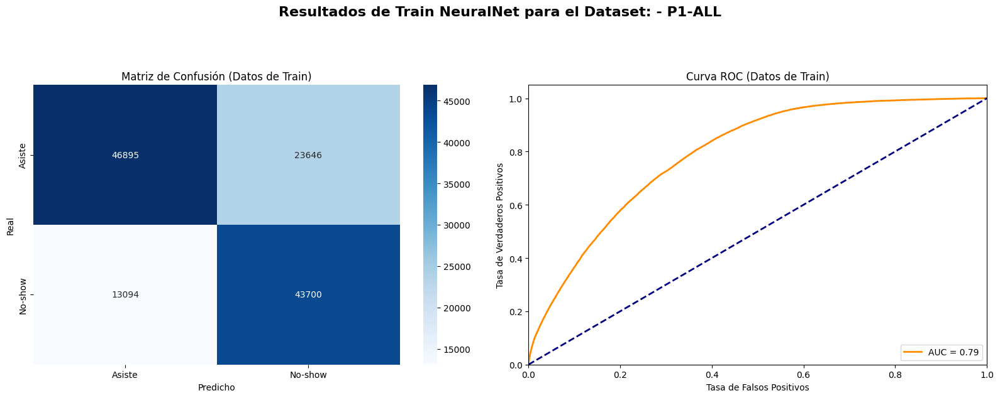

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.5949676426664253
Precision (Datos de Test): 0.2885539331135186
Recall (Datos de Test): 0.6866173503698723
F1 Score (Datos de Test): 0.4063412045635447
[[10084  7552]
 [ 1398  3063]]
AUC (Datos de Test): 0.6735685166709552


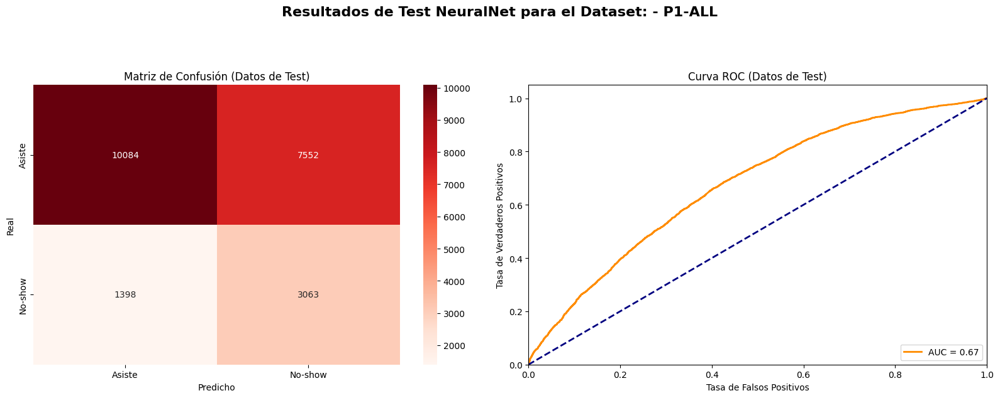

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6896140102878234
Precision (Datos de Train): 0.6138782292202397
Recall (Datos de Train): 0.8196464415255132
F1 Score (Datos de Train): 0.7019943449575872
[[41261 29280]
 [10243 46551]]
AUC (Datos de Train): 0.7687137362563735


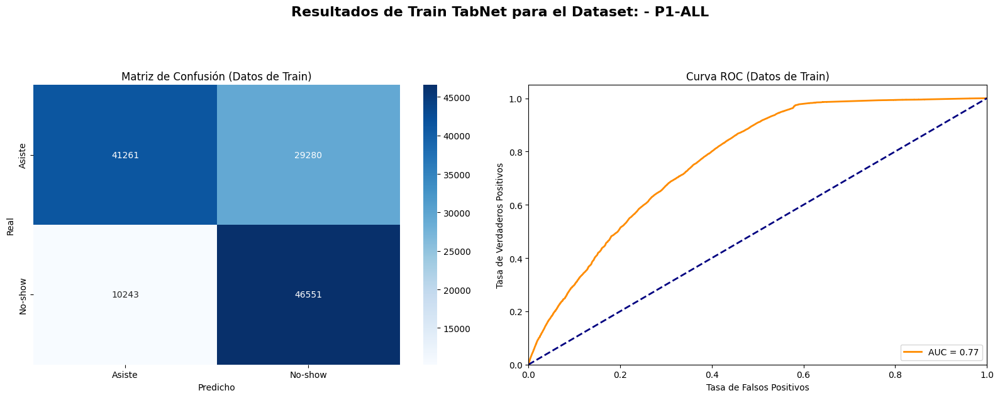

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.5795809385889488
Precision (Datos de Test): 0.2980005019660336
Recall (Datos de Test): 0.7984756780990809
F1 Score (Datos de Test): 0.4340197392469843
[[9245 8391]
 [ 899 3562]]
AUC (Datos de Test): 0.7202911295083334


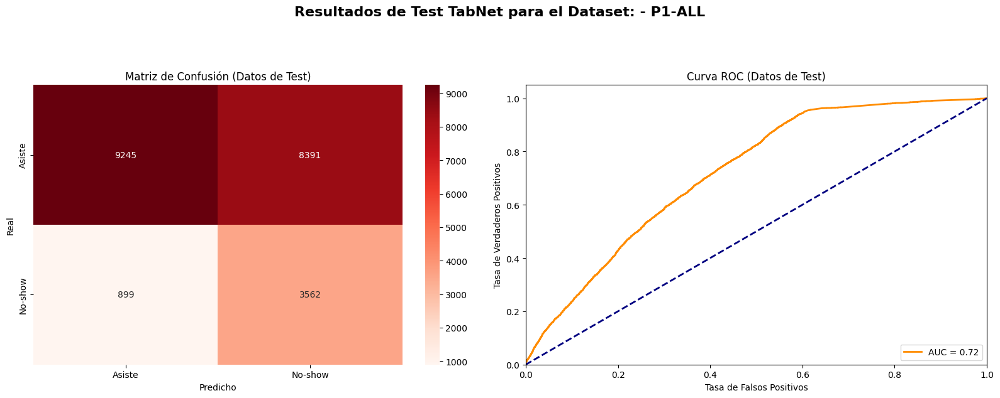


Ejecutando modelo para el dataset: P2-NOCONDITIONS

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 100, 'solver': 'sag'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.639138372434633
Precision (Datos de Train): 0.6317983055479639
Recall (Datos de Train): 0.4391935215749602
F1 Score (Datos de Train): 0.5181771059525644
[[42421 10778]
 [23615 18494]]
AUC (Datos de train): 0.7002691578684751


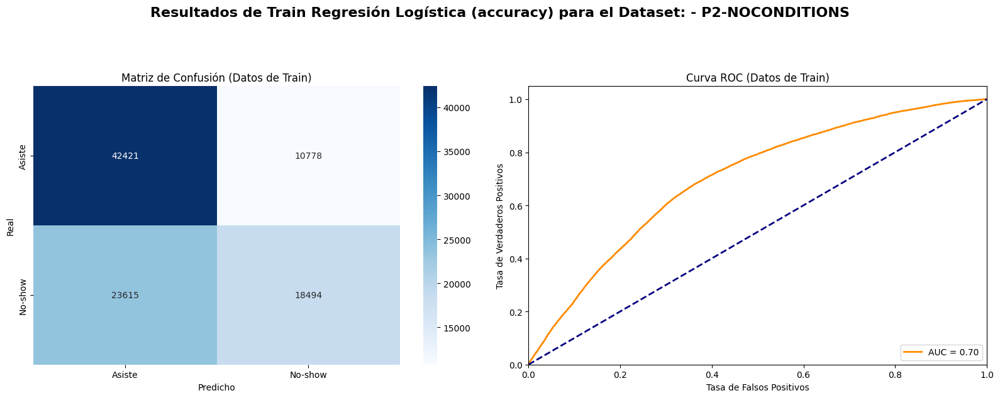

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6745347523633985
Precision (Datos de Test): 0.32744924977934686
Recall (Datos de Test): 0.5271383915885195
F1 Score (Datos de Test): 0.40396341463414637
[[9490 3810]
 [1664 1855]]
AUC (Datos de Test): 0.6611429789307027


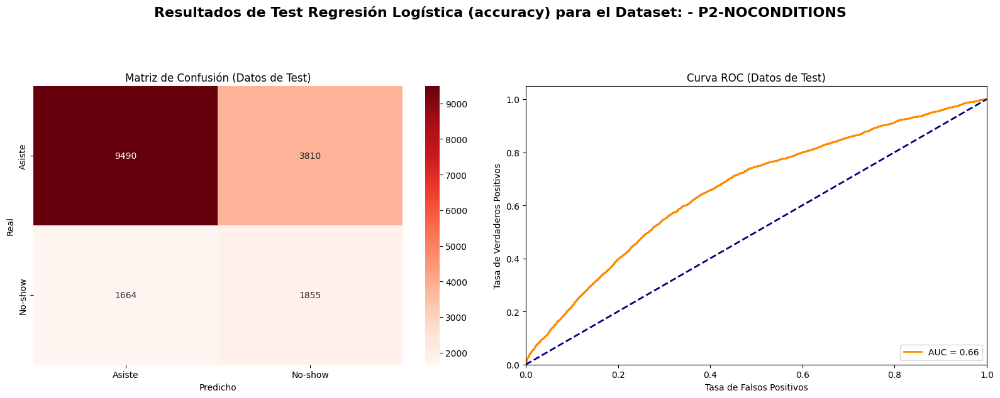

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8363411256137995
Precision (Datos de Train): 0.8202353054864349
Recall (Datos de Train): 0.8062884419007813
F1 Score (Datos de Train): 0.8132020789921199
[[45758  7441]
 [ 8157 33952]]
AUC (Datos de train): 0.9281536409276113


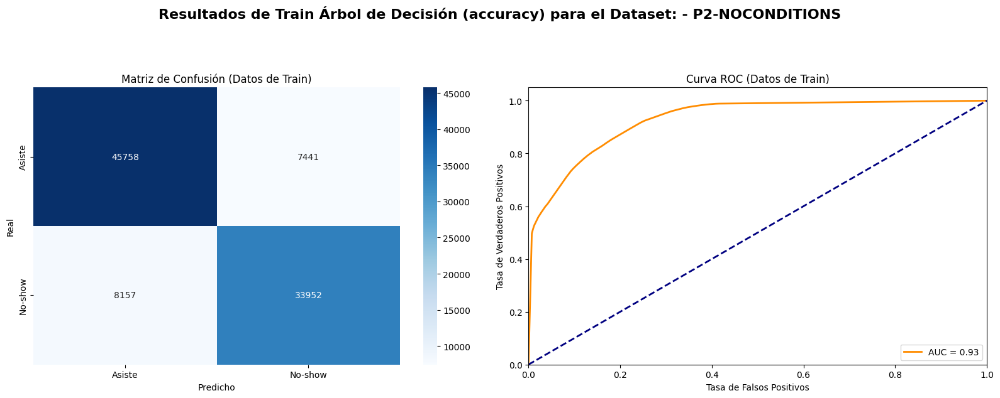

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7273916404066829
Precision (Datos de Test): 0.34568616097278515
Recall (Datos de Test): 0.3393009377664109
F1 Score (Datos de Test): 0.34246378890004303
[[11040  2260]
 [ 2325  1194]]
AUC (Datos de Test): 0.6332862420330451


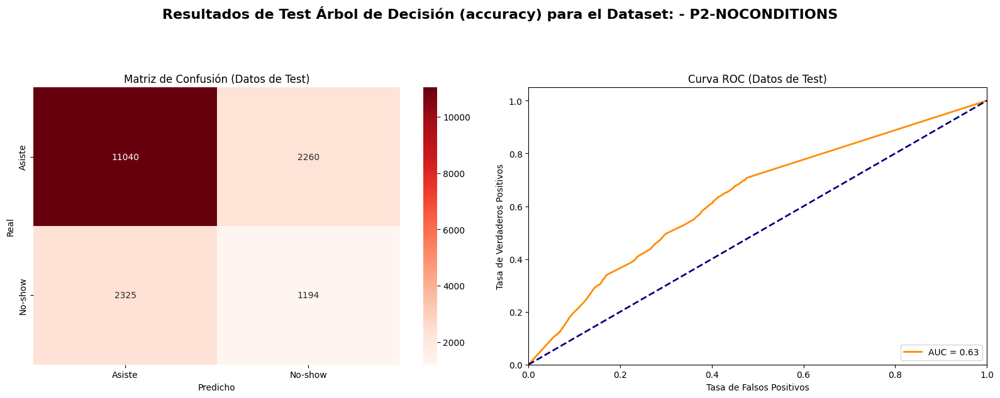

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 200, 'solver': 'saga'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6389495110588828
Precision (Datos de Train): 0.6317158305386352
Recall (Datos de Train): 0.43838609323422545
F1 Score (Datos de Train): 0.5175870238746128
[[42437 10762]
 [23649 18460]]
AUC (Datos de train): 0.7001684711616452


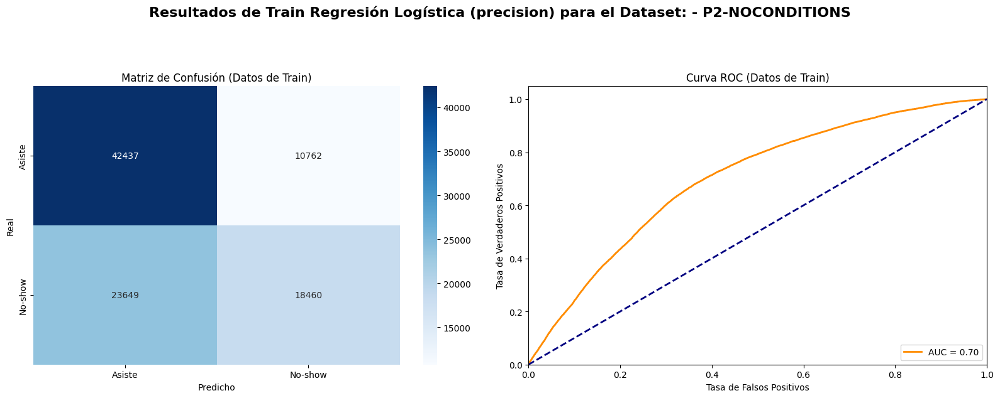

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6747725786313098
Precision (Datos de Test): 0.3275587767367863
Recall (Datos de Test): 0.5265700483091788
F1 Score (Datos de Test): 0.40387968613775066
[[9496 3804]
 [1666 1853]]
AUC (Datos de Test): 0.6610442453106338


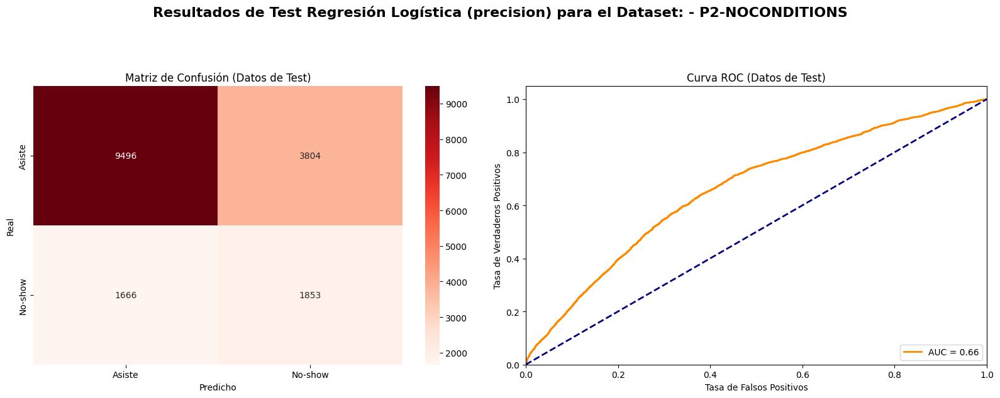

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8400553993368868
Precision (Datos de Train): 0.8164981974977027
Recall (Datos de Train): 0.8229357144553421
F1 Score (Datos de Train): 0.8197043169722058
[[45411  7788]
 [ 7456 34653]]
AUC (Datos de train): 0.9282744166309748


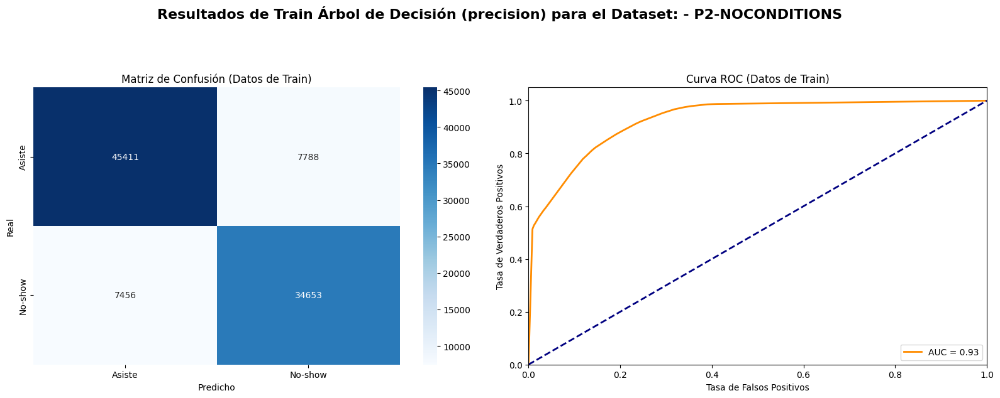

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7152625007432071
Precision (Datos de Test): 0.32920925228617537
Recall (Datos de Test): 0.34782608695652173
F1 Score (Datos de Test): 0.33826171065358573
[[10806  2494]
 [ 2295  1224]]
AUC (Datos de Test): 0.6402284804081816


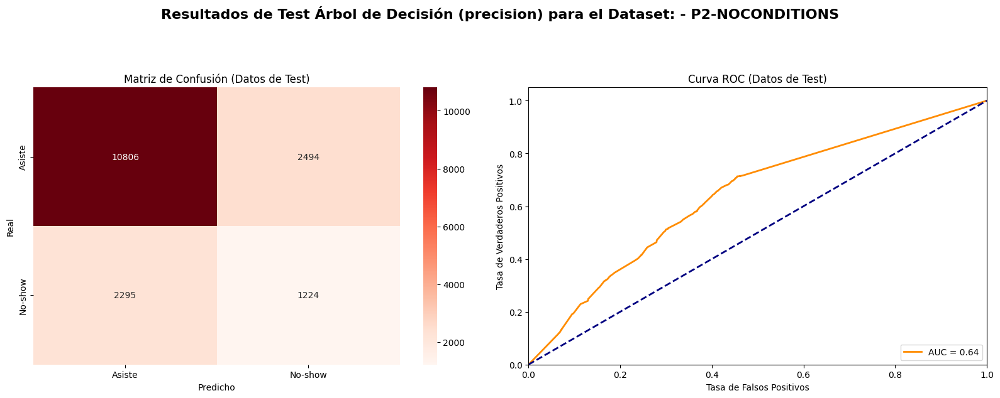

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'liblinear'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6391908339278969
Precision (Datos de Train): 0.6317531824852394
Recall (Datos de Train): 0.4395972357453276
F1 Score (Datos de Train): 0.518442795126733
[[42409 10790]
 [23598 18511]]
AUC (Datos de train): 0.7001805363890949


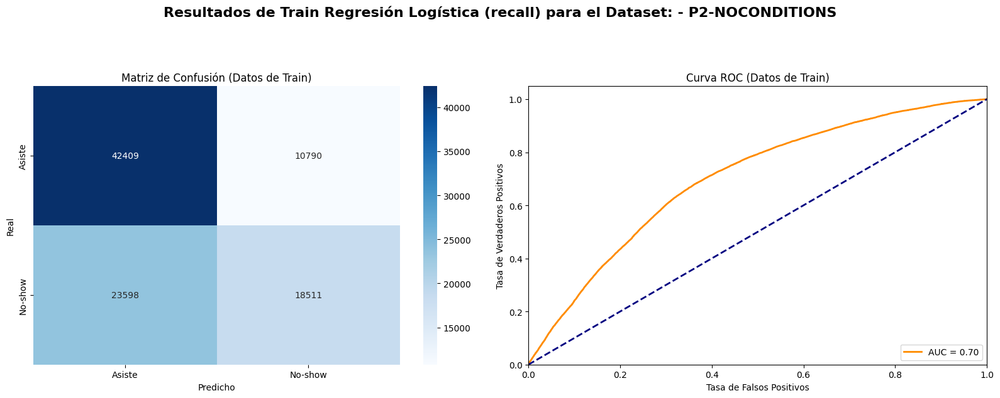

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6742374695285094
Precision (Datos de Test): 0.3271604938271605
Recall (Datos de Test): 0.5271383915885195
F1 Score (Datos de Test): 0.40374360648601587
[[9485 3815]
 [1664 1855]]
AUC (Datos de Test): 0.6610547147920952


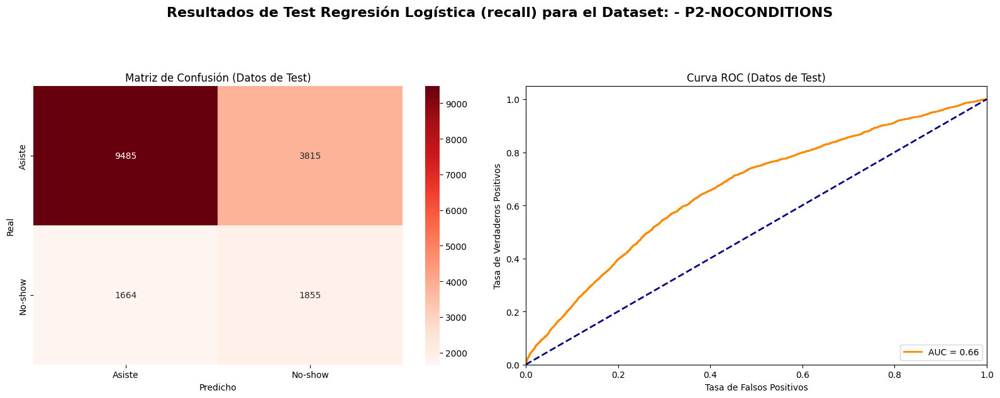

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 3, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.784635077852856
Precision (Datos de Train): 0.7616438356164383
Recall (Datos de Train): 0.7460162910541689
F1 Score (Datos de Train): 0.7537490702305828
[[43368  9831]
 [10695 31414]]
AUC (Datos de train): 0.8835212690485854


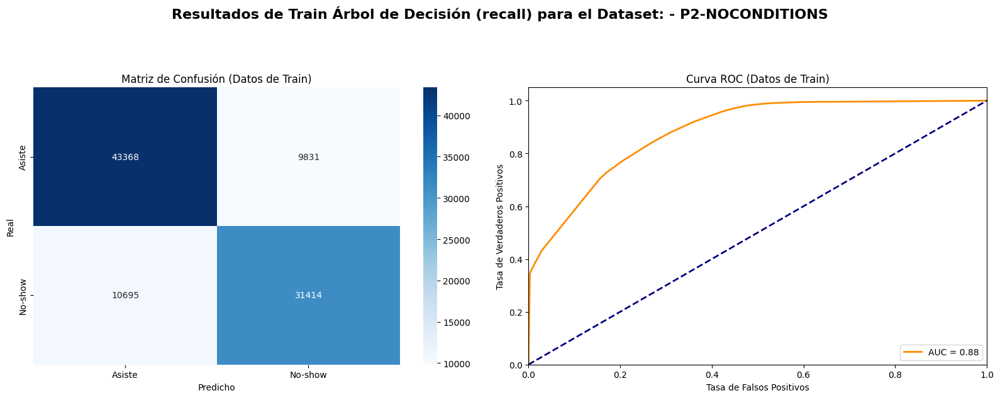

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.707592603603068
Precision (Datos de Test): 0.34629751702922434
Recall (Datos de Test): 0.44785450412048877
F1 Score (Datos de Test): 0.3905824039653036
[[10325  2975]
 [ 1943  1576]]
AUC (Datos de Test): 0.6847459975599698


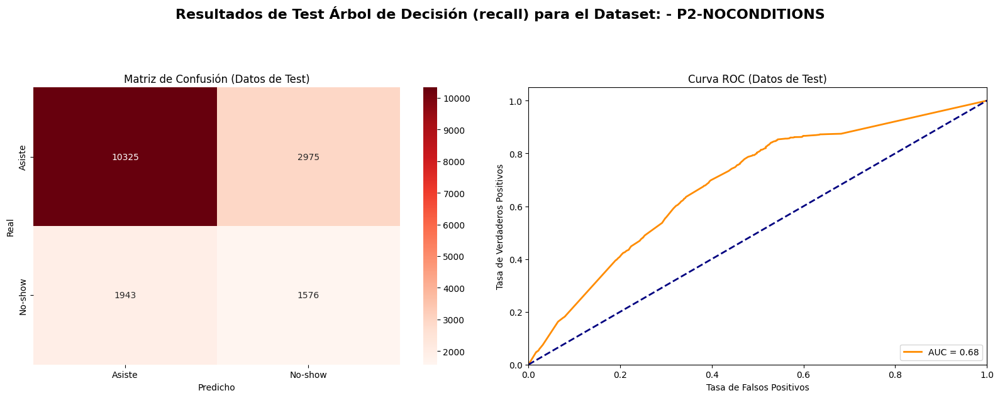

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7180719351995635
Precision (Datos de Train): 0.6577764893462821
Recall (Datos de Train): 0.7543755491700112
F1 Score (Datos de Train): 0.7027720625649875
[[36672 16527]
 [10343 31766]]
AUC (Datos de Train): 0.7960783601275327


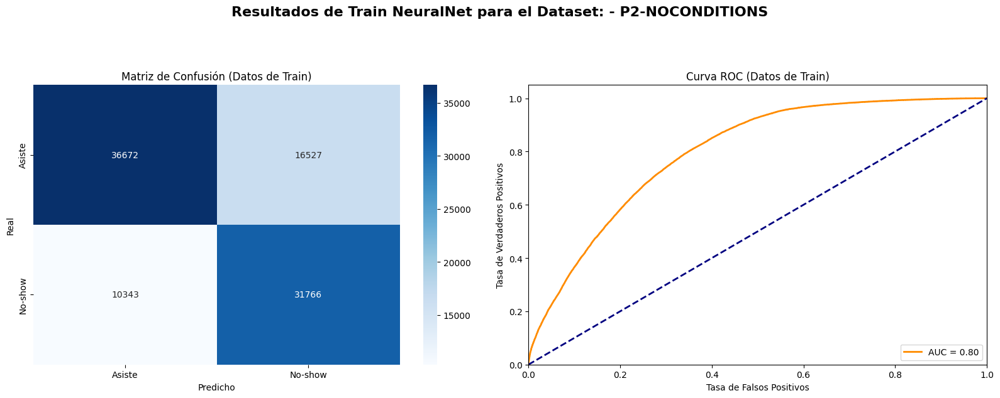

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6193590582079791
Precision (Datos de Test): 0.31139604867198745
Recall (Datos de Test): 0.6763285024154589
F1 Score (Datos de Test): 0.4264468733201935
[[8037 5263]
 [1139 2380]]
AUC (Datos de Test): 0.6952077230587126


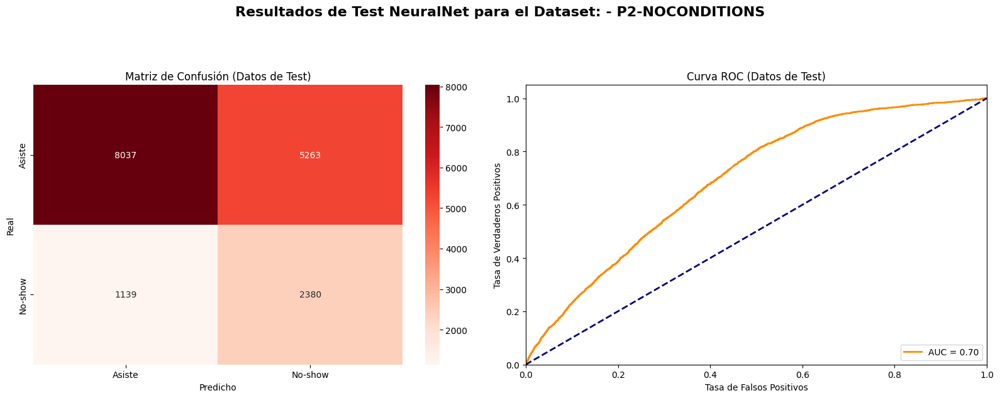

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7092059428379569
Precision (Datos de Train): 0.6389596848934198
Recall (Datos de Train): 0.7858890023510413
F1 Score (Datos de Train): 0.7048487236557651
[[34500 18699]
 [ 9016 33093]]
AUC (Datos de Train): 0.7884862211185386


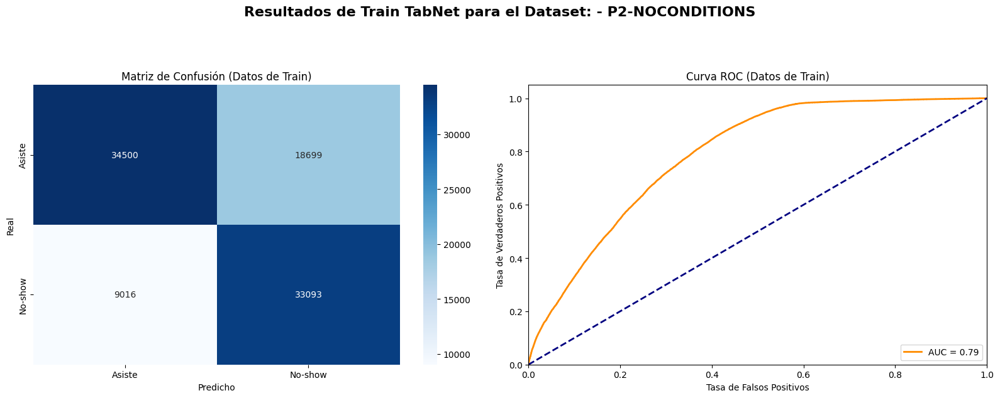

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6414174445567513
Precision (Datos de Test): 0.32704489121454144
Recall (Datos de Test): 0.6749076442171071
F1 Score (Datos de Test): 0.4405899267229385
[[8413 4887]
 [1144 2375]]
AUC (Datos de Test): 0.7202419304869163


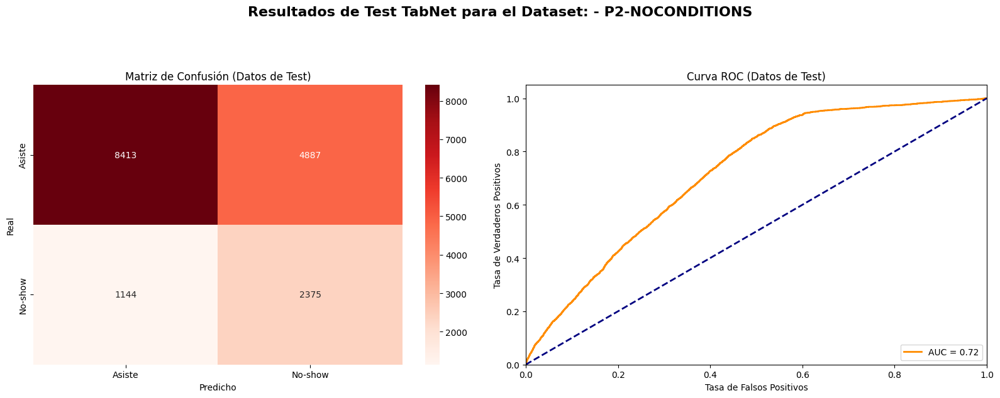


Ejecutando modelo para el dataset: P3-AGE

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'liblinear'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6431497621731599
Precision (Datos de Train): 0.6313422094278518
Recall (Datos de Train): 0.4414114095226115
F1 Score (Datos de Train): 0.5195632056265038
[[16374  4098]
 [ 8881  7018]]
AUC (Datos de train): 0.7199792488933601


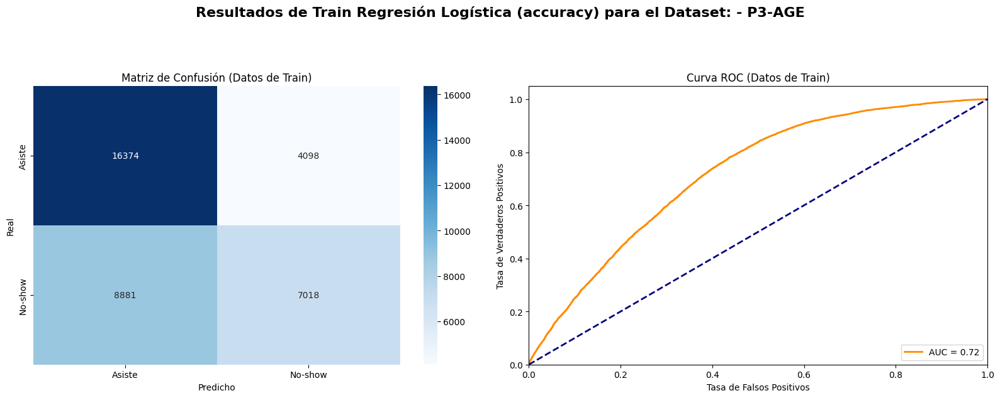

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6893347101342381
Precision (Datos de Test): 0.39761248852157943
Recall (Datos de Test): 0.5216867469879518
F1 Score (Datos de Test): 0.4512767066180302
[[3807 1312]
 [ 794  866]]
AUC (Datos de Test): 0.6914105729422868


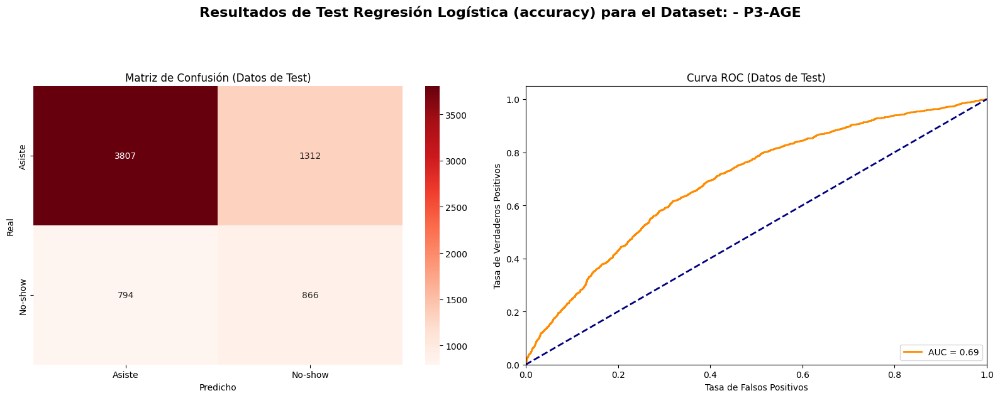

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8322564680652168
Precision (Datos de Train): 0.7685266388949792
Recall (Datos de Train): 0.88187936348198
F1 Score (Datos de Train): 0.8213103710863134
[[16249  4223]
 [ 1878 14021]]
AUC (Datos de train): 0.918150361758739


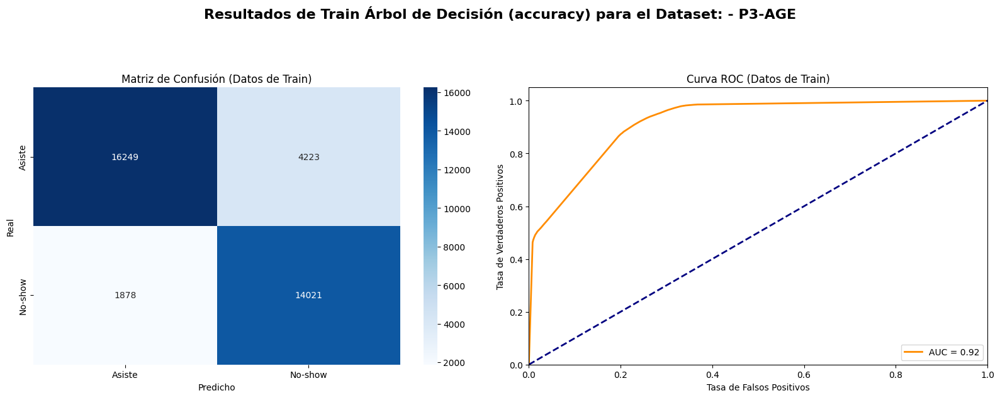

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6925800265525889
Precision (Datos de Test): 0.38427947598253276
Recall (Datos de Test): 0.42409638554216866
F1 Score (Datos de Test): 0.4032073310423826
[[3991 1128]
 [ 956  704]]
AUC (Datos de Test): 0.6327357682341007


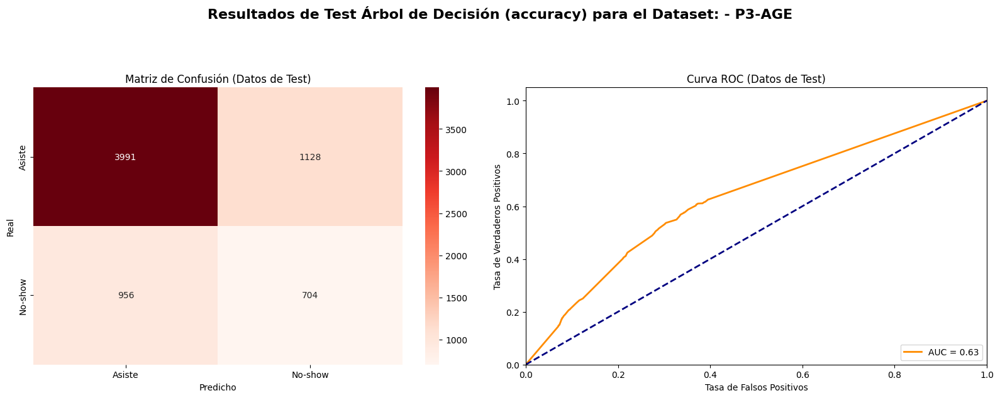

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6425723790932336
Precision (Datos de Train): 0.6312833982429128
Recall (Datos de Train): 0.438392351720234
F1 Score (Datos de Train): 0.5174461766889383
[[16401  4071]
 [ 8929  6970]]
AUC (Datos de train): 0.7199535302971638


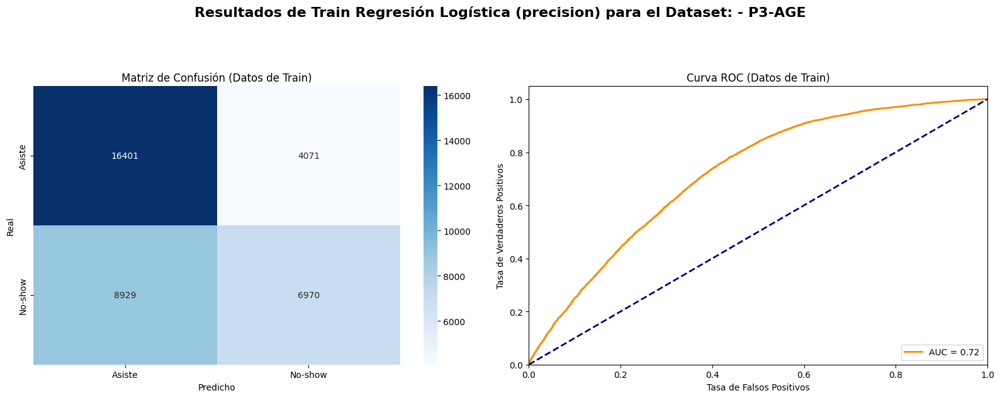

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6900722820474996
Precision (Datos de Test): 0.39815242494226327
Recall (Datos de Test): 0.519277108433735
F1 Score (Datos de Test): 0.450718954248366
[[3816 1303]
 [ 798  862]]
AUC (Datos de Test): 0.6914014526557098


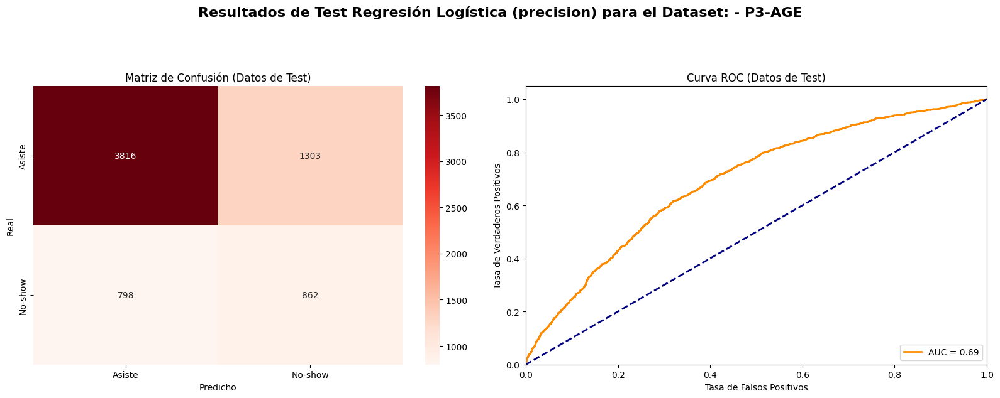

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8350334057353386
Precision (Datos de Train): 0.7711311969323473
Recall (Datos de Train): 0.8854015975847538
F1 Score (Datos de Train): 0.8243251156526322
[[16294  4178]
 [ 1822 14077]]
AUC (Datos de train): 0.9196839087134173


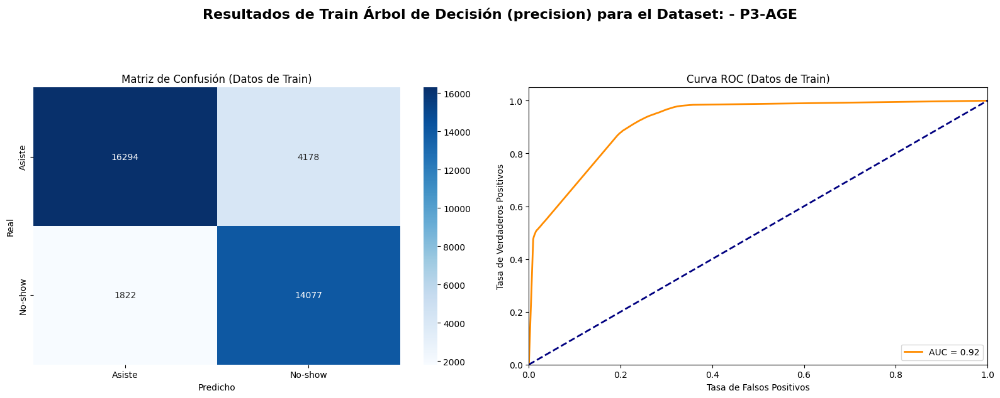

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6896297388995427
Precision (Datos de Test): 0.3792165397170838
Recall (Datos de Test): 0.4198795180722892
F1 Score (Datos de Test): 0.3985134362492853
[[3978 1141]
 [ 963  697]]
AUC (Datos de Test): 0.6229941253586332


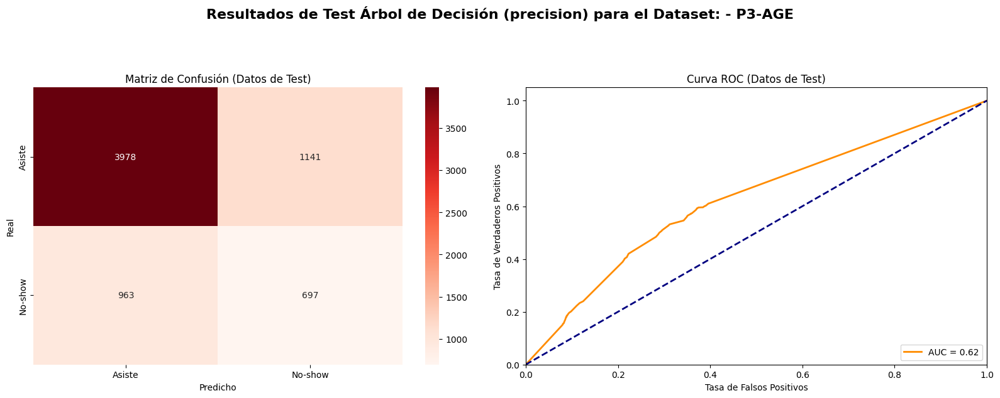

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'liblinear'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6431497621731599
Precision (Datos de Train): 0.6313422094278518
Recall (Datos de Train): 0.4414114095226115
F1 Score (Datos de Train): 0.5195632056265038
[[16374  4098]
 [ 8881  7018]]
AUC (Datos de train): 0.7199792488933601


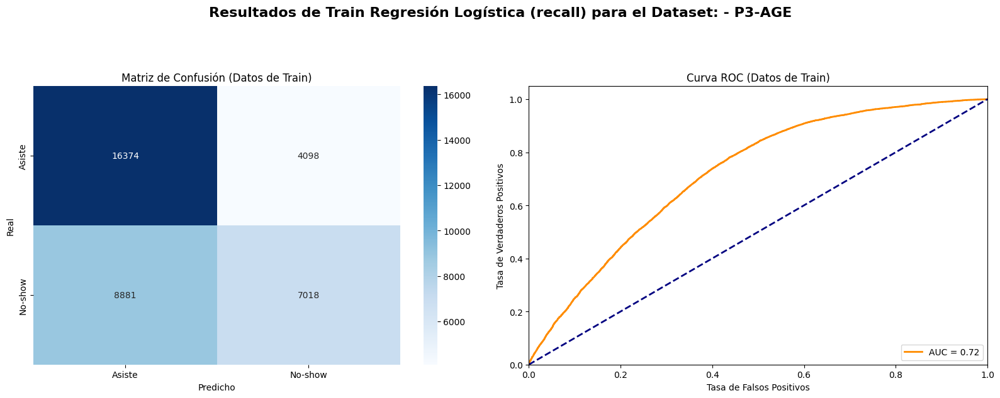

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6893347101342381
Precision (Datos de Test): 0.39761248852157943
Recall (Datos de Test): 0.5216867469879518
F1 Score (Datos de Test): 0.4512767066180302
[[3807 1312]
 [ 794  866]]
AUC (Datos de Test): 0.6914105729422868


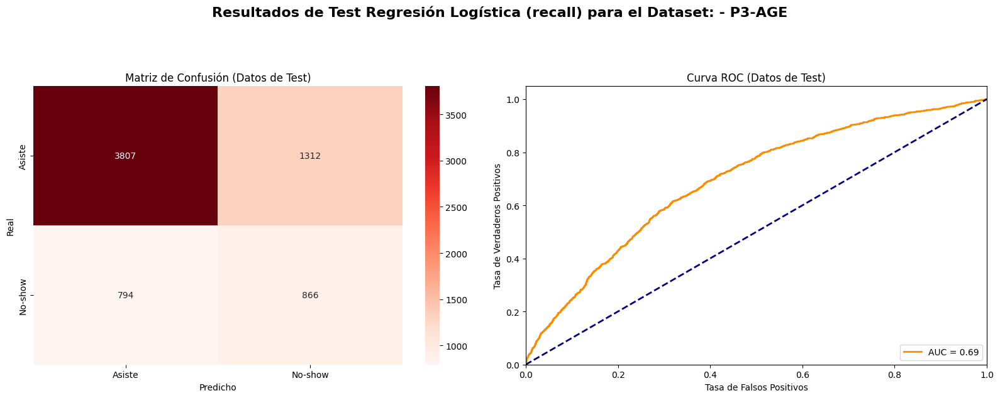

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 3, 'min_samples_split': 5}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7882103873965522
Precision (Datos de Train): 0.7119582083376436
Recall (Datos de Train): 0.8657777218692999
F1 Score (Datos de Train): 0.7813697385973377
[[14903  5569]
 [ 2134 13765]]
AUC (Datos de train): 0.882831785682781


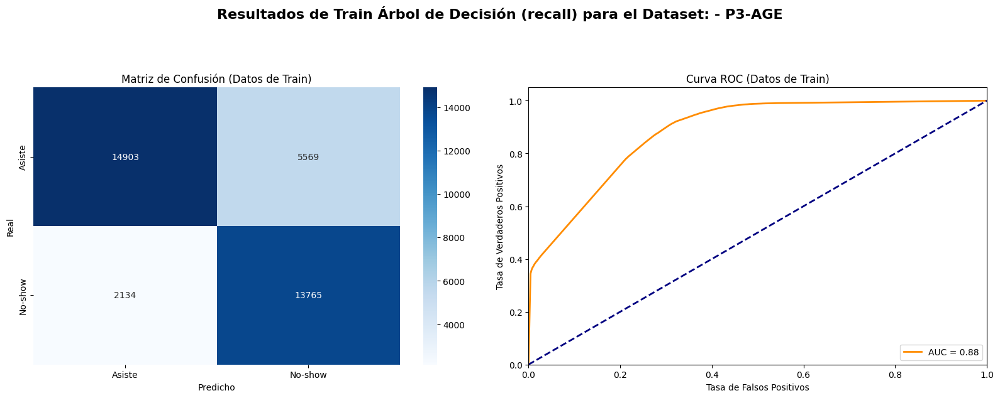

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6490632836701579
Precision (Datos de Test): 0.35918527222875046
Recall (Datos de Test): 0.5524096385542169
F1 Score (Datos de Test): 0.43531924994065985
[[3483 1636]
 [ 743  917]]
AUC (Datos de Test): 0.6533740353090424


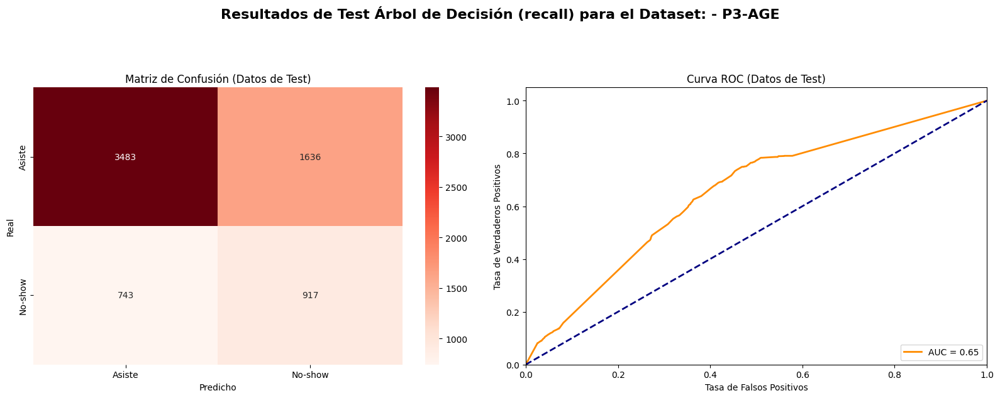

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7203266338566441
Precision (Datos de Train): 0.6470497612078262
Recall (Datos de Train): 0.7925026731240958
F1 Score (Datos de Train): 0.7124279090806287
[[13599  6873]
 [ 3299 12600]]
AUC (Datos de Train): 0.8024644277189285


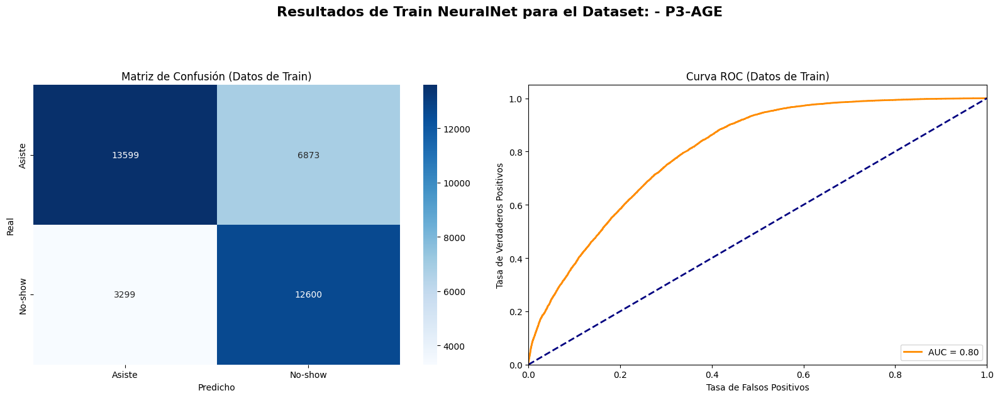

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6219206372621331
Precision (Datos de Test): 0.3565300285986654
Recall (Datos de Test): 0.6759036144578313
F1 Score (Datos de Test): 0.4668192219679634
[[3094 2025]
 [ 538 1122]]
AUC (Datos de Test): 0.692203979033932


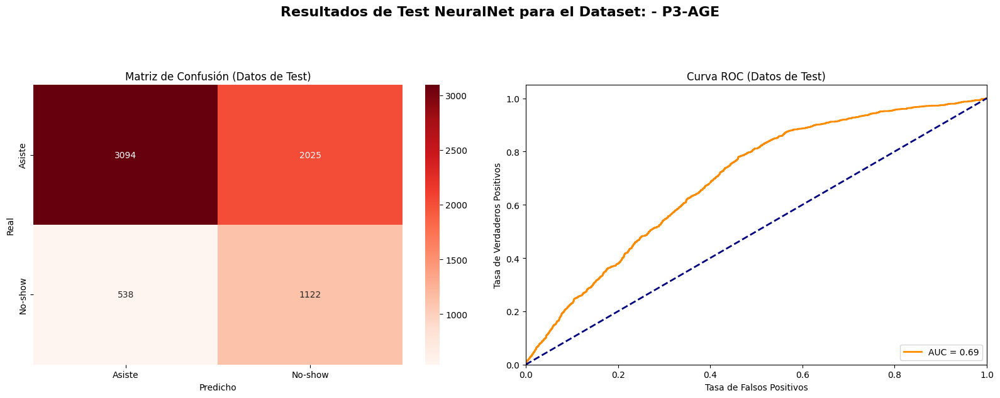

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6859036045200847
Precision (Datos de Train): 0.6020338364722514
Recall (Datos de Train): 0.8303666897289138
F1 Score (Datos de Train): 0.6980014803849001
[[11745  8727]
 [ 2697 13202]]
AUC (Datos de Train): 0.7601169018497259


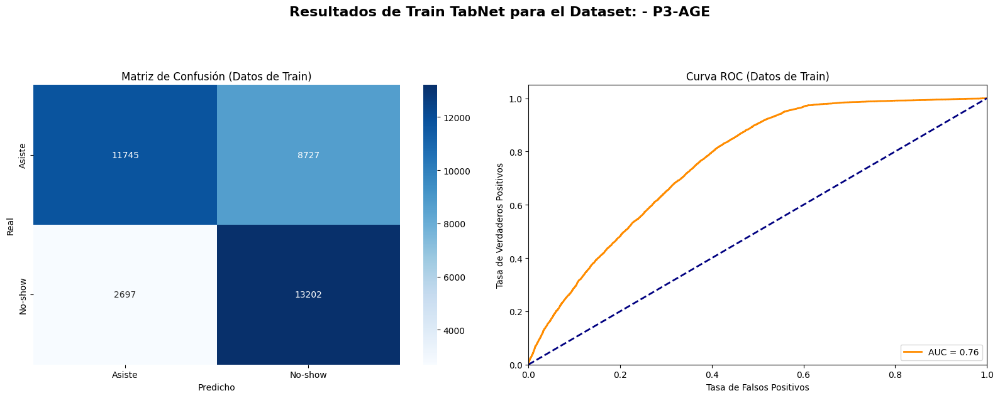

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6318041008998377
Precision (Datos de Test): 0.3667941363926068
Recall (Datos de Test): 0.6933734939759036
F1 Score (Datos de Test): 0.47978324301792413
[[3132 1987]
 [ 509 1151]]
AUC (Datos de Test): 0.7120208907519118


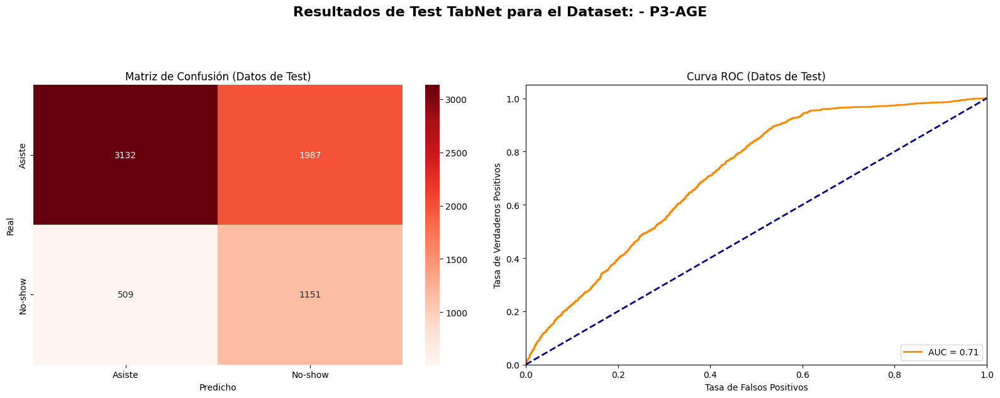


Ejecutando modelo para el dataset: P4-TIME

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6278060006078764
Precision (Datos de Train): 0.5902984474298125
Recall (Datos de Train): 0.2624369657737563
F1 Score (Datos de Train): 0.363339275103981
[[36039  5093]
 [20623  7338]]
AUC (Datos de train): 0.6352403060064458


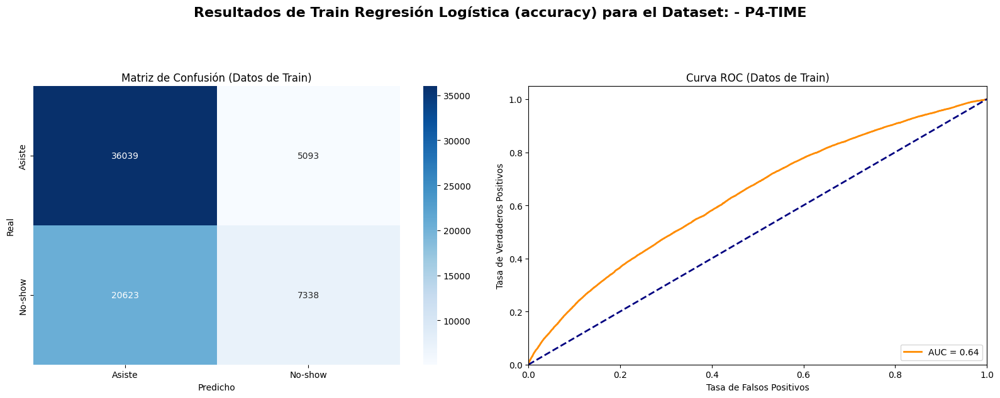

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6736878693083073
Precision (Datos de Test): 0.3885542168674699
Recall (Datos de Test): 0.2515845928815212
F1 Score (Datos de Test): 0.30541580349215747
[[8659 1624]
 [3070 1032]]
AUC (Datos de Test): 0.5943711302655569


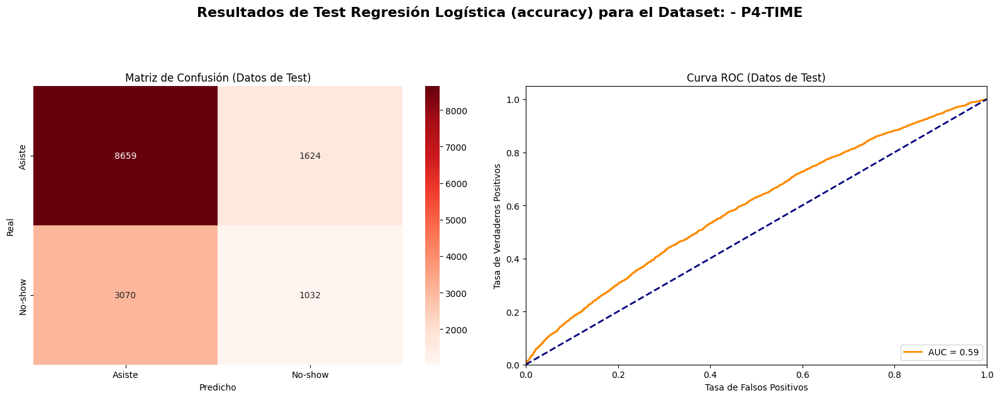

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8115728076650311
Precision (Datos de Train): 0.8839157245632066
Recall (Datos de Train): 0.6151782840384822
F1 Score (Datos de Train): 0.7254591847493727
[[38873  2259]
 [10760 17201]]
AUC (Datos de train): 0.8987117474161533


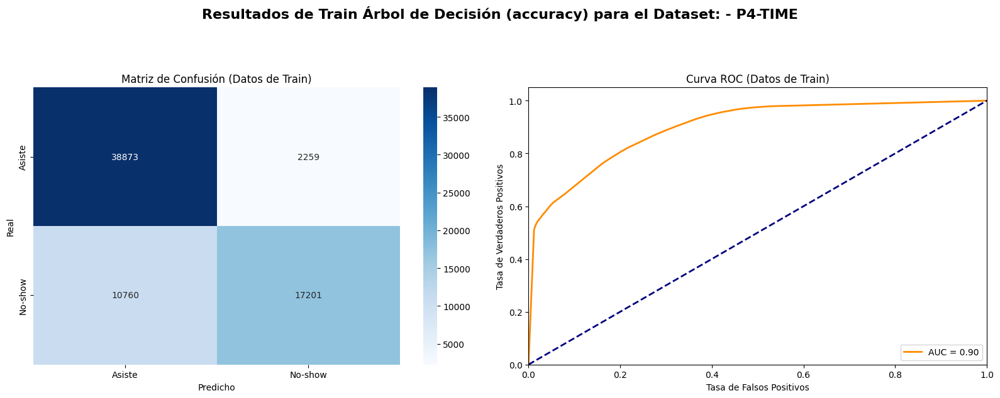

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6525547445255474
Precision (Datos de Test): 0.31518151815181517
Recall (Datos de Test): 0.1862506094588006
F1 Score (Datos de Test): 0.23414036163040147
[[8623 1660]
 [3338  764]]
AUC (Datos de Test): 0.5141449917125931


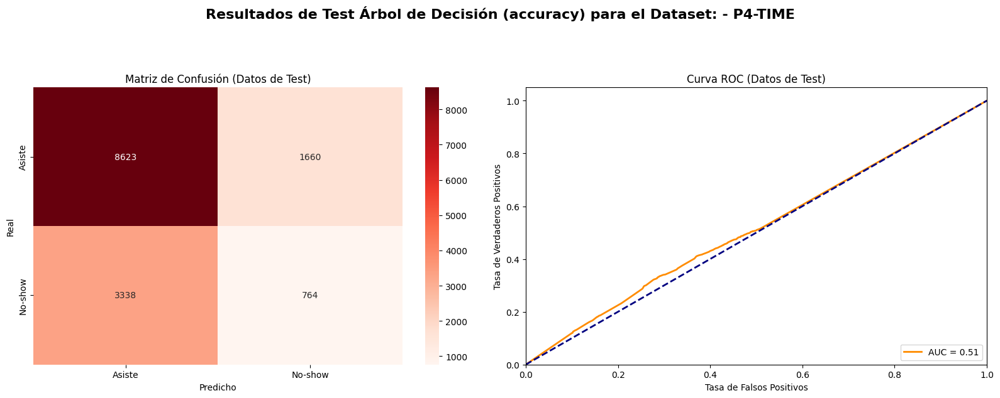

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6278060006078764
Precision (Datos de Train): 0.5902984474298125
Recall (Datos de Train): 0.2624369657737563
F1 Score (Datos de Train): 0.363339275103981
[[36039  5093]
 [20623  7338]]
AUC (Datos de train): 0.6352403060064458


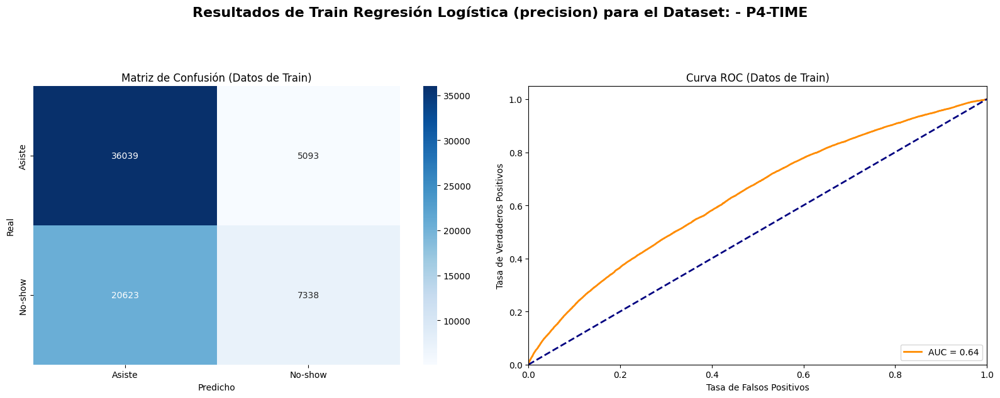

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6736878693083073
Precision (Datos de Test): 0.3885542168674699
Recall (Datos de Test): 0.2515845928815212
F1 Score (Datos de Test): 0.30541580349215747
[[8659 1624]
 [3070 1032]]
AUC (Datos de Test): 0.5943711302655569


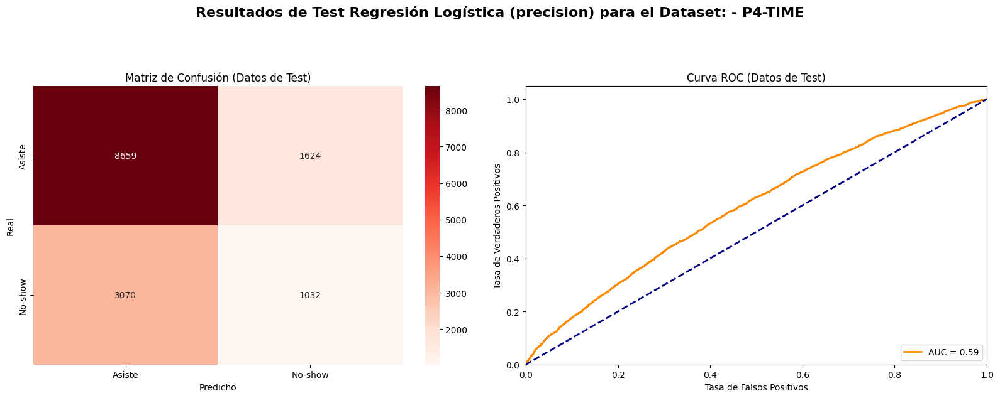

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 15, 'min_samples_leaf': 4, 'min_samples_split': 5}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.731058139030003
Precision (Datos de Train): 0.655091444257036
Recall (Datos de Train): 0.7084152927291585
F1 Score (Datos de Train): 0.6807106773428641
[[30703 10429]
 [ 8153 19808]]
AUC (Datos de train): 0.8170246123089654


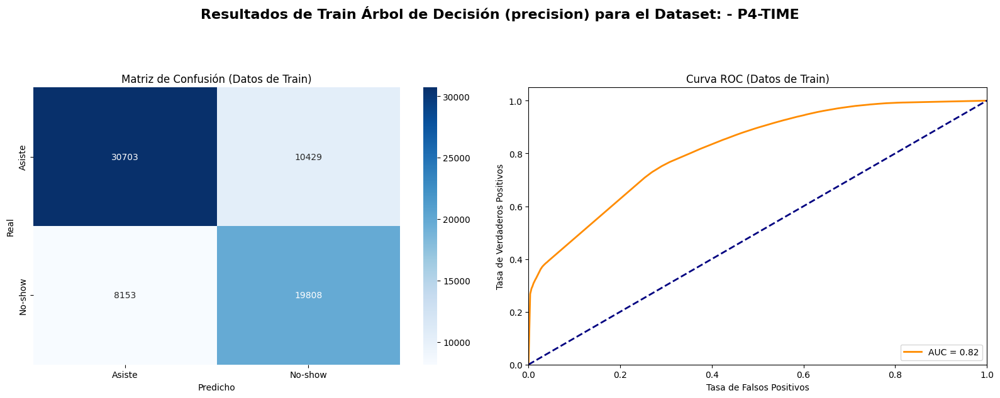

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6399721932568648
Precision (Datos de Test): 0.3437771975630983
Recall (Datos de Test): 0.2888834714773281
F1 Score (Datos de Test): 0.3139488673996556
[[8021 2262]
 [2917 1185]]
AUC (Datos de Test): 0.5270081225928362


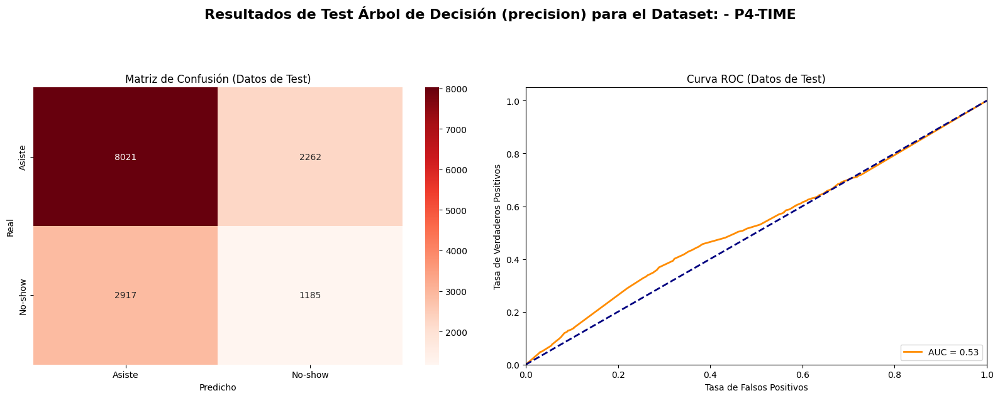

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 10, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.627791527361672
Precision (Datos de Train): 0.5894594163610269
Recall (Datos de Train): 0.2644039912735596
F1 Score (Datos de Train): 0.3650593783176555
[[35983  5149]
 [20568  7393]]
AUC (Datos de train): 0.6352757683914102


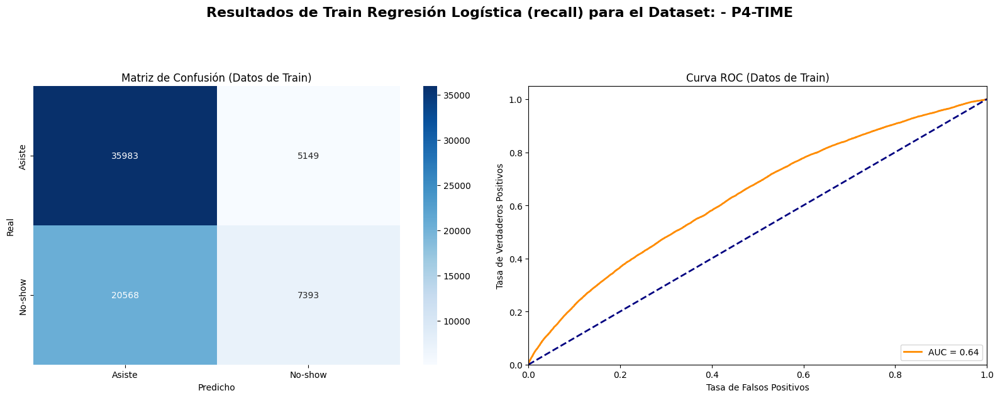

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6736878693083073
Precision (Datos de Test): 0.3893044128646223
Recall (Datos de Test): 0.2537786445636275
F1 Score (Datos de Test): 0.3072609208972845
[[8650 1633]
 [3061 1041]]
AUC (Datos de Test): 0.5944549123292063


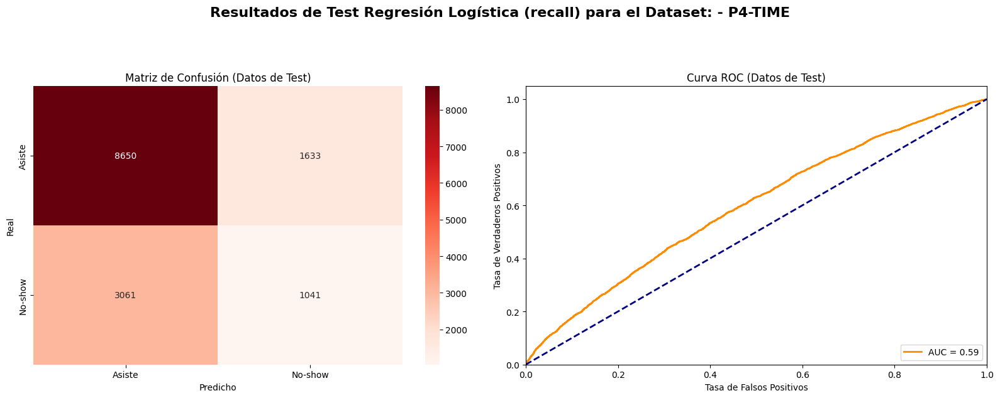

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 3, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7758673092787981
Precision (Datos de Train): 0.7129202935654548
Recall (Datos de Train): 0.7469332284253066
F1 Score (Datos de Train): 0.729530529551488
[[32722  8410]
 [ 7076 20885]]
AUC (Datos de train): 0.8693406776696302


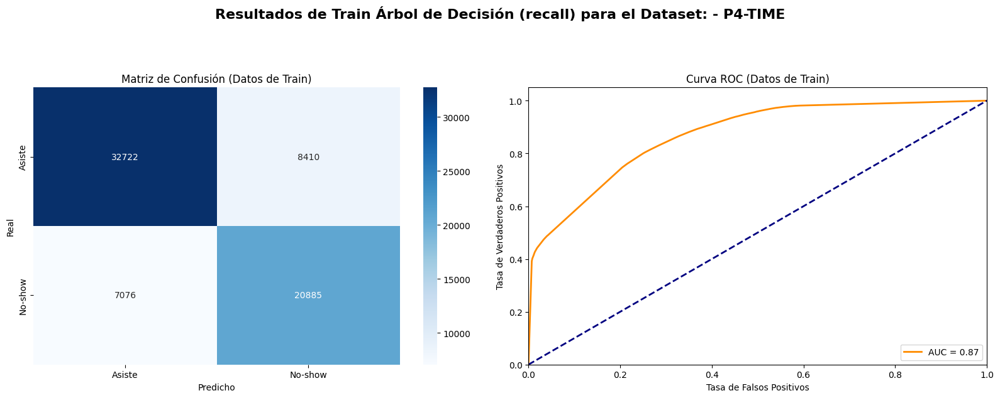

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6443517553006604
Precision (Datos de Test): 0.3429368029739777
Recall (Datos de Test): 0.2698683568990736
F1 Score (Datos de Test): 0.3020463847203274
[[8162 2121]
 [2995 1107]]
AUC (Datos de Test): 0.5235709598755037


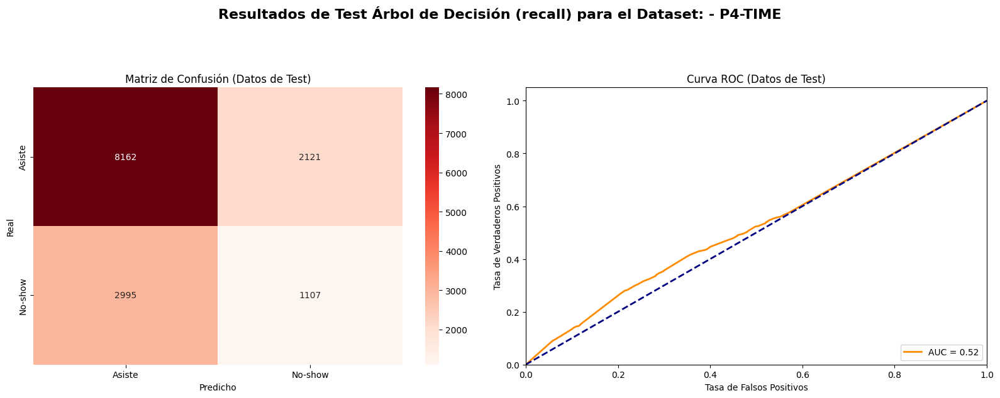

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6681718842719233
Precision (Datos de Train): 0.6497323022010708
Recall (Datos de Train): 0.39061550016093843
F1 Score (Datos de Train): 0.4879051171517277
[[35244  5888]
 [17039 10922]]
AUC (Datos de Train): 0.7110359077650434


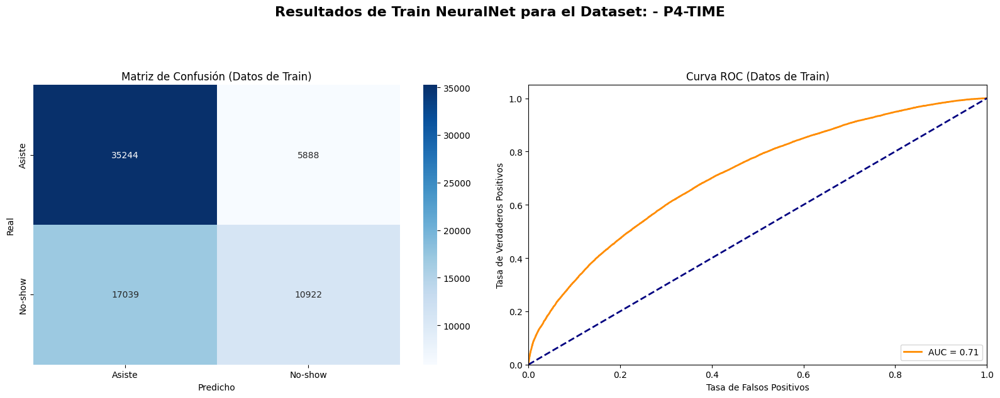

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6449078901633646
Precision (Datos de Test): 0.3619648737650933
Recall (Datos de Test): 0.32155046318868846
F1 Score (Datos de Test): 0.34056287115930806
[[7958 2325]
 [2783 1319]]
AUC (Datos de Test): 0.5763692594647061


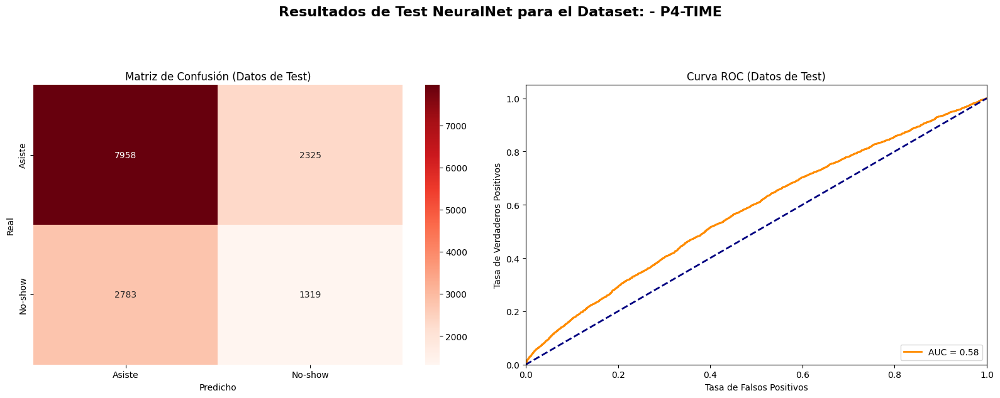

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6439002503871594
Precision (Datos de Train): 0.6055063171789553
Recall (Datos de Train): 0.34451557526554843
F1 Score (Datos de Train): 0.43916115796671984
[[34856  6276]
 [18328  9633]]
AUC (Datos de Train): 0.6727389848510987


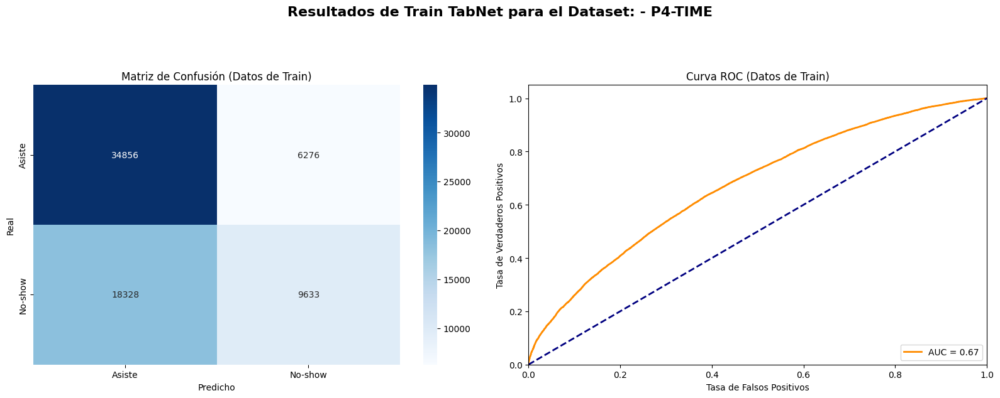

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6967674661105318
Precision (Datos de Test): 0.39666136724960255
Recall (Datos de Test): 0.12164797659678206
F1 Score (Datos de Test): 0.18619402985074626
[[9524  759]
 [3603  499]]
AUC (Datos de Test): 0.5435362683165395


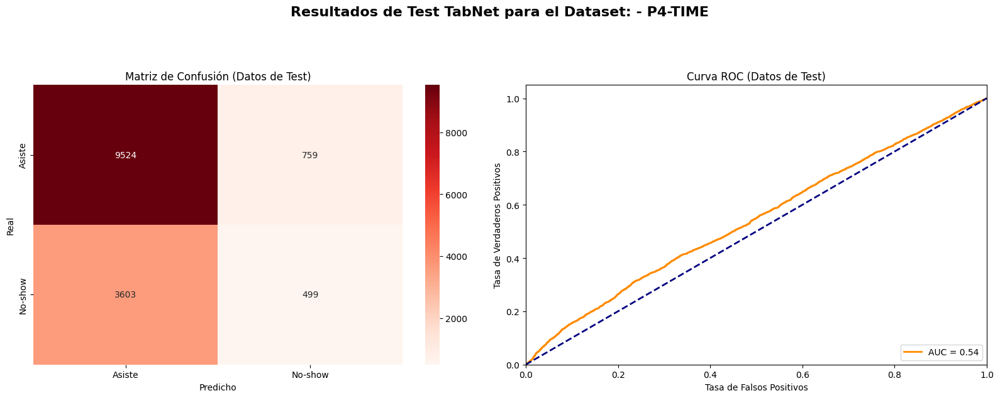


Ejecutando modelo para el dataset: P5-HEALTHCENTRE

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 100, 'solver': 'newton-cg'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6466068985733828
Precision (Datos de Train): 0.6444564964747811
Recall (Datos de Train): 0.4571459976367783
F1 Score (Datos de Train): 0.5348766176352383
[[36303  9178]
 [19755 16636]]
AUC (Datos de train): 0.7031749046882281


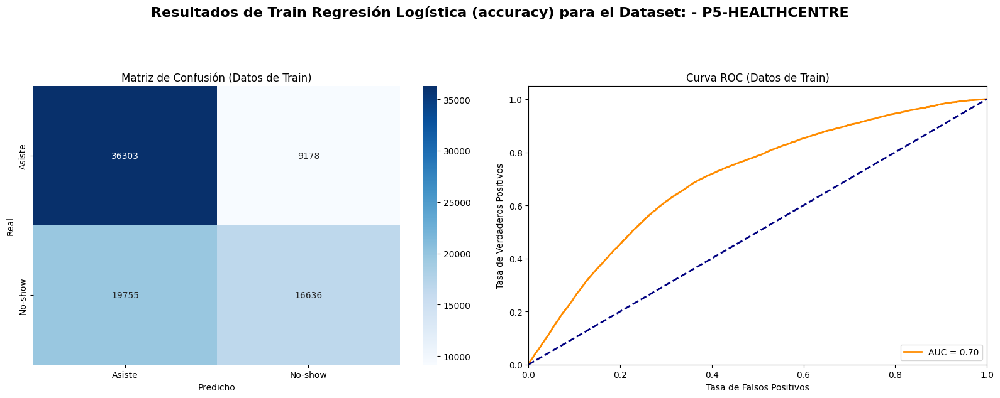

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6919195458686663
Precision (Datos de Test): 0.33115271824949244
Recall (Datos de Test): 0.5063815108658158
F1 Score (Datos de Test): 0.4004364429896345
[[8405 2965]
 [1431 1468]]
AUC (Datos de Test): 0.6654745381220529


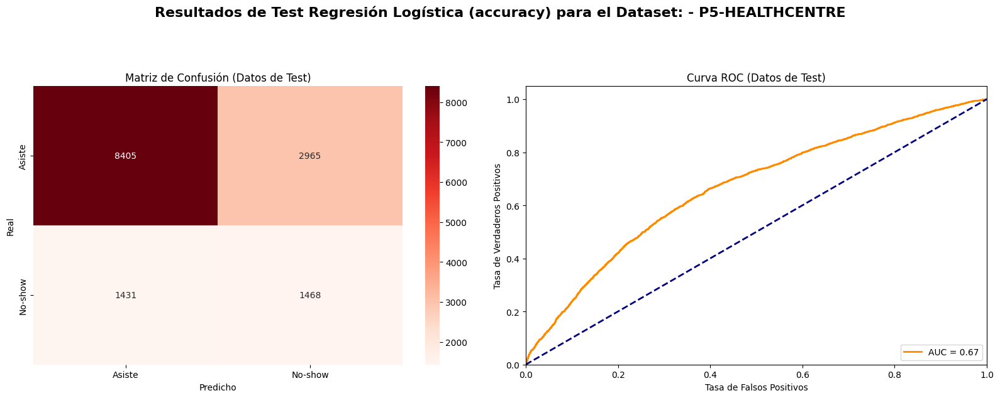

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8358535274574946
Precision (Datos de Train): 0.8014605442891668
Recall (Datos de Train): 0.8383941084334039
F1 Score (Datos de Train): 0.8195114089633221
[[37923  7558]
 [ 5881 30510]]
AUC (Datos de train): 0.9233662810750256


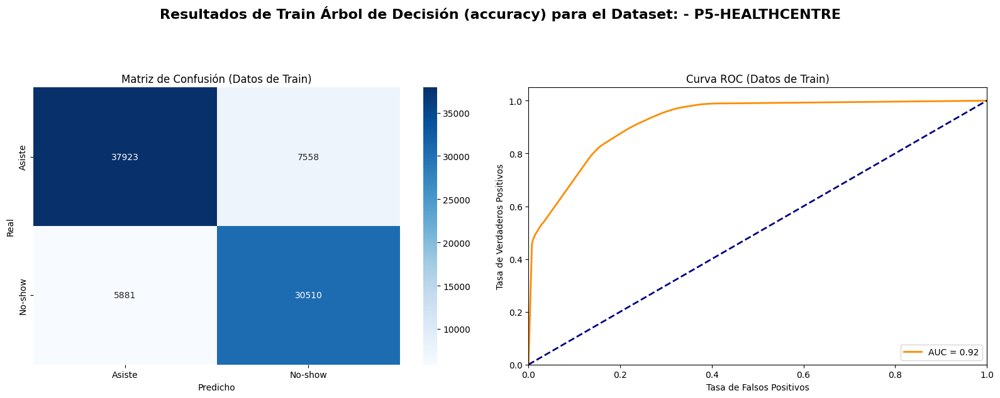

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7154670965029084
Precision (Datos de Test): 0.33447390932420873
Recall (Datos de Test): 0.40462228354605034
F1 Score (Datos de Test): 0.366219169528567
[[9036 2334]
 [1726 1173]]
AUC (Datos de Test): 0.6429334046890279


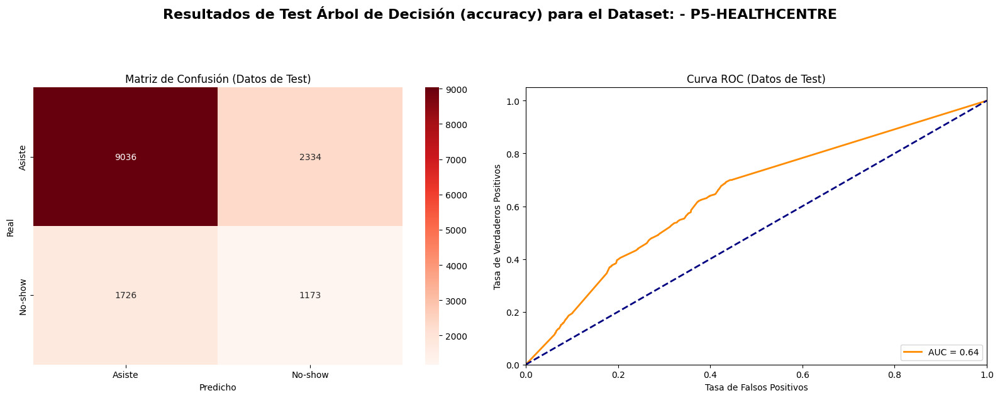

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 100, 'solver': 'newton-cg'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6466068985733828
Precision (Datos de Train): 0.6444564964747811
Recall (Datos de Train): 0.4571459976367783
F1 Score (Datos de Train): 0.5348766176352383
[[36303  9178]
 [19755 16636]]
AUC (Datos de train): 0.7031749046882281


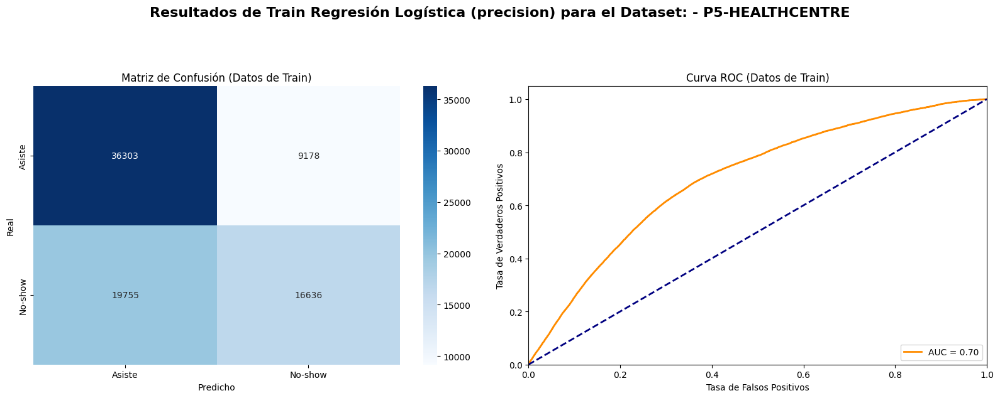

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6919195458686663
Precision (Datos de Test): 0.33115271824949244
Recall (Datos de Test): 0.5063815108658158
F1 Score (Datos de Test): 0.4004364429896345
[[8405 2965]
 [1431 1468]]
AUC (Datos de Test): 0.6654745381220529


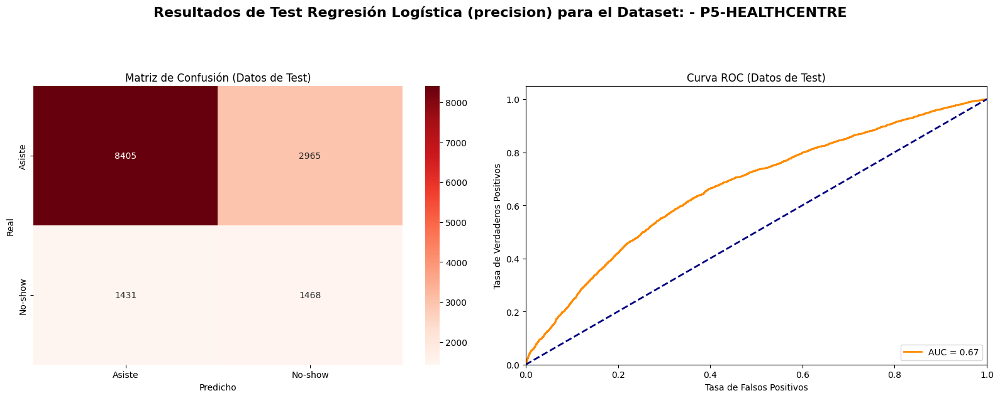

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8488860660543287
Precision (Datos de Train): 0.8135394094457353
Recall (Datos de Train): 0.8562831469319337
F1 Score (Datos de Train): 0.8343642059603181
[[38339  7142]
 [ 5230 31161]]
AUC (Datos de train): 0.9324666215101755


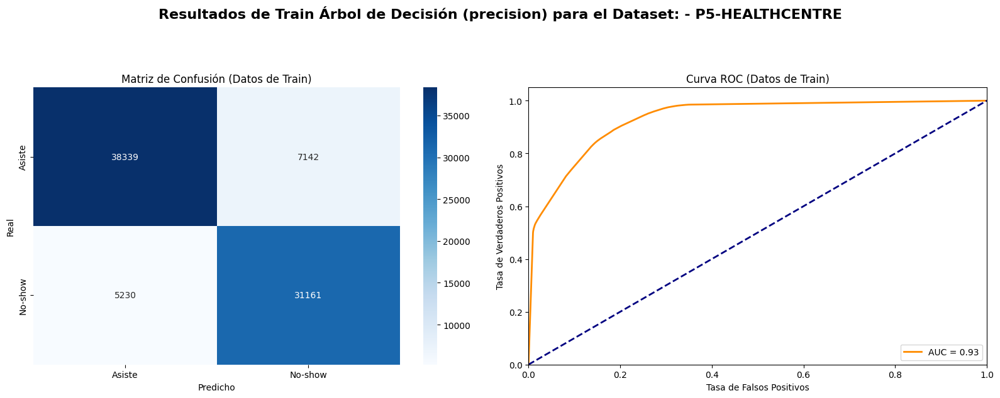

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7079683229378373
Precision (Datos de Test): 0.3212069937958263
Recall (Datos de Test): 0.39289410141428077
F1 Score (Datos de Test): 0.3534522885958107
[[8963 2407]
 [1760 1139]]
AUC (Datos de Test): 0.628191475967663


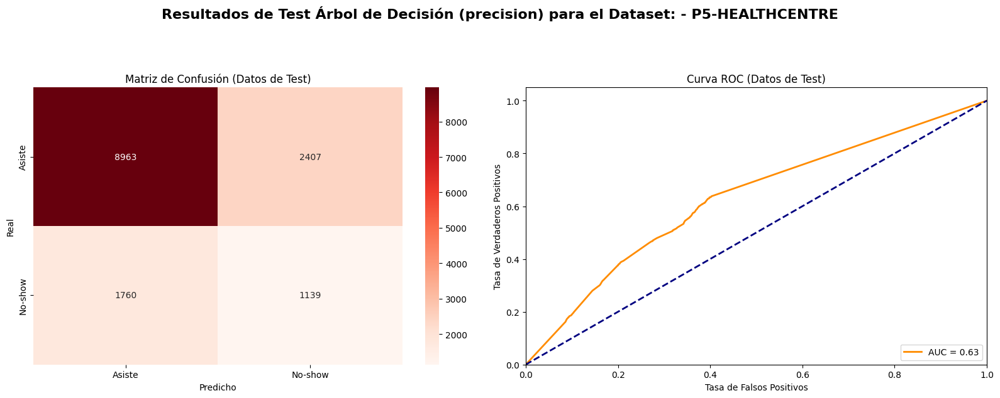

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 100, 'solver': 'newton-cg'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6466068985733828
Precision (Datos de Train): 0.6444564964747811
Recall (Datos de Train): 0.4571459976367783
F1 Score (Datos de Train): 0.5348766176352383
[[36303  9178]
 [19755 16636]]
AUC (Datos de train): 0.7031749046882281


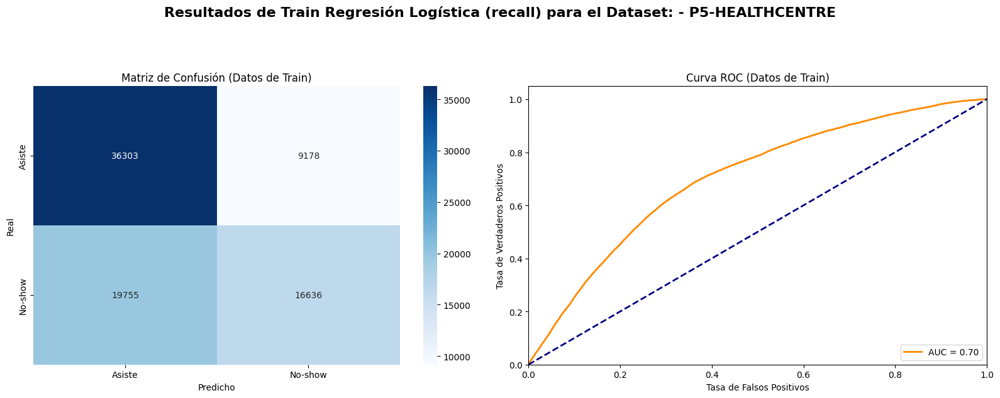

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6919195458686663
Precision (Datos de Test): 0.33115271824949244
Recall (Datos de Test): 0.5063815108658158
F1 Score (Datos de Test): 0.4004364429896345
[[8405 2965]
 [1431 1468]]
AUC (Datos de Test): 0.6654745381220529


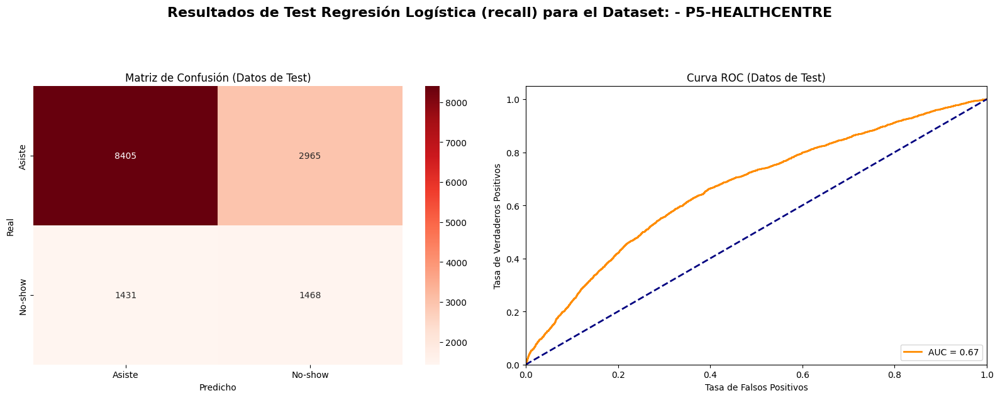

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 3, 'min_samples_split': 5}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8426446159859292
Precision (Datos de Train): 0.804145319049837
Recall (Datos de Train): 0.8539748838998653
F1 Score (Datos de Train): 0.8283113663925796
[[37912  7569]
 [ 5314 31077]]
AUC (Datos de train): 0.9280023672975647


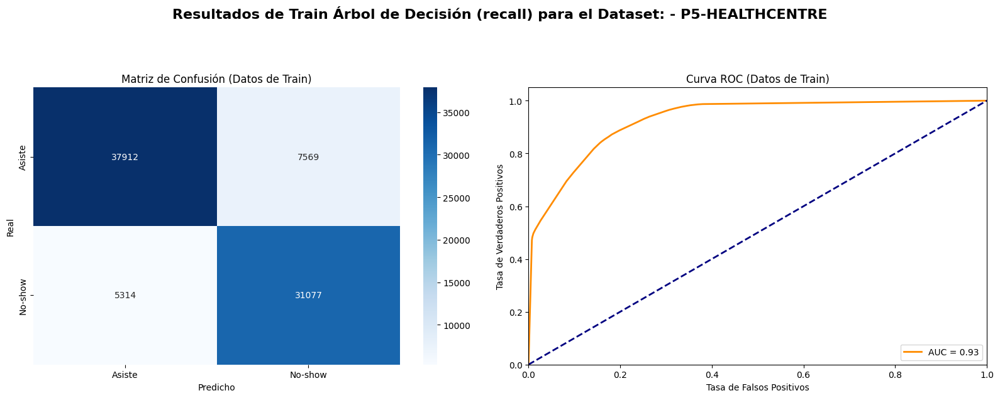

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7015207793117948
Precision (Datos de Test): 0.3153177620858229
Recall (Datos de Test): 0.4004829251466023
F1 Score (Datos de Test): 0.3528339158182647
[[8849 2521]
 [1738 1161]]
AUC (Datos de Test): 0.6311239310677295


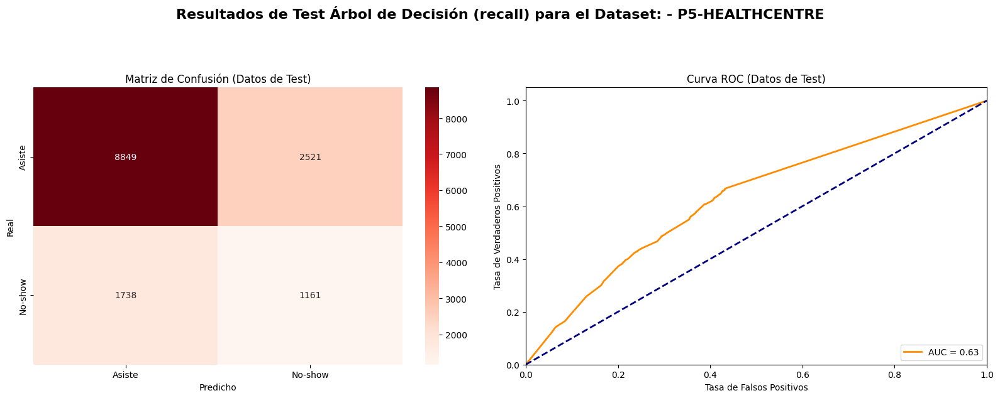

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7233364275942935
Precision (Datos de Train): 0.6587925295857988
Recall (Datos de Train): 0.7832156302382457
F1 Score (Datos de Train): 0.7156361810306948
[[30719 14762]
 [ 7889 28502]]
AUC (Datos de Train): 0.8043306526633897


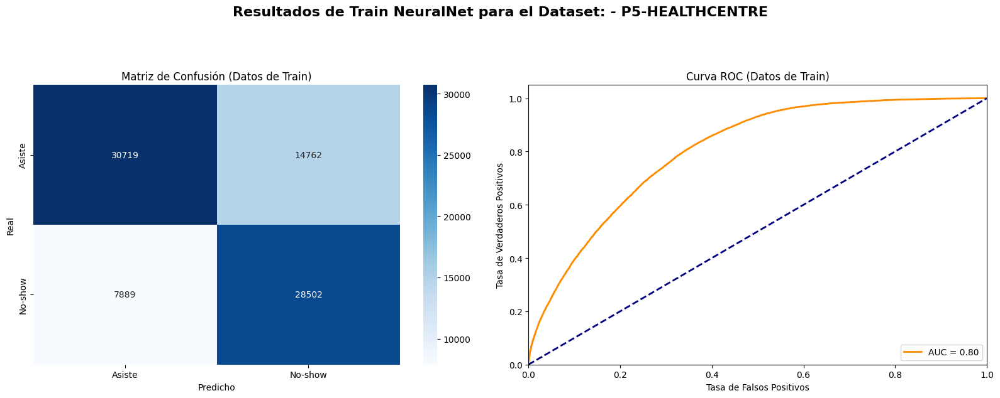

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6118158245146822
Precision (Datos de Test): 0.3050221565731167
Recall (Datos de Test): 0.712314591238358
F1 Score (Datos de Test): 0.4271382769676285
[[6665 4705]
 [ 834 2065]]
AUC (Datos de Test): 0.6996602868244076


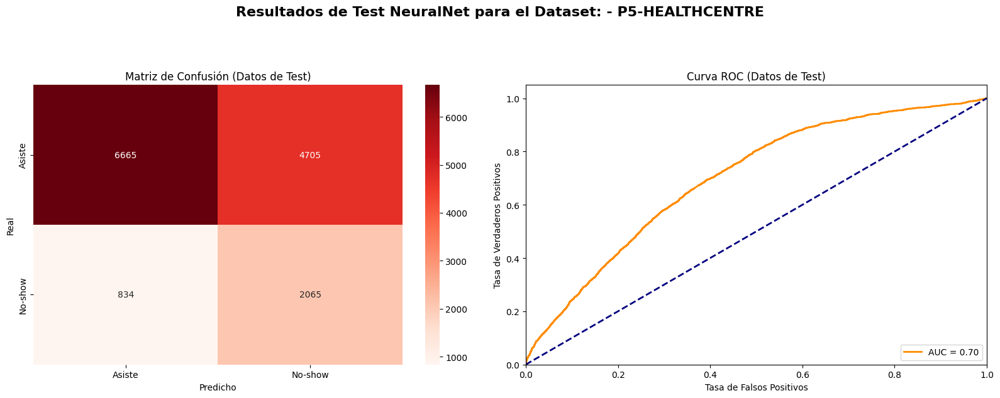

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7154338479577877
Precision (Datos de Train): 0.6544459386132541
Recall (Datos de Train): 0.7622763870187684
F1 Score (Datos de Train): 0.7042575338292416
[[30834 14647]
 [ 8651 27740]]
AUC (Datos de Train): 0.7988537330887064


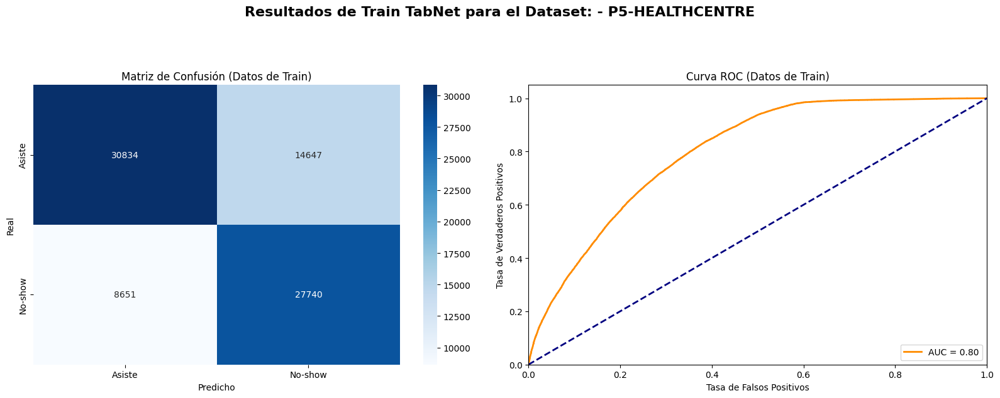

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6841404443198542
Precision (Datos de Test): 0.3414826498422713
Recall (Datos de Test): 0.5974473956536737
F1 Score (Datos de Test): 0.4345753355915193
[[8030 3340]
 [1167 1732]]
AUC (Datos de Test): 0.7316212669094339


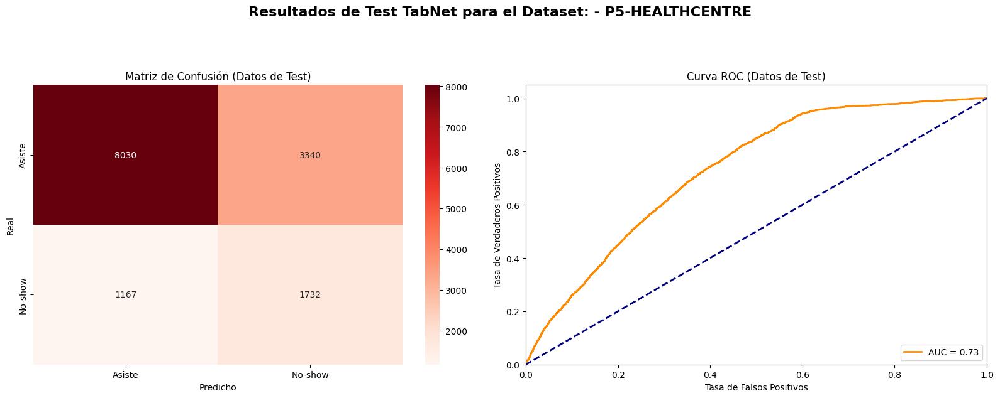


Ejecutando modelo para el dataset: P6A-KIDS

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'liblinear'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6640433860707878
Precision (Datos de Train): 0.6686824049308059
Recall (Datos de Train): 0.5161579892280072
F1 Score (Datos de Train): 0.5826029687420842
[[10535  2849]
 [ 5390  5750]]
AUC (Datos de train): 0.7441174032393244


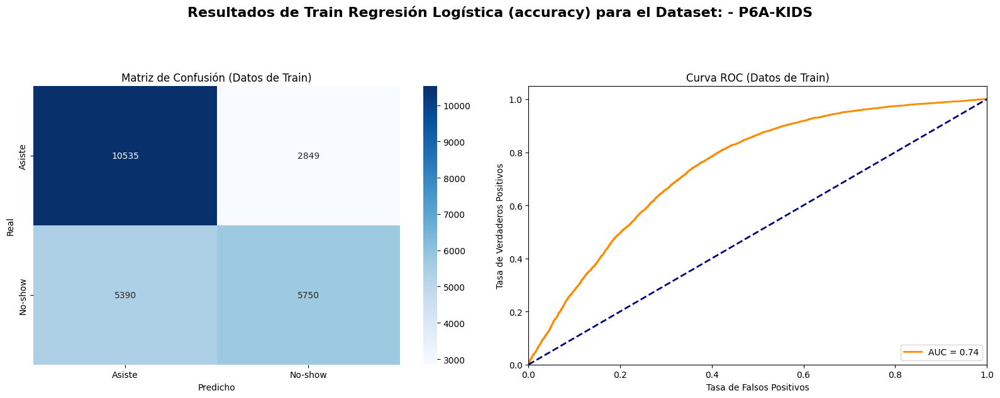

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6895650106964583
Precision (Datos de Test): 0.34559333795975017
Recall (Datos de Test): 0.578397212543554
F1 Score (Datos de Test): 0.4326672458731538
[[2403  943]
 [ 363  498]]
AUC (Datos de Test): 0.7173642597155201


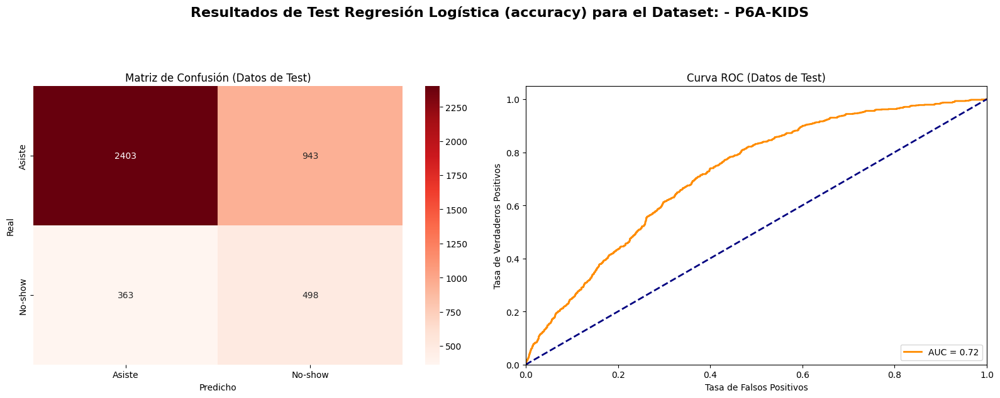

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8956124612624368
Precision (Datos de Train): 0.8957564575645757
Recall (Datos de Train): 0.8716337522441652
F1 Score (Datos de Train): 0.8835304822565969
[[12254  1130]
 [ 1430  9710]]
AUC (Datos de train): 0.960698940077973


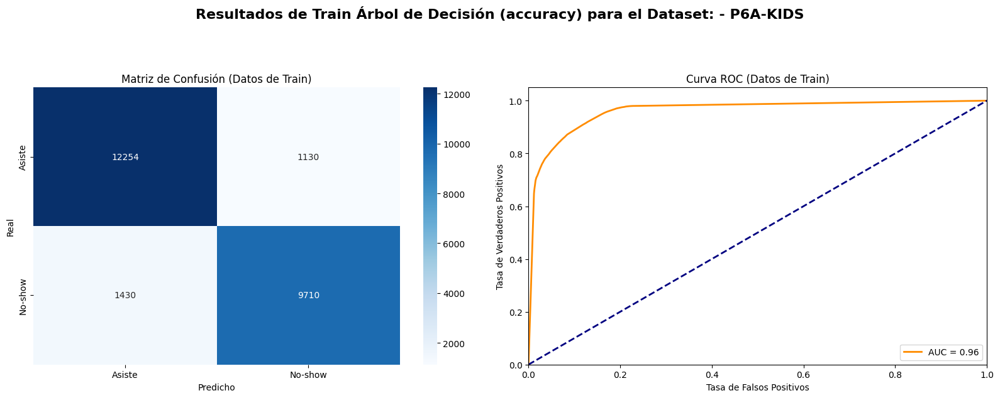

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7176135013073449
Precision (Datos de Test): 0.3046594982078853
Recall (Datos de Test): 0.2961672473867596
F1 Score (Datos de Test): 0.3003533568904594
[[2764  582]
 [ 606  255]]
AUC (Datos de Test): 0.5853304481298591


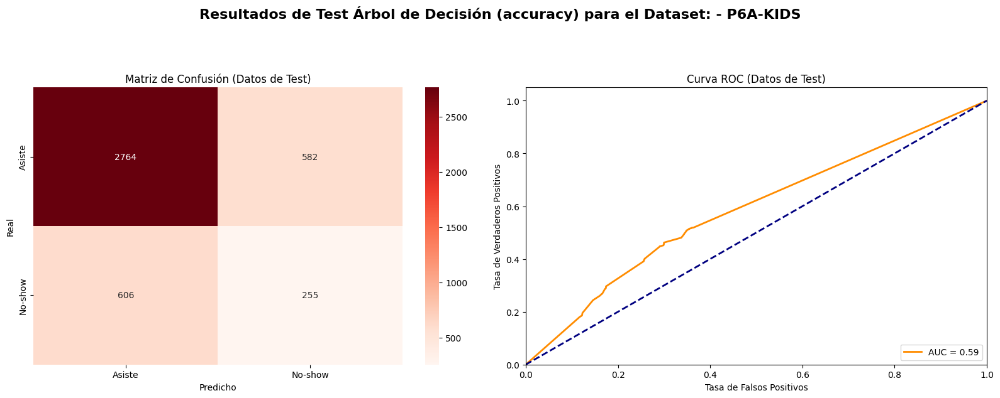

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6636356222475942
Precision (Datos de Train): 0.6694011484823625
Recall (Datos de Train): 0.5127468581687612
F1 Score (Datos de Train): 0.5806943526660906
[[10563  2821]
 [ 5428  5712]]
AUC (Datos de train): 0.7441004613348987


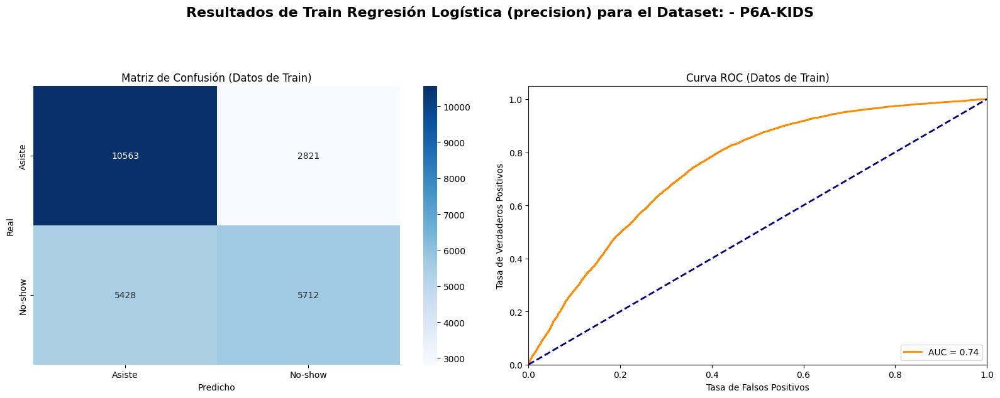

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6905158069883528
Precision (Datos de Test): 0.34548002803083394
Recall (Datos de Test): 0.5725900116144018
F1 Score (Datos de Test): 0.43094405594405594
[[2412  934]
 [ 368  493]]
AUC (Datos de Test): 0.7173062918401364


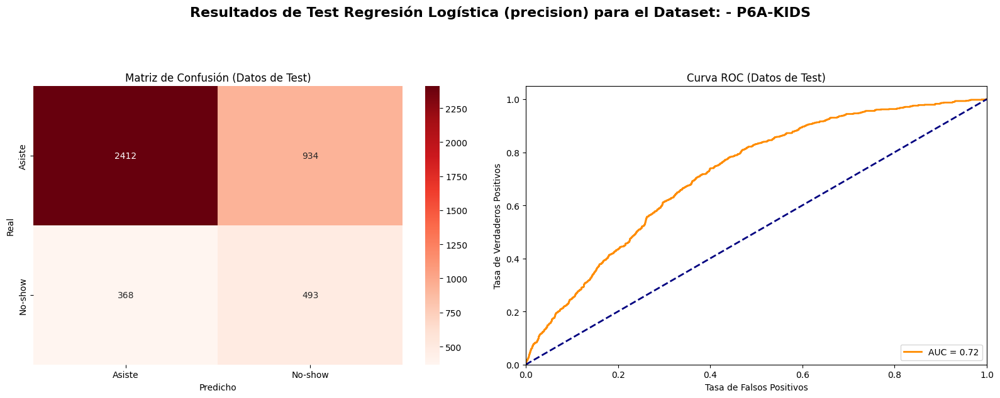

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8935736421464687
Precision (Datos de Train): 0.8933050534857986
Recall (Datos de Train): 0.8695691202872532
F1 Score (Datos de Train): 0.8812772925764192
[[12227  1157]
 [ 1453  9687]]
AUC (Datos de train): 0.9602555196000262


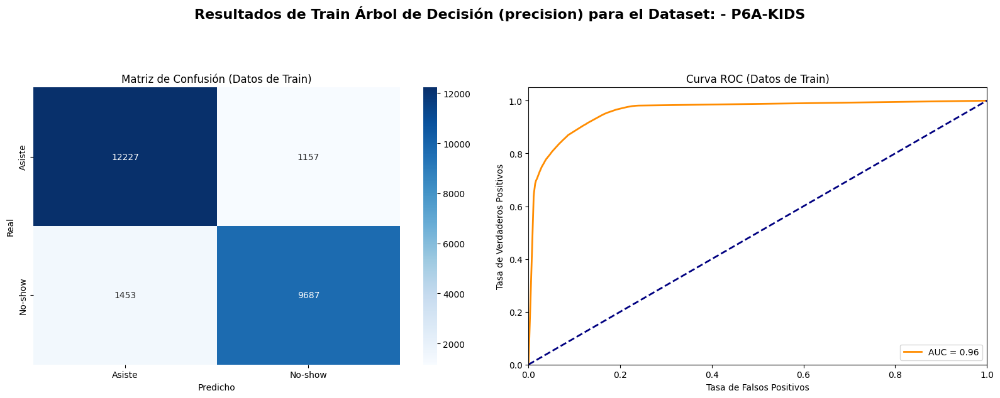

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7178512003803185
Precision (Datos de Test): 0.29926108374384236
Recall (Datos de Test): 0.28222996515679444
F1 Score (Datos de Test): 0.2904961147638972
[[2777  569]
 [ 618  243]]
AUC (Datos de Test): 0.5811704720667735


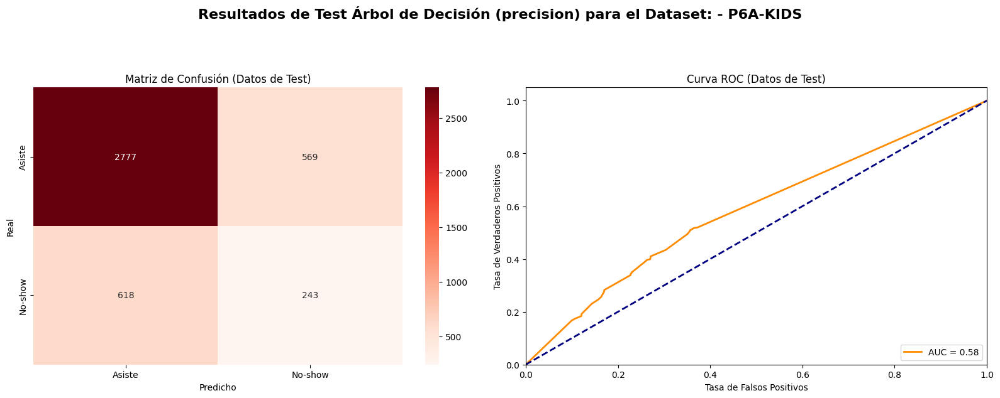

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'liblinear'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6640433860707878
Precision (Datos de Train): 0.6686824049308059
Recall (Datos de Train): 0.5161579892280072
F1 Score (Datos de Train): 0.5826029687420842
[[10535  2849]
 [ 5390  5750]]
AUC (Datos de train): 0.7441174032393244


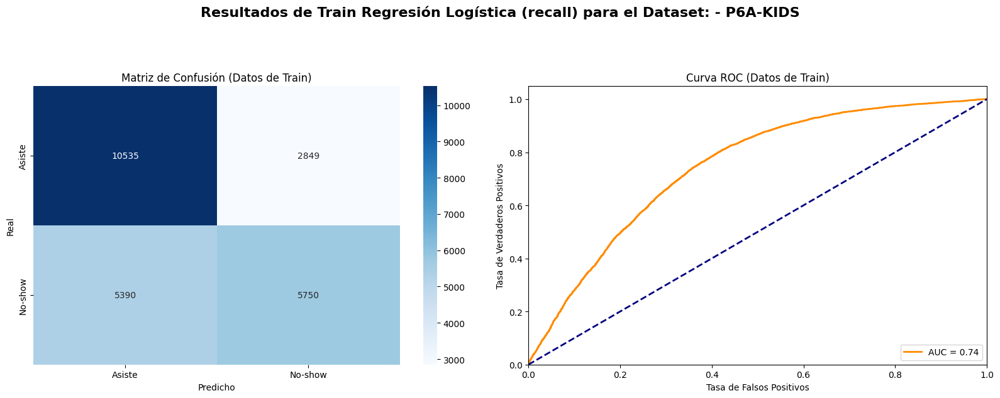

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6895650106964583
Precision (Datos de Test): 0.34559333795975017
Recall (Datos de Test): 0.578397212543554
F1 Score (Datos de Test): 0.4326672458731538
[[2403  943]
 [ 363  498]]
AUC (Datos de Test): 0.7173642597155201


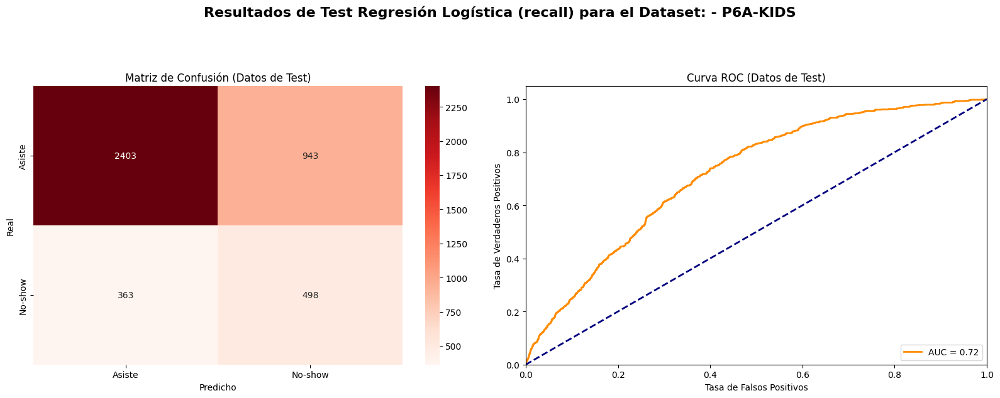

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7765454248899037
Precision (Datos de Train): 0.7041552445534555
Recall (Datos de Train): 0.8762118491921005
F1 Score (Datos de Train): 0.7808175345972322
[[9283 4101]
 [1379 9761]]
AUC (Datos de train): 0.8657289217490591


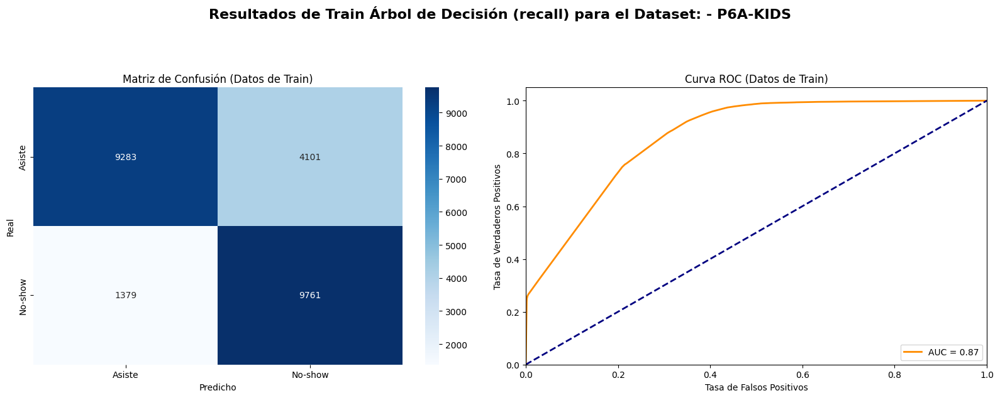

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6779177561207511
Precision (Datos de Test): 0.31116207951070335
Recall (Datos de Test): 0.4727061556329849
F1 Score (Datos de Test): 0.3752881512217612
[[2445  901]
 [ 454  407]]
AUC (Datos de Test): 0.6669216211844468


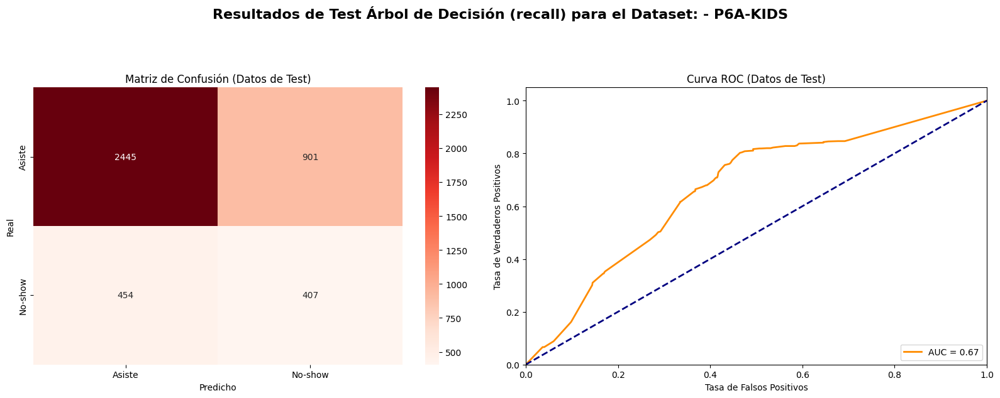

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7257380525199805
Precision (Datos de Train): 0.6624944779855692
Recall (Datos de Train): 0.8077199281867146
F1 Score (Datos de Train): 0.7279346331202977
[[8800 4584]
 [2142 8998]]
AUC (Datos de Train): 0.8021541604649192


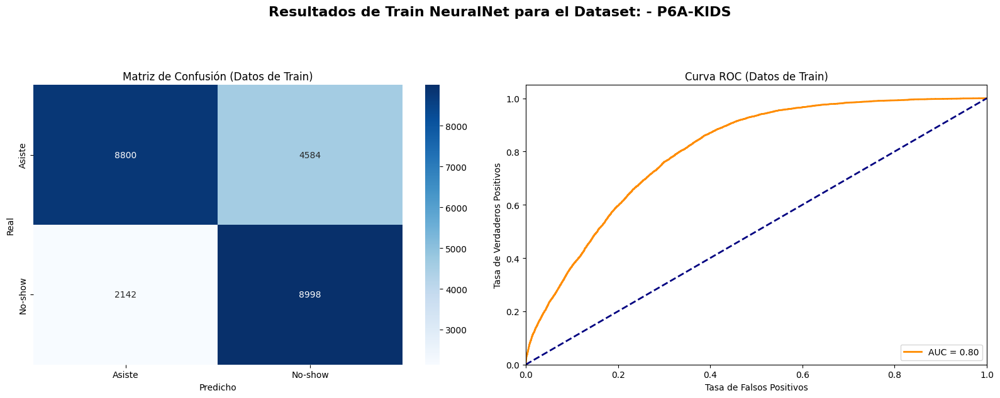

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.610648918469218
Precision (Datos de Test): 0.308903098868667
Recall (Datos de Test): 0.7293844367015099
F1 Score (Datos de Test): 0.4340013821700069
[[1941 1405]
 [ 233  628]]
AUC (Datos de Test): 0.6854435722651138


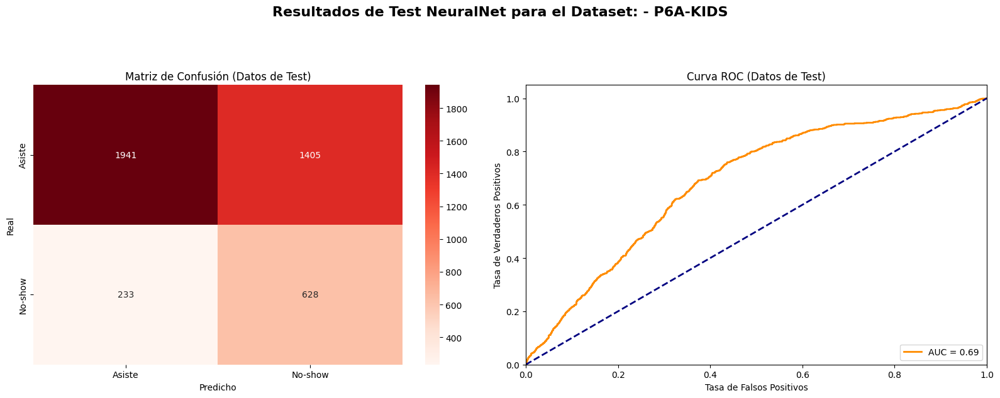

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.718683738378731
Precision (Datos de Train): 0.6492574083198424
Recall (Datos de Train): 0.8280071813285458
F1 Score (Datos de Train): 0.7278178877184677
[[8401 4983]
 [1916 9224]]
AUC (Datos de Train): 0.7950473098992231


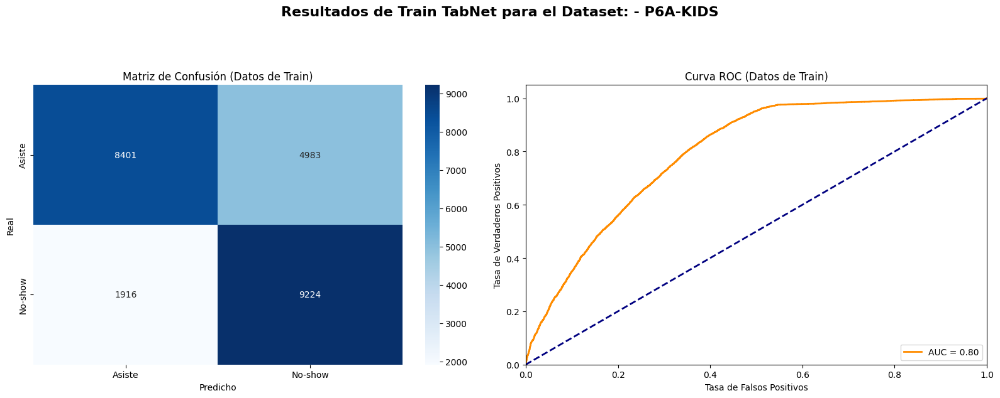

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6969336819586404
Precision (Datos de Test): 0.35086455331412103
Recall (Datos de Test): 0.5656213704994193
F1 Score (Datos de Test): 0.4330813694975545
[[2445  901]
 [ 374  487]]
AUC (Datos de Test): 0.7416831718910648


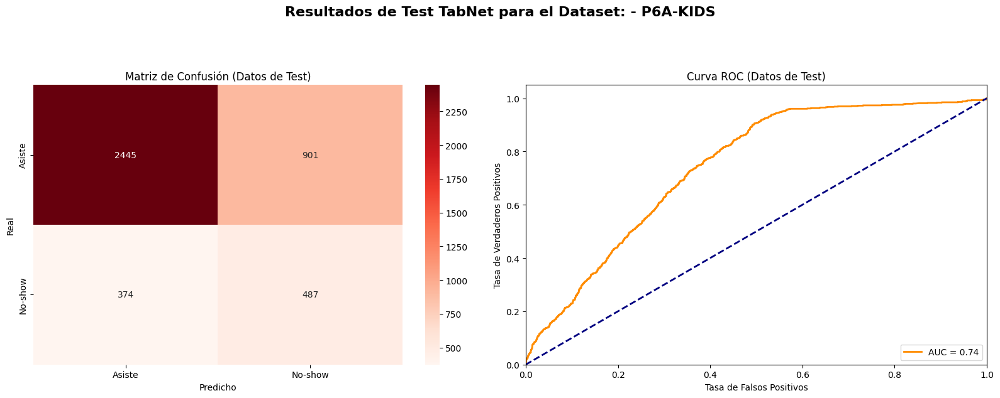


Ejecutando modelo para el dataset: P6B-ADOLESCENTS

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6592111228653469
Precision (Datos de Train): 0.6480369515011547
Recall (Datos de Train): 0.4844613259668508
F1 Score (Datos de Train): 0.5544358822367121
[[2959  762]
 [1493 1403]]
AUC (Datos de train): 0.7261967224250595


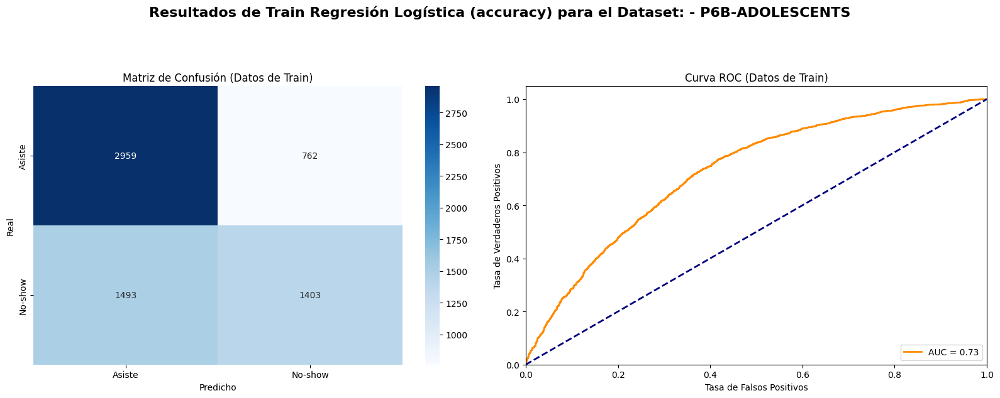

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6782334384858044
Precision (Datos de Test): 0.41950113378684806
Recall (Datos de Test): 0.5489614243323442
F1 Score (Datos de Test): 0.4755784061696658
[[675 256]
 [152 185]]
AUC (Datos de Test): 0.6801196505464594


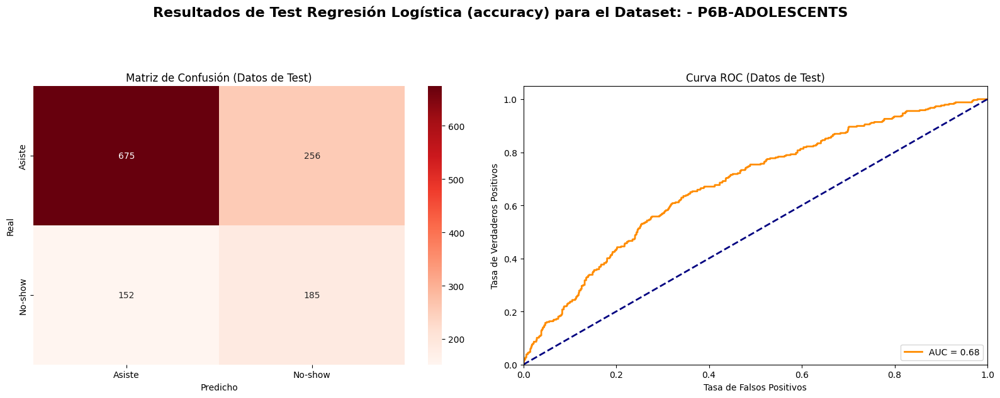

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 3, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.9147649992443706
Precision (Datos de Train): 0.9152421652421653
Recall (Datos de Train): 0.8874309392265194
F1 Score (Datos de Train): 0.9011220196353437
[[3483  238]
 [ 326 2570]]
AUC (Datos de train): 0.9586000985893116


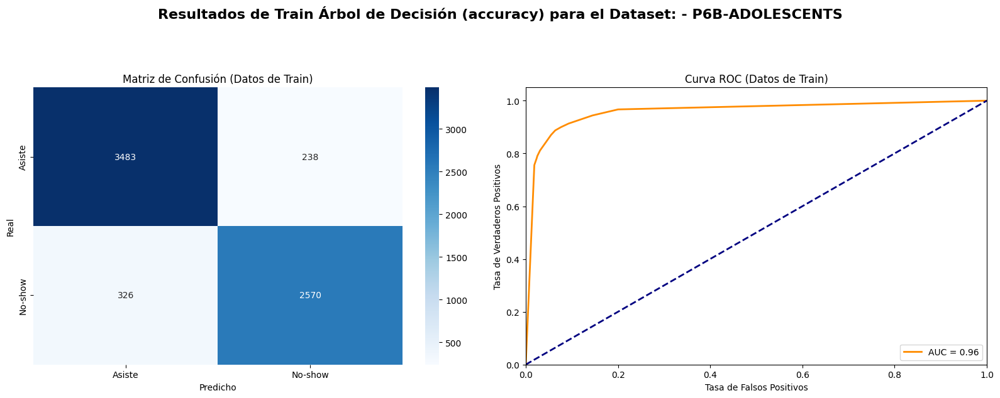

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6900630914826499
Precision (Datos de Test): 0.3978102189781022
Recall (Datos de Test): 0.32344213649851633
F1 Score (Datos de Test): 0.3567921440261866
[[766 165]
 [228 109]]
AUC (Datos de Test): 0.5947212244260502


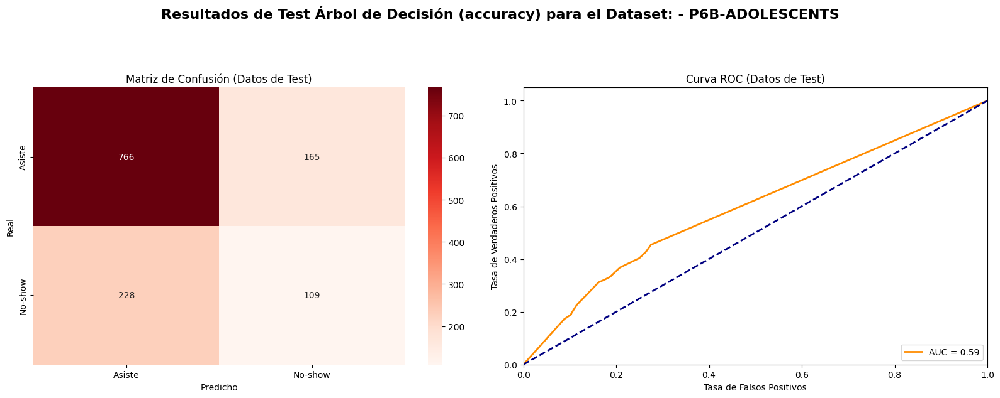

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'newton-cg'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6598156264168052
Precision (Datos de Train): 0.6503496503496503
Recall (Datos de Train): 0.4816988950276243
F1 Score (Datos de Train): 0.5534616147589764
[[2971  750]
 [1501 1395]]
AUC (Datos de train): 0.7301729600253006


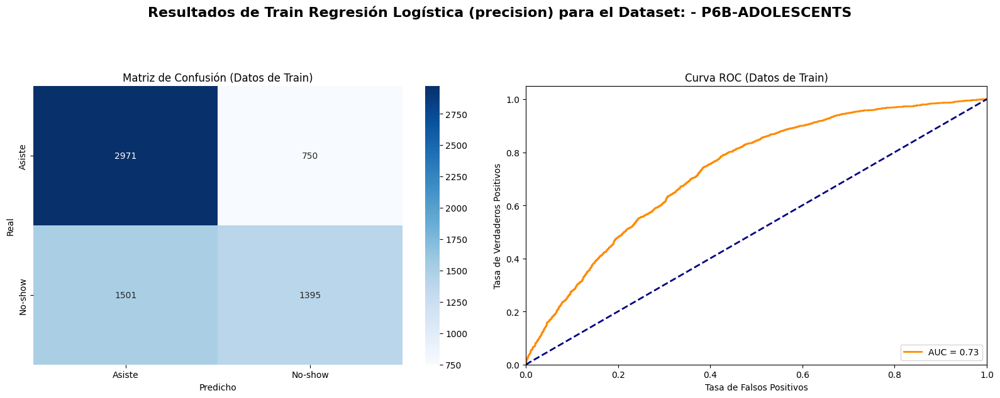

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6750788643533123
Precision (Datos de Test): 0.41379310344827586
Recall (Datos de Test): 0.5341246290801187
F1 Score (Datos de Test): 0.46632124352331605
[[676 255]
 [157 180]]
AUC (Datos de Test): 0.6886647521729291


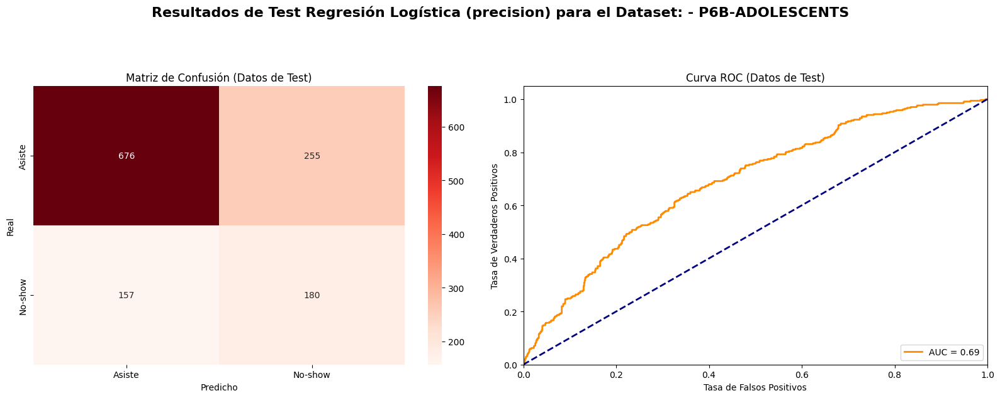

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.9176363911137978
Precision (Datos de Train): 0.9326463010673537
Recall (Datos de Train): 0.875
F1 Score (Datos de Train): 0.9029039729200071
[[3538  183]
 [ 362 2534]]
AUC (Datos de train): 0.9630149955233921


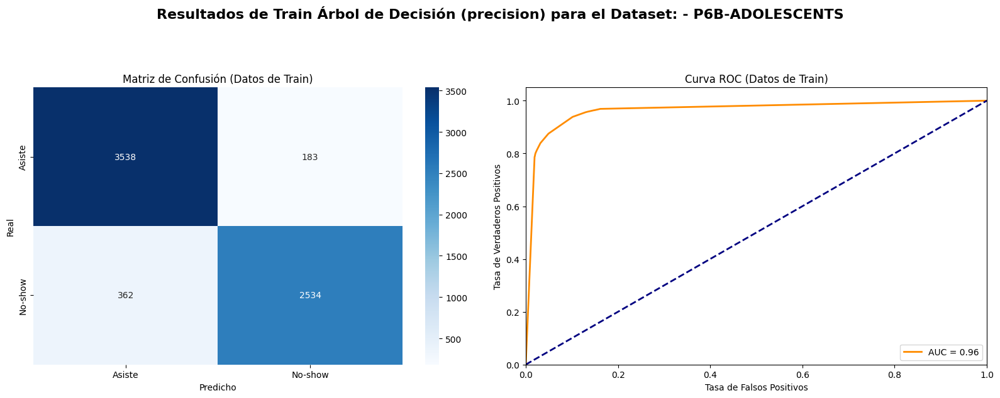

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6900630914826499
Precision (Datos de Test): 0.3691588785046729
Recall (Datos de Test): 0.2344213649851632
F1 Score (Datos de Test): 0.2867513611615245
[[796 135]
 [258  79]]
AUC (Datos de Test): 0.5612993909105106


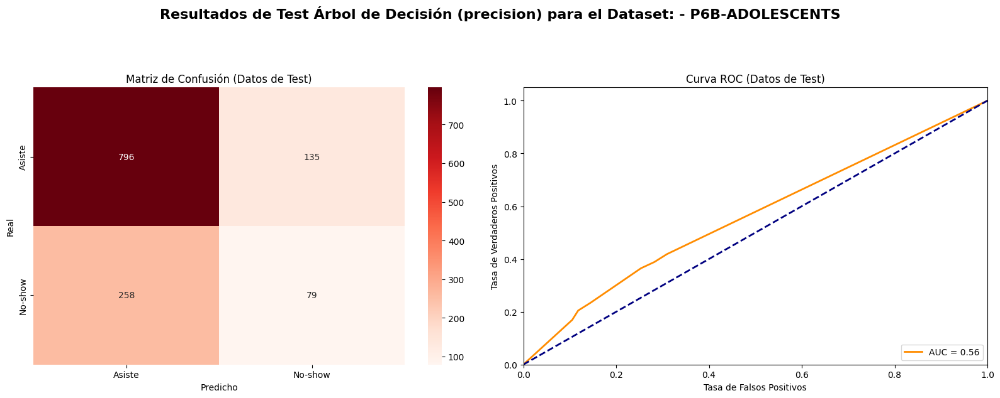

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'liblinear'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6601178781925344
Precision (Datos de Train): 0.6469786460699682
Recall (Datos de Train): 0.49171270718232046
F1 Score (Datos de Train): 0.558760054934275
[[2944  777]
 [1472 1424]]
AUC (Datos de train): 0.7302676146731779


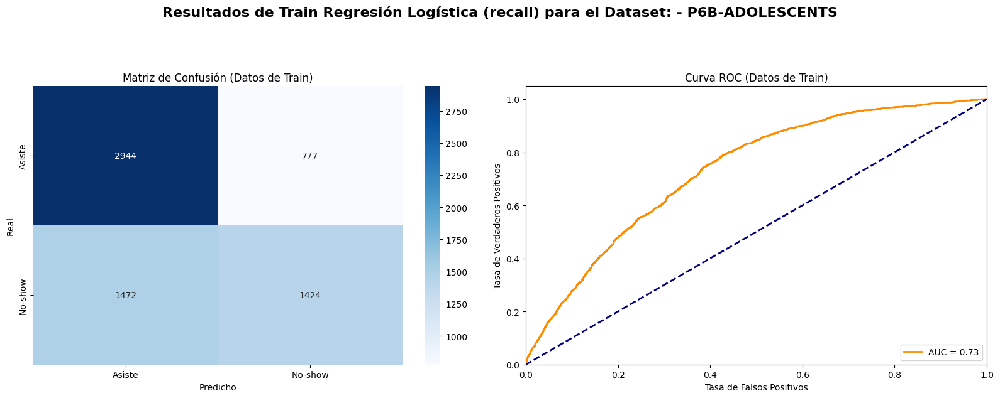

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.667981072555205
Precision (Datos de Test): 0.40625
Recall (Datos de Test): 0.5400593471810089
F1 Score (Datos de Test): 0.4636942675159236
[[665 266]
 [155 182]]
AUC (Datos de Test): 0.6887571833356175


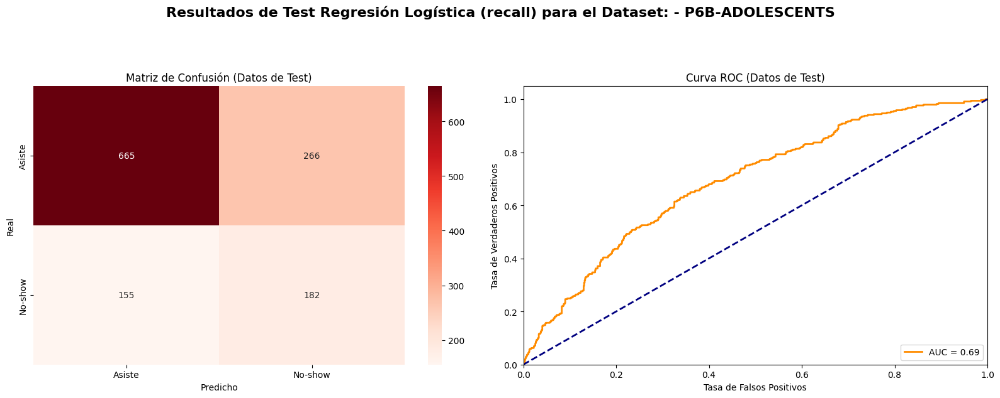

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 3, 'min_samples_split': 5}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.9143116215807768
Precision (Datos de Train): 0.913970849626733
Recall (Datos de Train): 0.8877762430939227
F1 Score (Datos de Train): 0.9006831318970048
[[3479  242]
 [ 325 2571]]
AUC (Datos de train): 0.9582635177973009


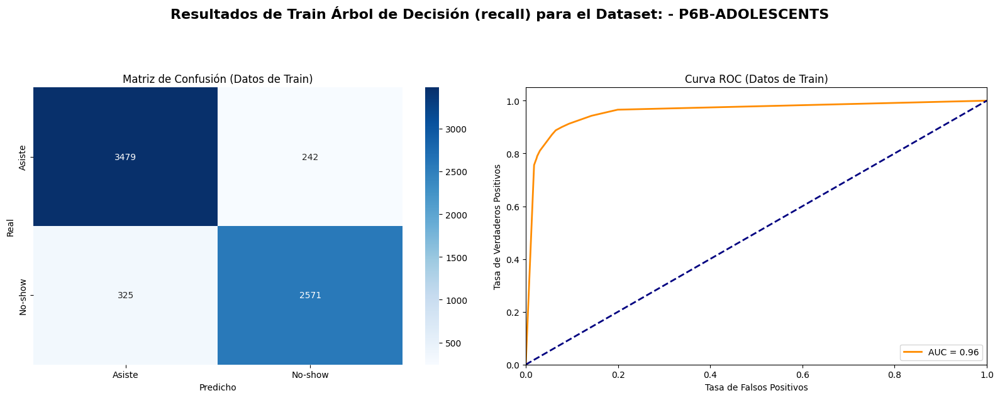

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6916403785488959
Precision (Datos de Test): 0.3953488372093023
Recall (Datos de Test): 0.3026706231454006
F1 Score (Datos de Test): 0.34285714285714286
[[775 156]
 [235 102]]
AUC (Datos de Test): 0.588974555932009


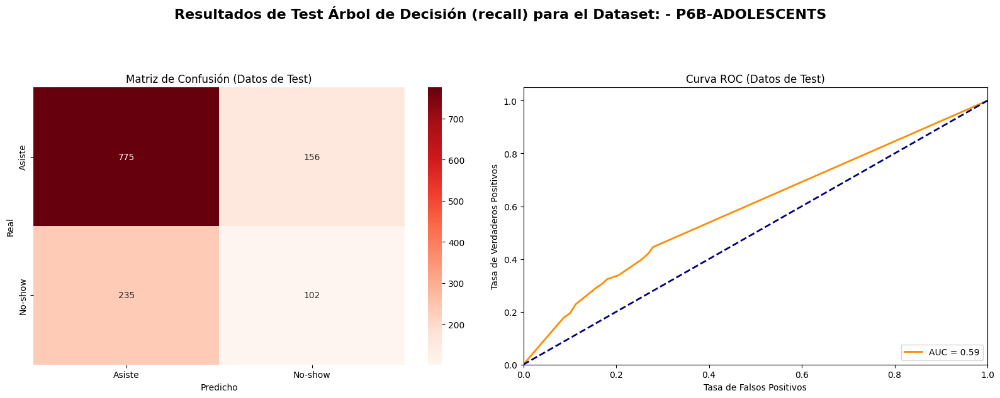

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7219283663291521
Precision (Datos de Train): 0.6725490196078432
Recall (Datos de Train): 0.710635359116022
F1 Score (Datos de Train): 0.6910678307588985
[[2719 1002]
 [ 838 2058]]
AUC (Datos de Train): 0.797705896130815


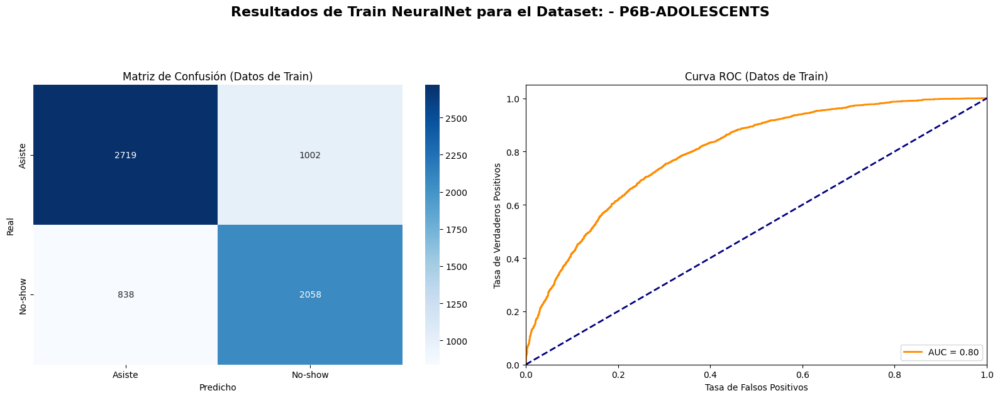

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6096214511041009
Precision (Datos de Test): 0.3537037037037037
Recall (Datos de Test): 0.5667655786350149
F1 Score (Datos de Test): 0.43557582668187
[[582 349]
 [146 191]]
AUC (Datos de Test): 0.6540492817461203


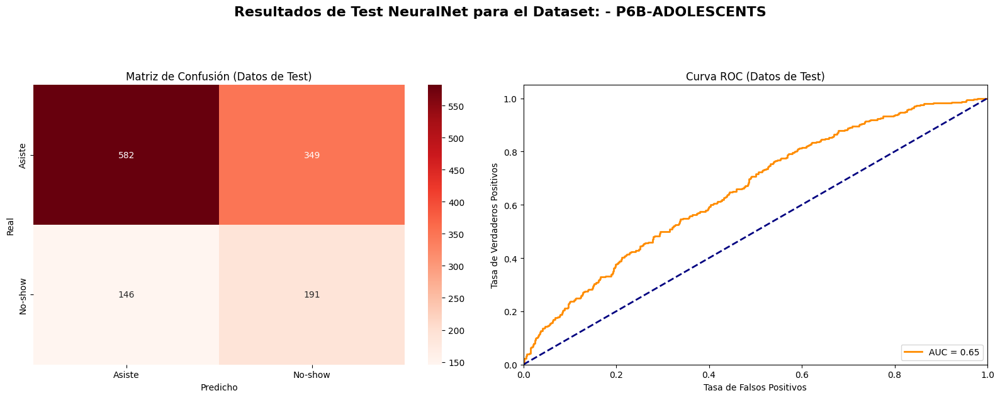

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.755629439322956
Precision (Datos de Train): 0.6763165150261925
Recall (Datos de Train): 0.8470303867403315
F1 Score (Datos de Train): 0.7521079258010118
[[2547 1174]
 [ 443 2453]]
AUC (Datos de Train): 0.8378793702607716


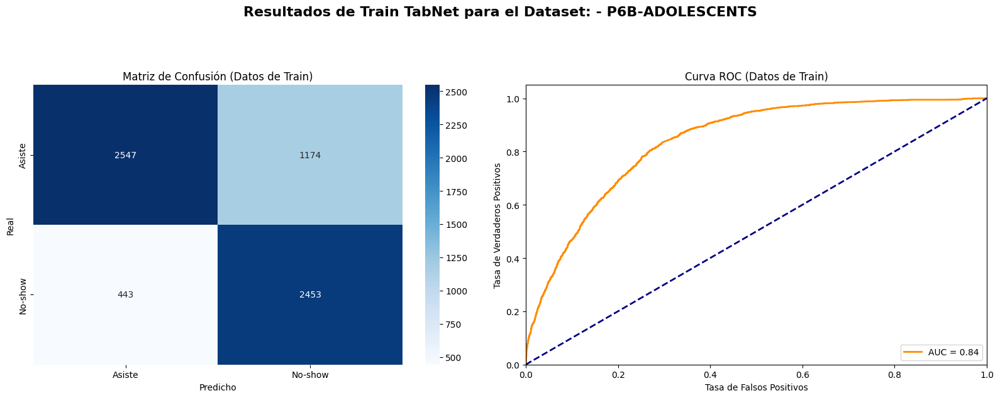

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6269716088328076
Precision (Datos de Test): 0.364
Recall (Datos de Test): 0.5400593471810089
F1 Score (Datos de Test): 0.4348864994026284
[[613 318]
 [155 182]]
AUC (Datos de Test): 0.6473894571103469


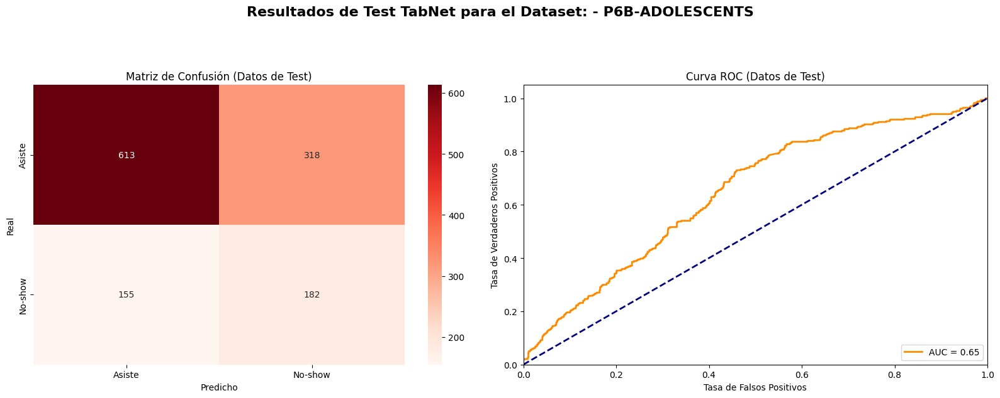


Ejecutando modelo para el dataset: P6C-YOUNGADULTS

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.1, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6411990647962592
Precision (Datos de Train): 0.6314637482900137
Recall (Datos de Train): 0.4389501711677444
F1 Score (Datos de Train): 0.5178952092449232
[[5371 1347]
 [2950 2308]]
AUC (Datos de train): 0.7209722583803457


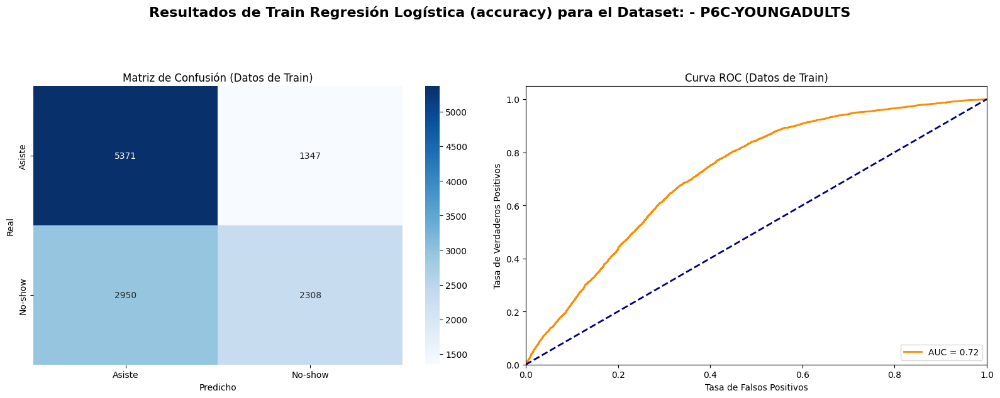

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6959429335711101
Precision (Datos de Test): 0.41389290882778584
Recall (Datos de Test): 0.5079928952042628
F1 Score (Datos de Test): 0.45614035087719296
[[1275  405]
 [ 277  286]]
AUC (Datos de Test): 0.6958898968113001


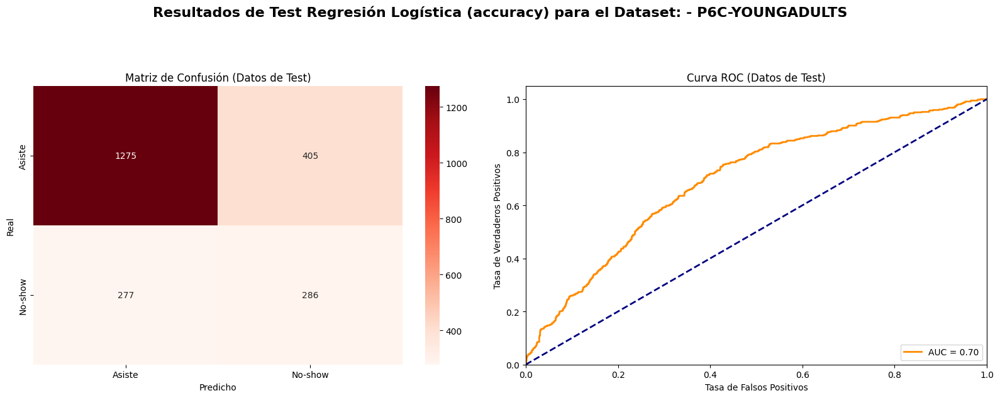

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8891950567802271
Precision (Datos de Train): 0.9060111547200992
Recall (Datos de Train): 0.8341574743248383
F1 Score (Datos de Train): 0.8686008515694623
[[6263  455]
 [ 872 4386]]
AUC (Datos de train): 0.9543199939394016


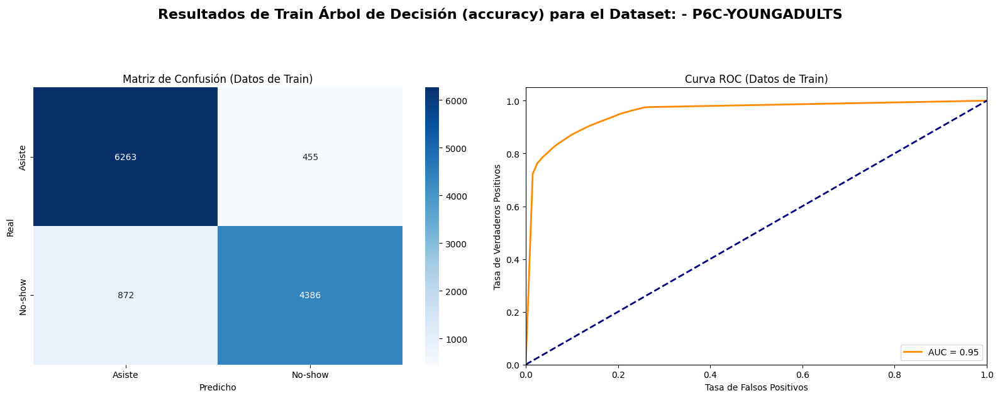

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6825679893000446
Precision (Datos de Test): 0.3295194508009153
Recall (Datos de Test): 0.2557726465364121
F1 Score (Datos de Test): 0.288
[[1387  293]
 [ 419  144]]
AUC (Datos de Test): 0.5984733147255349


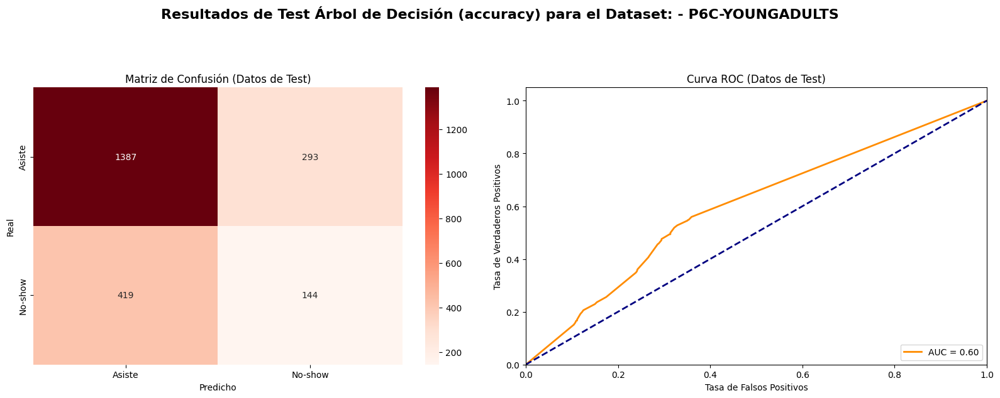

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.1, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6411990647962592
Precision (Datos de Train): 0.6314637482900137
Recall (Datos de Train): 0.4389501711677444
F1 Score (Datos de Train): 0.5178952092449232
[[5371 1347]
 [2950 2308]]
AUC (Datos de train): 0.7209722583803457


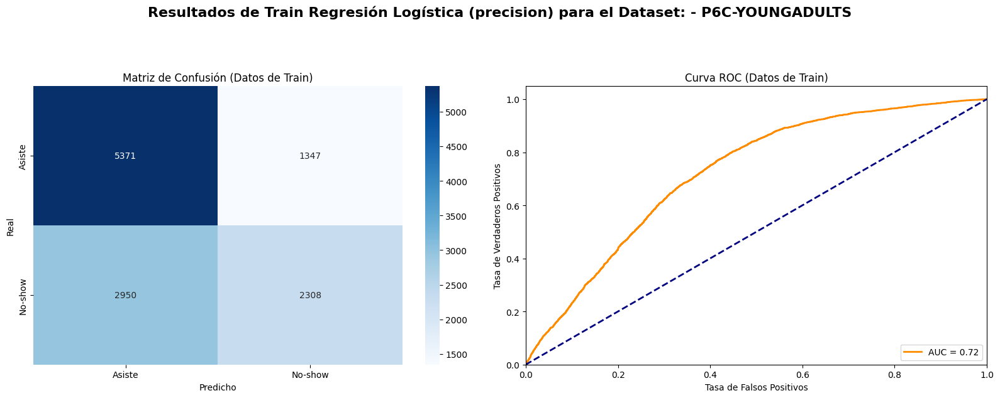

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6959429335711101
Precision (Datos de Test): 0.41389290882778584
Recall (Datos de Test): 0.5079928952042628
F1 Score (Datos de Test): 0.45614035087719296
[[1275  405]
 [ 277  286]]
AUC (Datos de Test): 0.6958898968113001


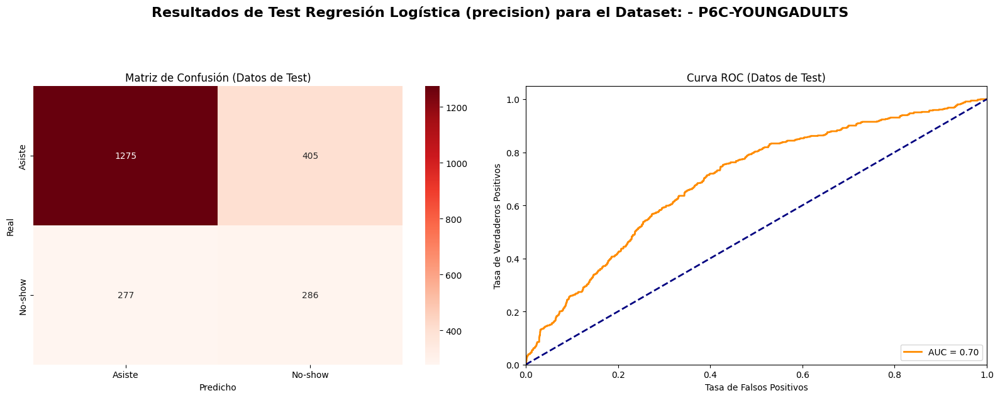

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8735804943219773
Precision (Datos de Train): 0.8858202802967848
Recall (Datos de Train): 0.8174210726511981
F1 Score (Datos de Train): 0.8502472799208705
[[6164  554]
 [ 960 4298]]
AUC (Datos de train): 0.9489564293698507


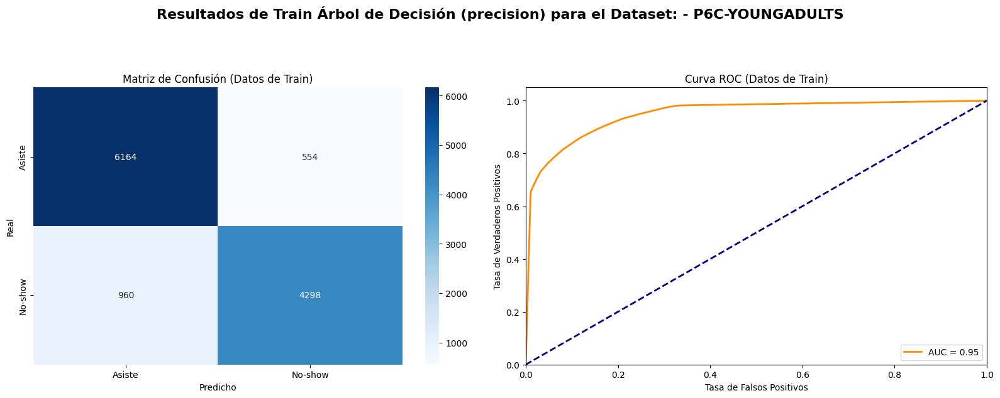

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6995095853767276
Precision (Datos de Test): 0.371824480369515
Recall (Datos de Test): 0.28596802841918295
F1 Score (Datos de Test): 0.3232931726907631
[[1408  272]
 [ 402  161]]
AUC (Datos de Test): 0.6337218768502071


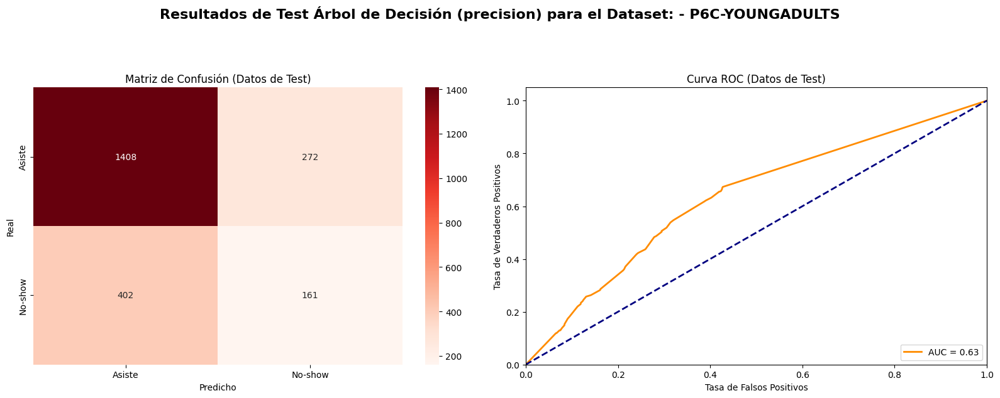

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'liblinear'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6393620574482298
Precision (Datos de Train): 0.6274775997827857
Recall (Datos de Train): 0.4395207303157094
F1 Score (Datos de Train): 0.5169444133765798
[[5346 1372]
 [2947 2311]]
AUC (Datos de train): 0.7203033503944315


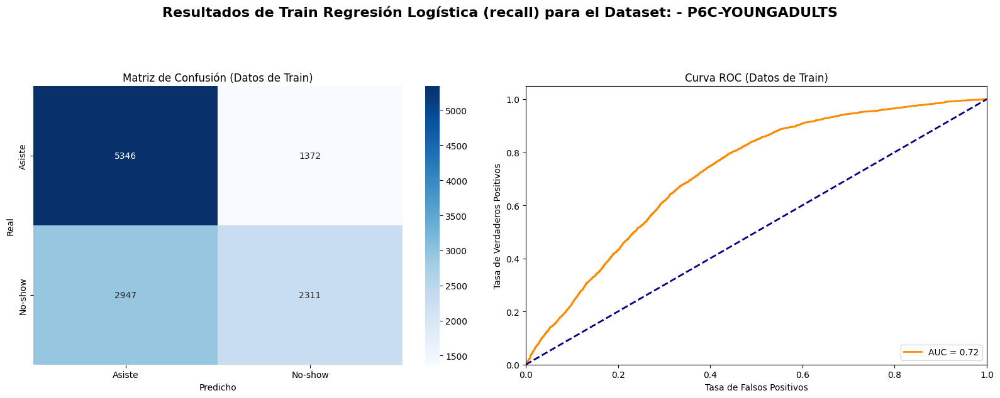

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6950512706197057
Precision (Datos de Test): 0.413447782546495
Recall (Datos de Test): 0.5133214920071048
F1 Score (Datos de Test): 0.45800316957210774
[[1270  410]
 [ 274  289]]
AUC (Datos de Test): 0.6951085807324706


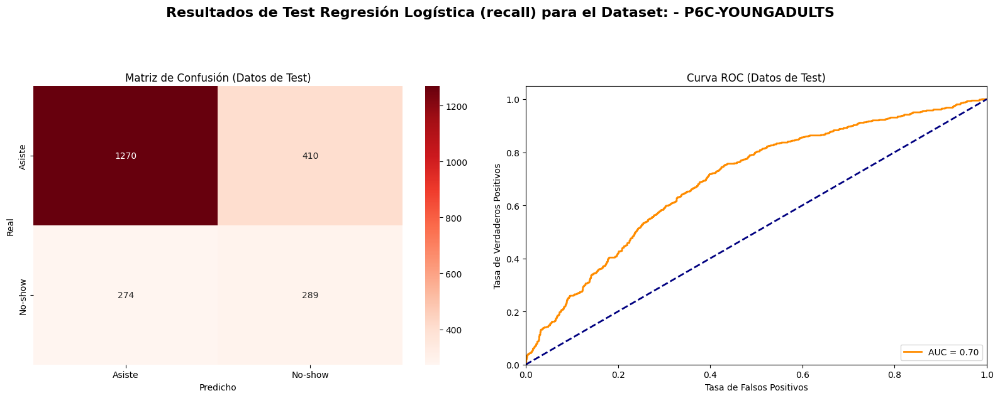

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 3, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7783066132264529
Precision (Datos de Train): 0.7195883246161633
Recall (Datos de Train): 0.8111449220235831
F1 Score (Datos de Train): 0.7626285203397407
[[5056 1662]
 [ 993 4265]]
AUC (Datos de train): 0.8713818017393874


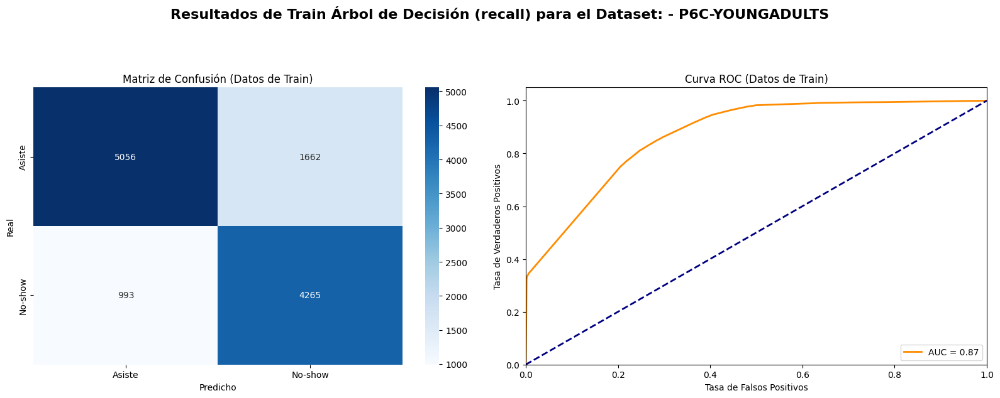

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6321890325456977
Precision (Datos de Test): 0.3345959595959596
Recall (Datos de Test): 0.4706927175843694
F1 Score (Datos de Test): 0.39114391143911437
[[1153  527]
 [ 298  265]]
AUC (Datos de Test): 0.653794510699484


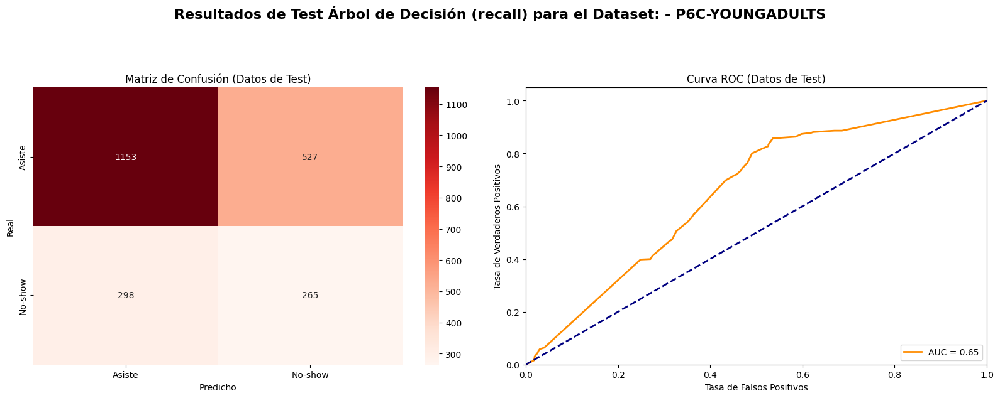

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7327989311957248
Precision (Datos de Train): 0.6590909090909091
Recall (Datos de Train): 0.8107645492582731
F1 Score (Datos de Train): 0.7271021661265563
[[4513 2205]
 [ 995 4263]]
AUC (Datos de Train): 0.8107329977960123


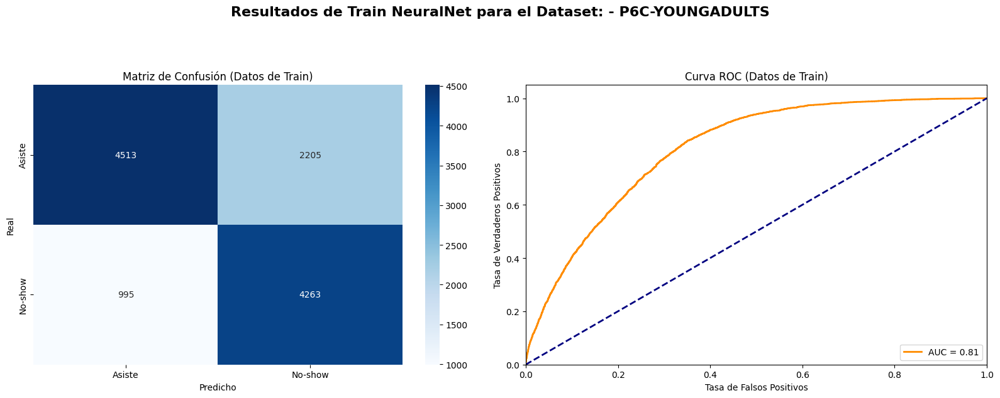

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6326348640213999
Precision (Datos de Test): 0.37746478873239436
Recall (Datos de Test): 0.7140319715808171
F1 Score (Datos de Test): 0.49385749385749383
[[1017  663]
 [ 161  402]]
AUC (Datos de Test): 0.7077550114184218


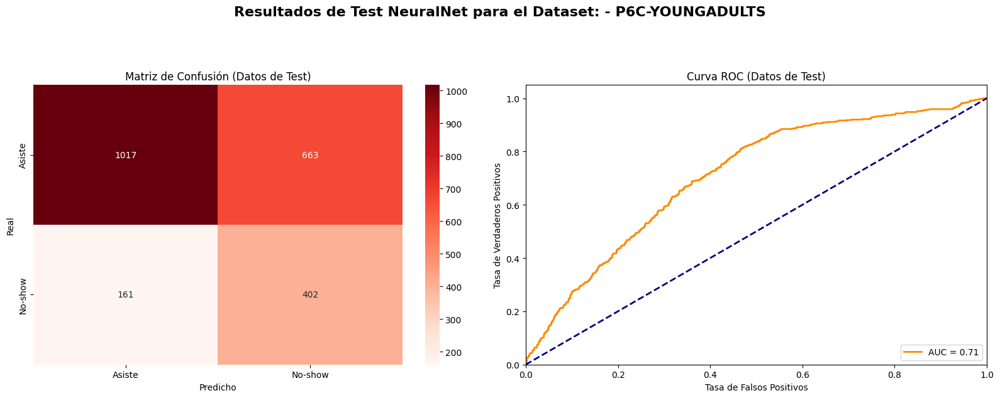

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7142618570474282
Precision (Datos de Train): 0.6366071428571428
Recall (Datos de Train): 0.8136173449980981
F1 Score (Datos de Train): 0.7143095675404909
[[4276 2442]
 [ 980 4278]]
AUC (Datos de Train): 0.7885757180172919


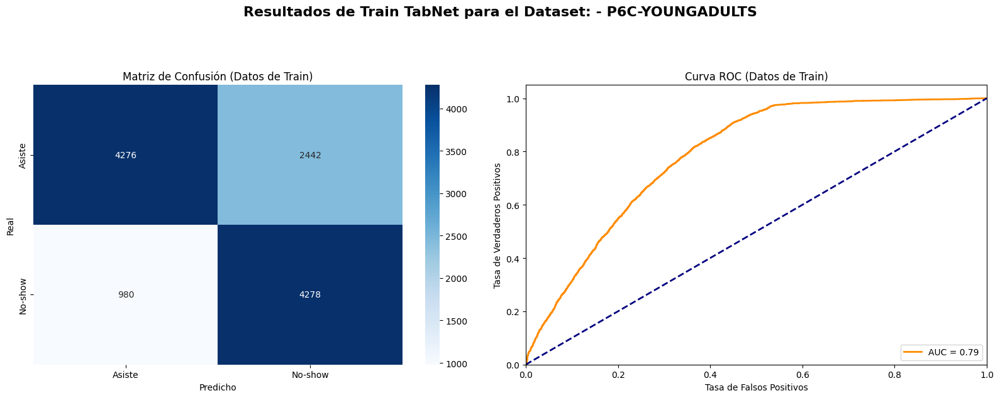

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6397681676326349
Precision (Datos de Test): 0.3788328387734916
Recall (Datos de Test): 0.6802841918294849
F1 Score (Datos de Test): 0.4866581956797967
[[1052  628]
 [ 180  383]]
AUC (Datos de Test): 0.7114036200625897


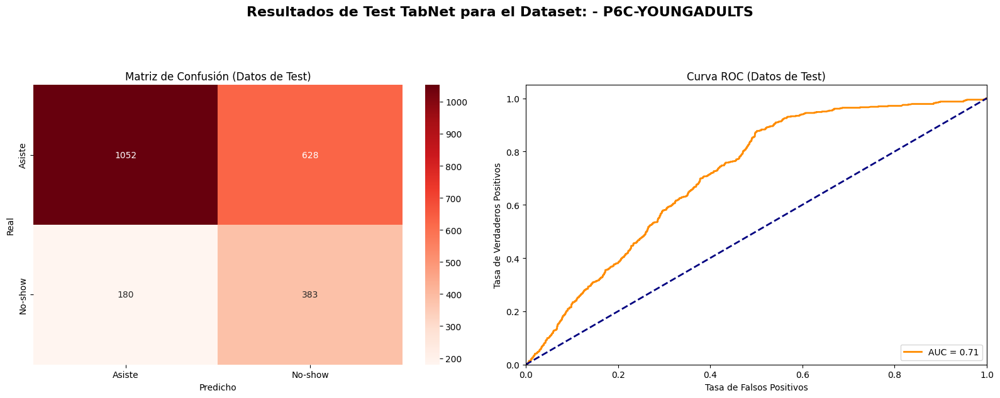


Ejecutando modelo para el dataset: P6D-ADULTS

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 1000, 'solver': 'saga'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6355562112717615
Precision (Datos de Train): 0.6395125080179602
Recall (Datos de Train): 0.45329955832683816
F1 Score (Datos de Train): 0.5305408795469231
[[29120  7868]
 [16834 13958]]
AUC (Datos de train): 0.6868671418307801


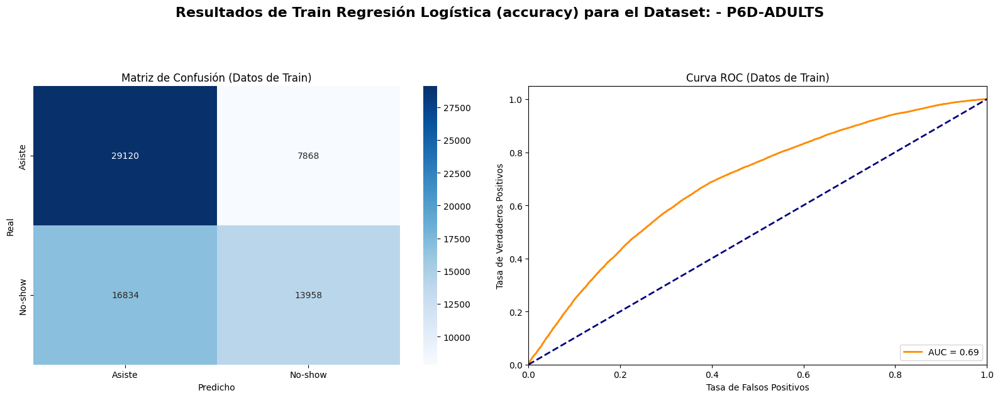

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6895382207148447
Precision (Datos de Test): 0.31065173700832616
Recall (Datos de Test): 0.4806752554420258
F1 Score (Datos de Test): 0.377397976979421
[[6847 2401]
 [1169 1082]]
AUC (Datos de Test): 0.6562473099230023


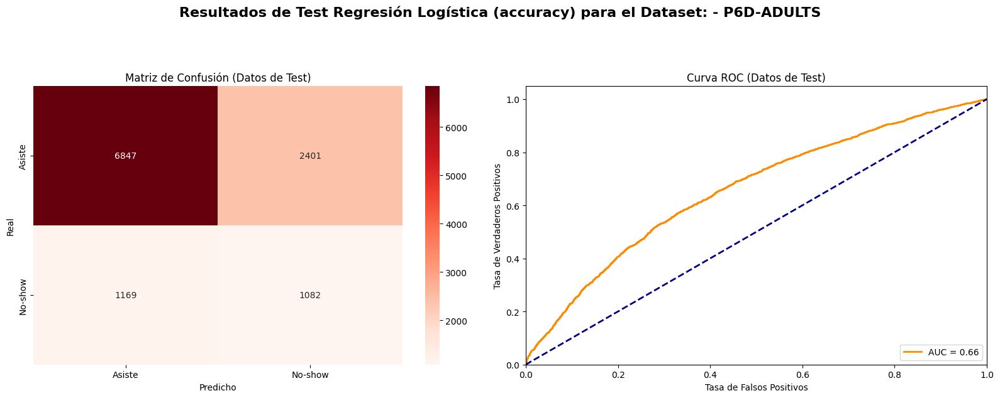

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8560637356152258
Precision (Datos de Train): 0.8442655145326001
Recall (Datos de Train): 0.8376851130163678
F1 Score (Datos de Train): 0.840962441314554
[[32230  4758]
 [ 4998 25794]]
AUC (Datos de train): 0.9427878405396899


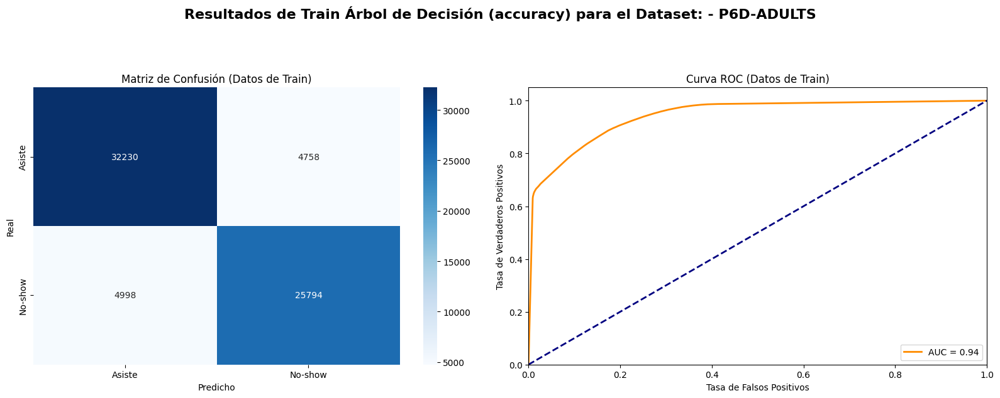

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7139751282720237
Precision (Datos de Test): 0.2776349614395887
Recall (Datos de Test): 0.28787205686361617
F1 Score (Datos de Test): 0.2826608505997819
[[7562 1686]
 [1603  648]]
AUC (Datos de Test): 0.6123279839871245


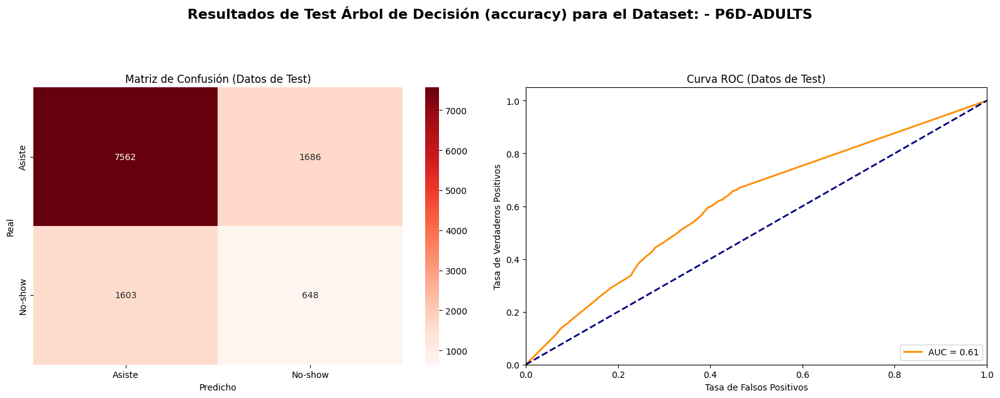

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 10, 'max_iter': 100, 'solver': 'newton-cg'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6355562112717615
Precision (Datos de Train): 0.6394997251236944
Recall (Datos de Train): 0.453332034294622
F1 Score (Datos de Train): 0.5305587229190422
[[29119  7869]
 [16833 13959]]
AUC (Datos de train): 0.6868680075522096


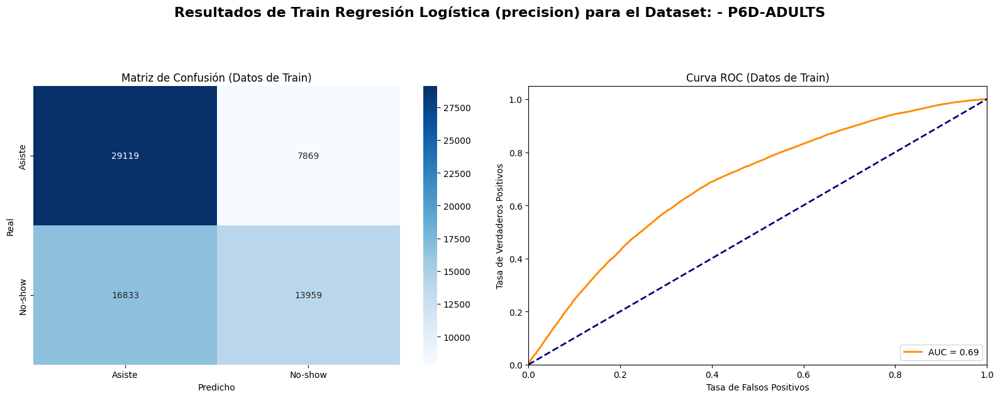

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6896251847986782
Precision (Datos de Test): 0.31074095347501435
Recall (Datos de Test): 0.4806752554420258
F1 Score (Datos de Test): 0.3774638060352346
[[6848 2400]
 [1169 1082]]
AUC (Datos de Test): 0.6562459648845035


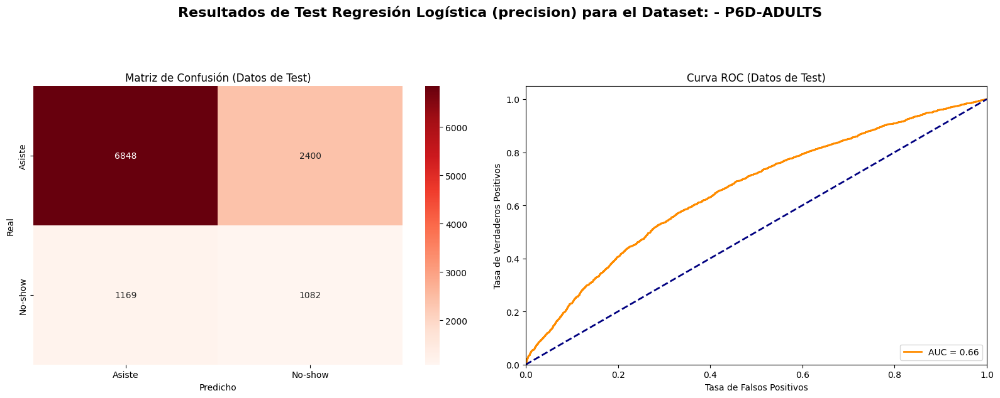

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8559752139274123
Precision (Datos de Train): 0.8442574646411733
Recall (Datos de Train): 0.837457781241881
F1 Score (Datos de Train): 0.840843876353202
[[32231  4757]
 [ 5005 25787]]
AUC (Datos de train): 0.9426011059199668


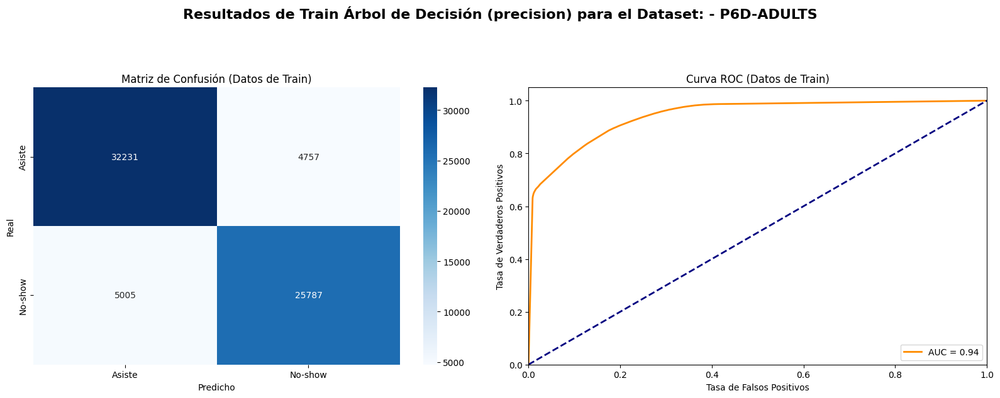

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7156274458648578
Precision (Datos de Test): 0.2797233030696066
Recall (Datos de Test): 0.28742780986228345
F1 Score (Datos de Test): 0.28352322524101664
[[7582 1666]
 [1604  647]]
AUC (Datos de Test): 0.6147114642627114


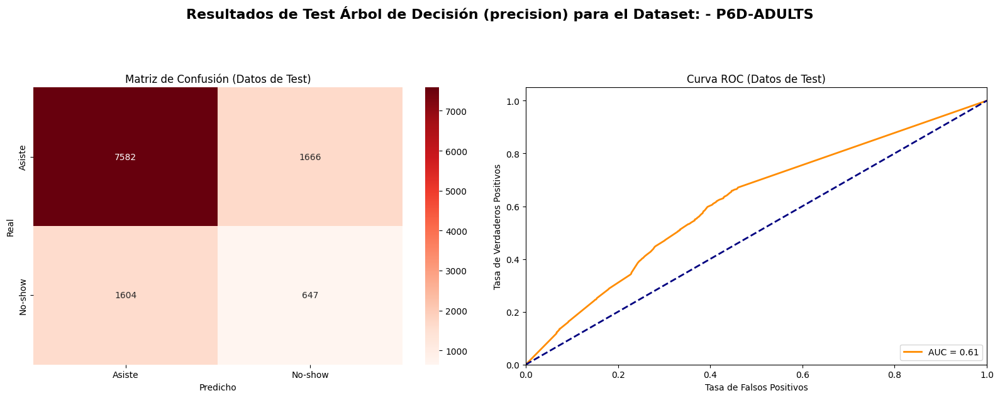

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 100, 'solver': 'liblinear'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6355709648863972
Precision (Datos de Train): 0.6395290236862602
Recall (Datos de Train): 0.453332034294622
F1 Score (Datos de Train): 0.5305688059446207
[[29120  7868]
 [16833 13959]]
AUC (Datos de train): 0.6868676537127207


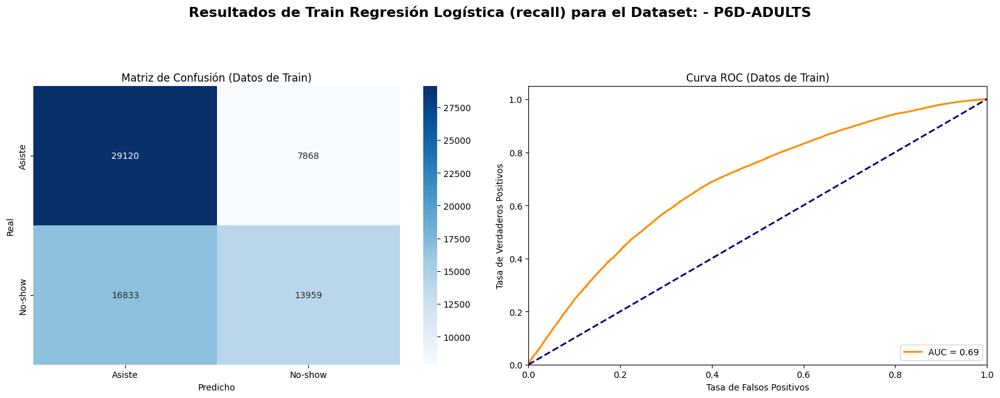

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6895382207148447
Precision (Datos de Test): 0.31065173700832616
Recall (Datos de Test): 0.4806752554420258
F1 Score (Datos de Test): 0.377397976979421
[[6847 2401]
 [1169 1082]]
AUC (Datos de Test): 0.6562462531070389


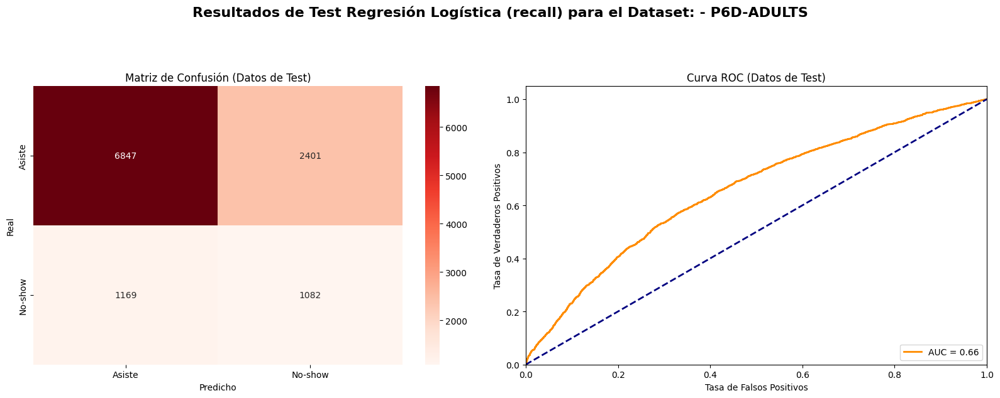

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7511507819415757
Precision (Datos de Train): 0.6904768418460865
Recall (Datos de Train): 0.8196609508963367
F1 Score (Datos de Train): 0.749543395946247
[[25674 11314]
 [ 5553 25239]]
AUC (Datos de train): 0.8456511361123967


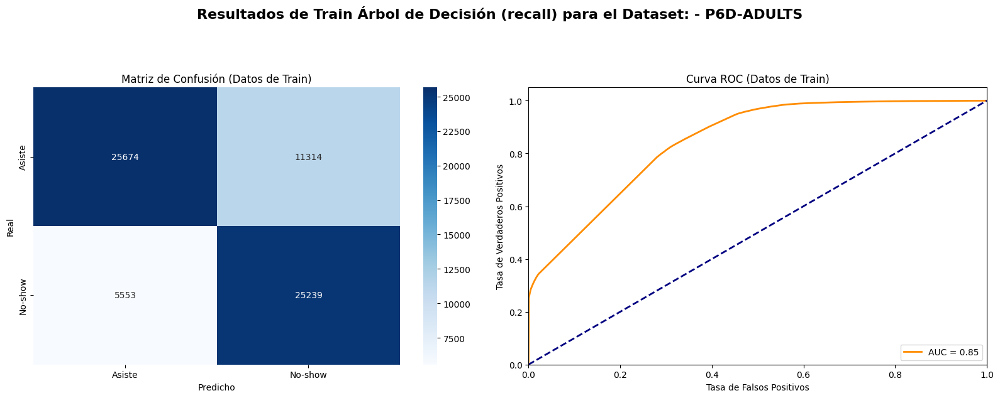

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6476215323071571
Precision (Datos de Test): 0.2916955817719176
Recall (Datos de Test): 0.5601954686805865
F1 Score (Datos de Test): 0.38363249163370855
[[6186 3062]
 [ 990 1261]]
AUC (Datos de Test): 0.681750873122134


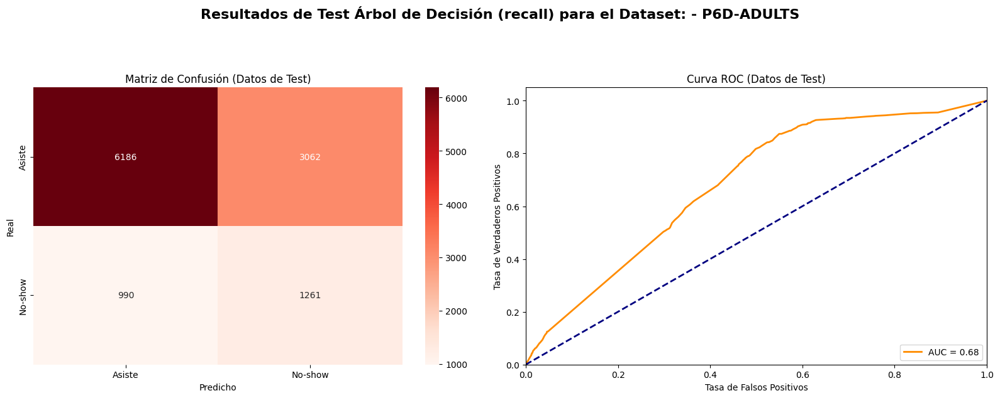

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7079669519032162
Precision (Datos de Train): 0.6510465307916278
Recall (Datos de Train): 0.7697453884125747
F1 Score (Datos de Train): 0.7054376618351736
[[24284 12704]
 [ 7090 23702]]
AUC (Datos de Train): 0.7901563493428511


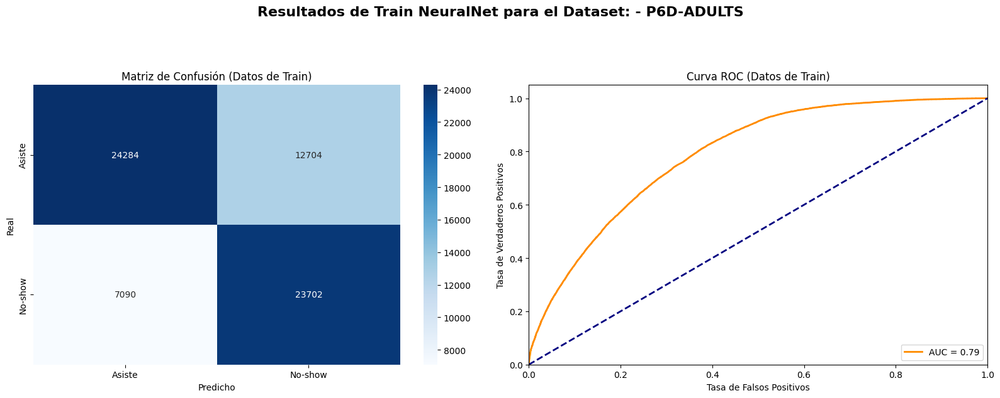

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.5925732672406296
Precision (Datos de Test): 0.2856639661852765
Recall (Datos de Test): 0.7205686361617059
F1 Score (Datos de Test): 0.40913103796191197
[[5192 4056]
 [ 629 1622]]
AUC (Datos de Test): 0.6871258150933303


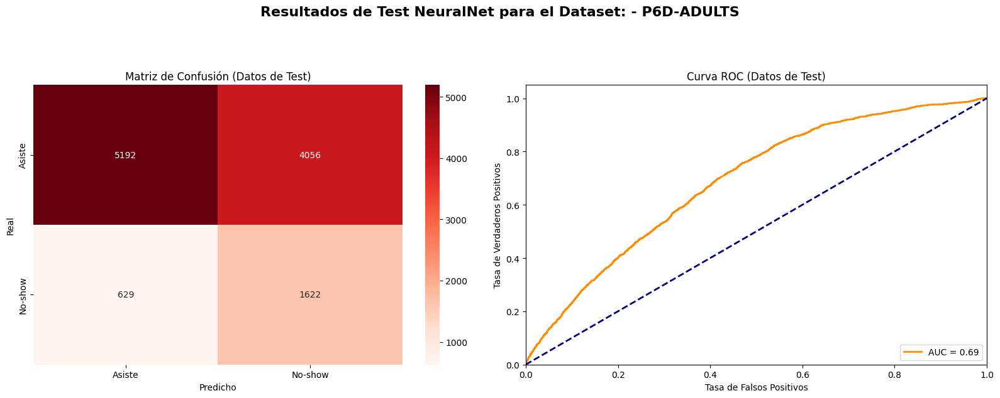

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6981410445559162
Precision (Datos de Train): 0.6192575834526063
Recall (Datos de Train): 0.8711678358015069
F1 Score (Datos de Train): 0.7239238969099987
[[20495 16493]
 [ 3967 26825]]
AUC (Datos de Train): 0.7859511535947016


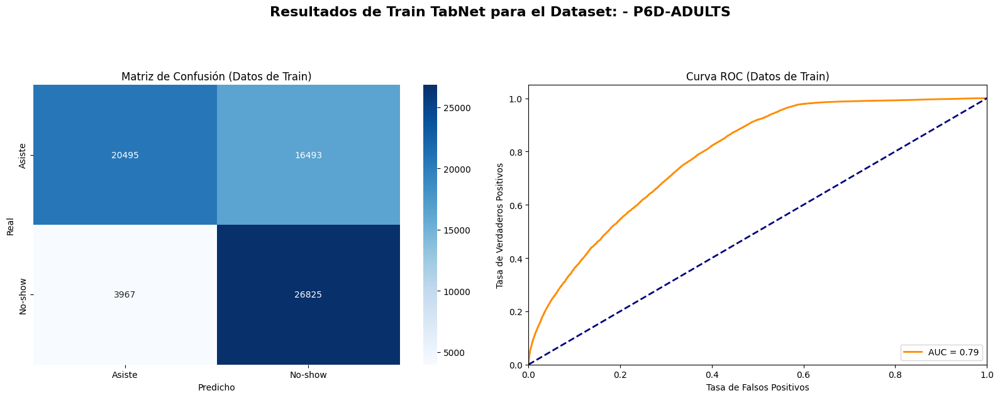

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.5925732672406296
Precision (Datos de Test): 0.2887886150642138
Recall (Datos de Test): 0.739227010217681
F1 Score (Datos de Test): 0.4153250967178335
[[5150 4098]
 [ 587 1664]]
AUC (Datos de Test): 0.698930089126094


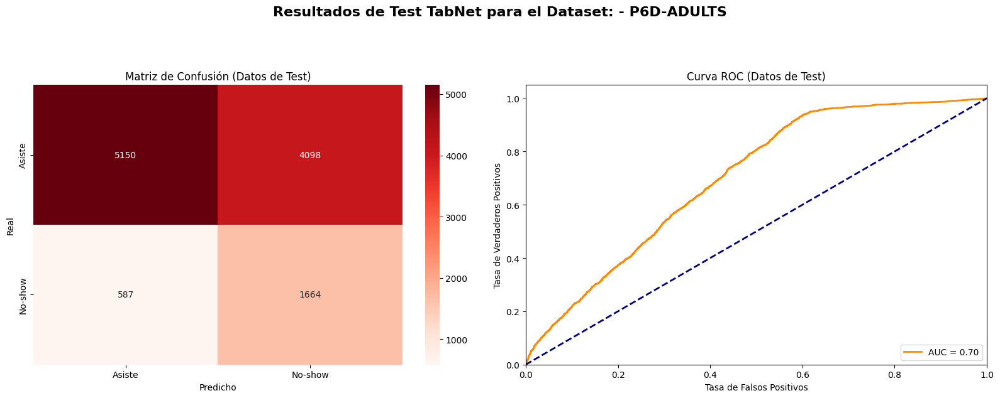


Ejecutando modelo para el dataset: P6E-OLDERADULTS

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 100, 'solver': 'newton-cg'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.5894502873251654
Precision (Datos de Train): 0.6063988095238095
Recall (Datos de Train): 0.37398187449810716
F1 Score (Datos de Train): 0.46264102746044133
[[7613 2116]
 [5457 3260]]
AUC (Datos de train): 0.6335837952814021


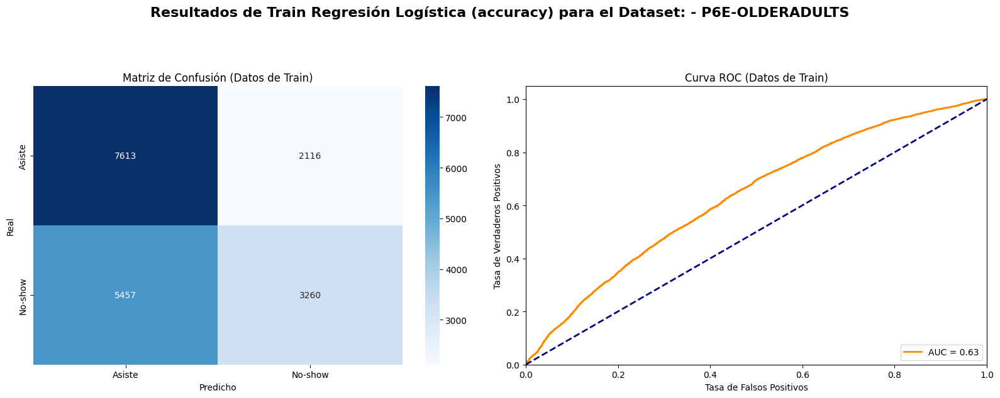

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6737317581653927
Precision (Datos de Test): 0.21303841676367868
Recall (Datos de Test): 0.4103139013452915
F1 Score (Datos de Test): 0.28045977011494255
[[1756  676]
 [ 263  183]]
AUC (Datos de Test): 0.6043006549445362


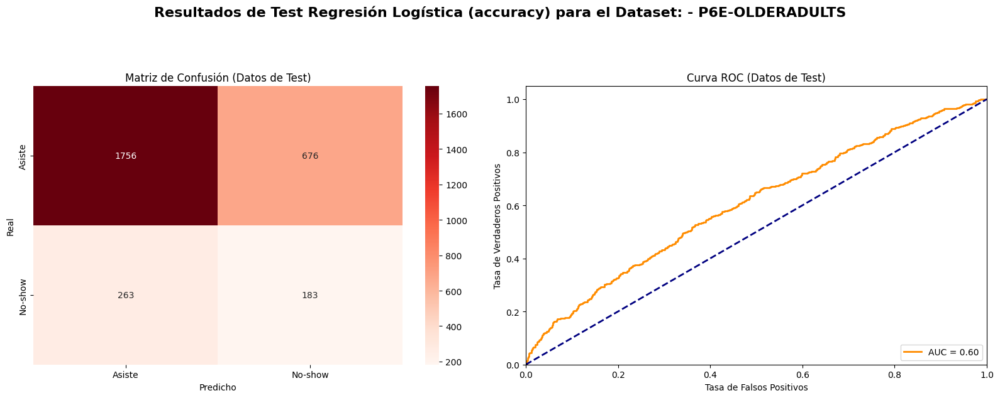

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8673425132820124
Precision (Datos de Train): 0.8504359490274983
Recall (Datos de Train): 0.8727773316507973
F1 Score (Datos de Train): 0.8614618128290777
[[8391 1338]
 [1109 7608]]
AUC (Datos de train): 0.9481050380653557


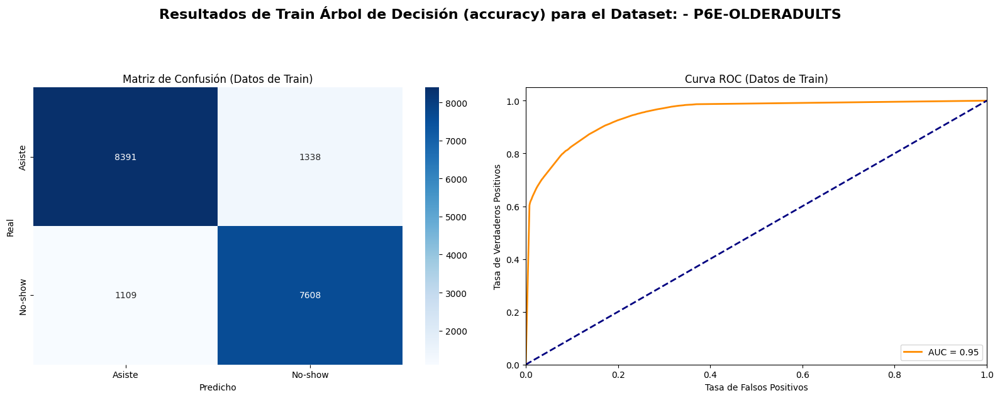

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7199444058373871
Precision (Datos de Test): 0.19899665551839466
Recall (Datos de Test): 0.26681614349775784
F1 Score (Datos de Test): 0.22796934865900384
[[1953  479]
 [ 327  119]]
AUC (Datos de Test): 0.5397304438576823


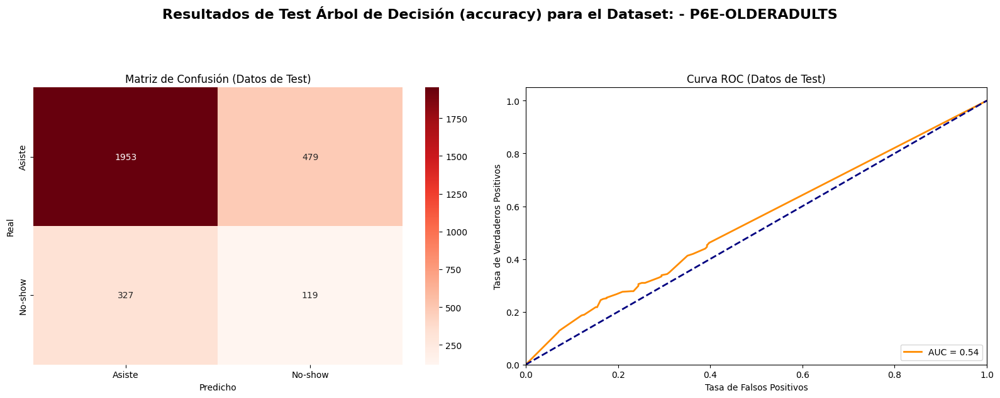

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 100, 'solver': 'newton-cg'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.5894502873251654
Precision (Datos de Train): 0.6063988095238095
Recall (Datos de Train): 0.37398187449810716
F1 Score (Datos de Train): 0.46264102746044133
[[7613 2116]
 [5457 3260]]
AUC (Datos de train): 0.6335837952814021


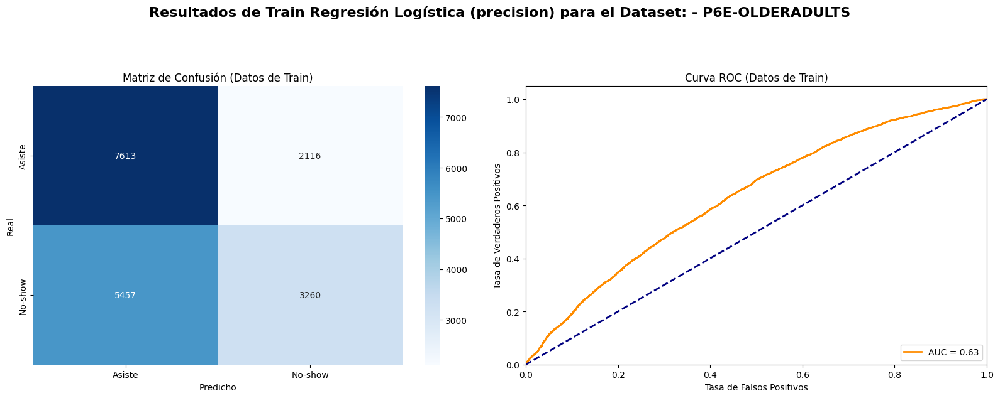

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6737317581653927
Precision (Datos de Test): 0.21303841676367868
Recall (Datos de Test): 0.4103139013452915
F1 Score (Datos de Test): 0.28045977011494255
[[1756  676]
 [ 263  183]]
AUC (Datos de Test): 0.6043006549445362


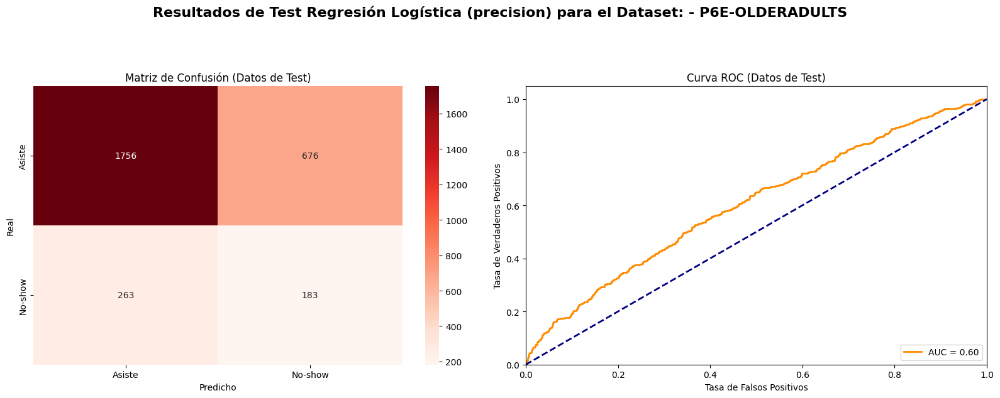

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 3}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8397484549495826
Precision (Datos de Train): 0.7763599731363331
Recall (Datos de Train): 0.928301020993461
F1 Score (Datos de Train): 0.8455590386624869
[[7398 2331]
 [ 625 8092]]
AUC (Datos de train): 0.9231296564098261


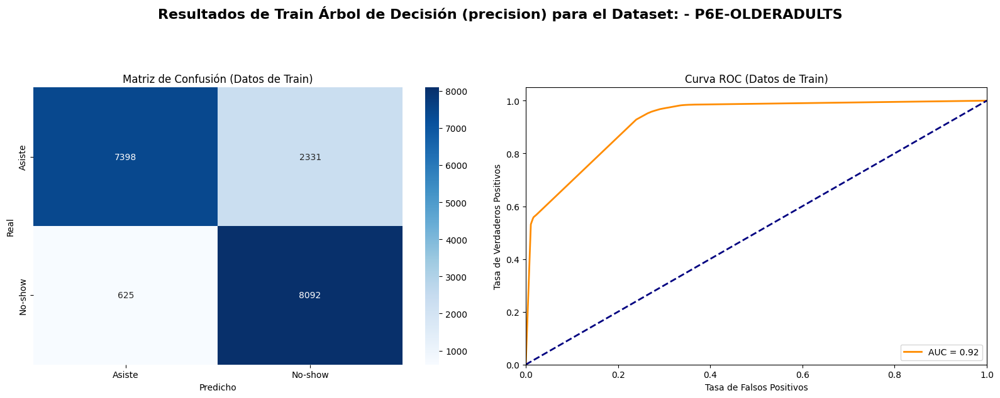

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6556636553161918
Precision (Datos de Test): 0.19755826859045506
Recall (Datos de Test): 0.3991031390134529
F1 Score (Datos de Test): 0.2642910170749814
[[1709  723]
 [ 268  178]]
AUC (Datos de Test): 0.5686046104260091


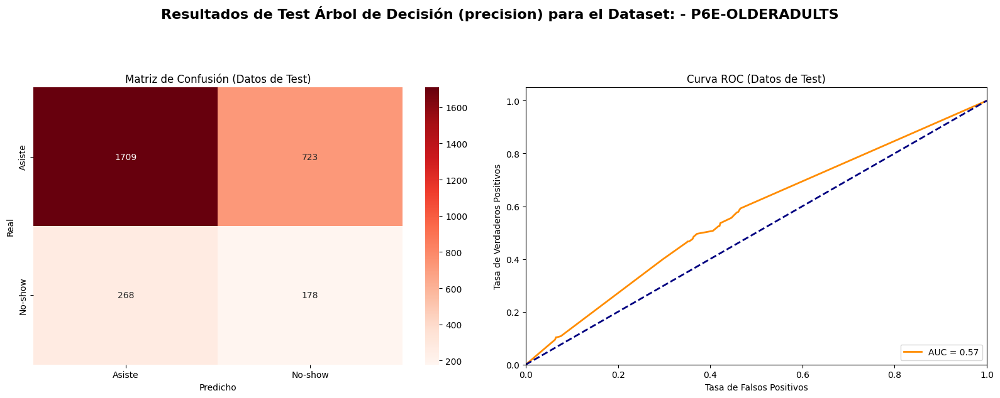

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 100, 'solver': 'newton-cg'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.5894502873251654
Precision (Datos de Train): 0.6063988095238095
Recall (Datos de Train): 0.37398187449810716
F1 Score (Datos de Train): 0.46264102746044133
[[7613 2116]
 [5457 3260]]
AUC (Datos de train): 0.6335837952814021


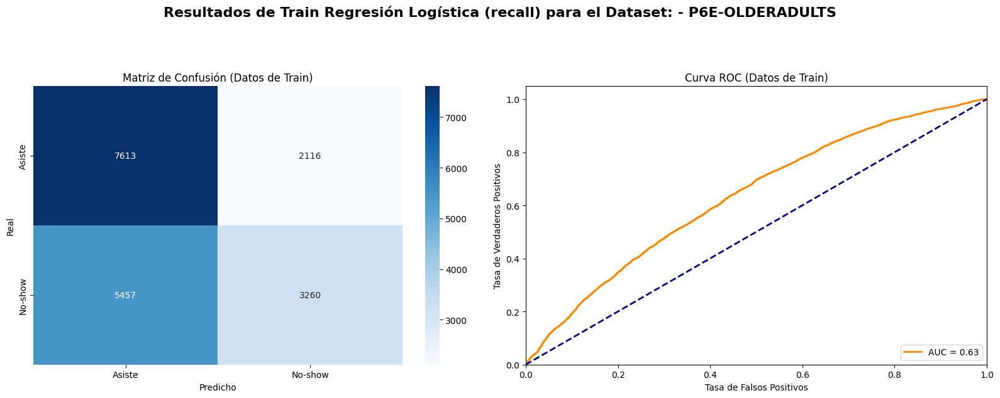

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6737317581653927
Precision (Datos de Test): 0.21303841676367868
Recall (Datos de Test): 0.4103139013452915
F1 Score (Datos de Test): 0.28045977011494255
[[1756  676]
 [ 263  183]]
AUC (Datos de Test): 0.6043006549445362


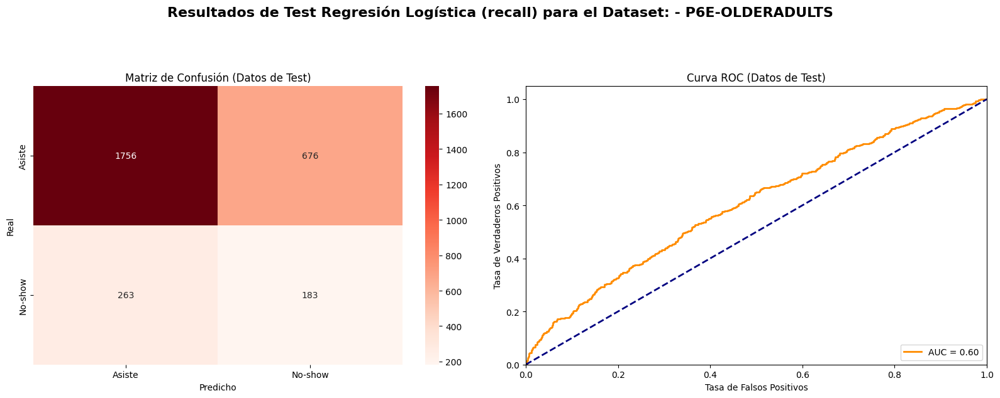

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 3, 'min_samples_split': 5}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7914452997939933
Precision (Datos de Train): 0.7198050189564903
Recall (Datos de Train): 0.9147642537570265
F1 Score (Datos de Train): 0.8056579944430412
[[6625 3104]
 [ 743 7974]]
AUC (Datos de train): 0.8840949134178193


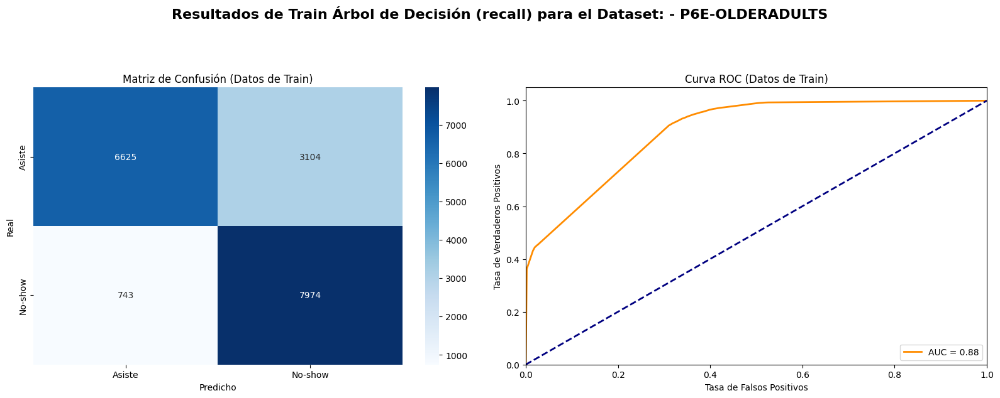

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6240444753300903
Precision (Datos de Test): 0.21247739602169982
Recall (Datos de Test): 0.5269058295964125
F1 Score (Datos de Test): 0.30283505154639173
[[1561  871]
 [ 211  235]]
AUC (Datos de Test): 0.613666158986311


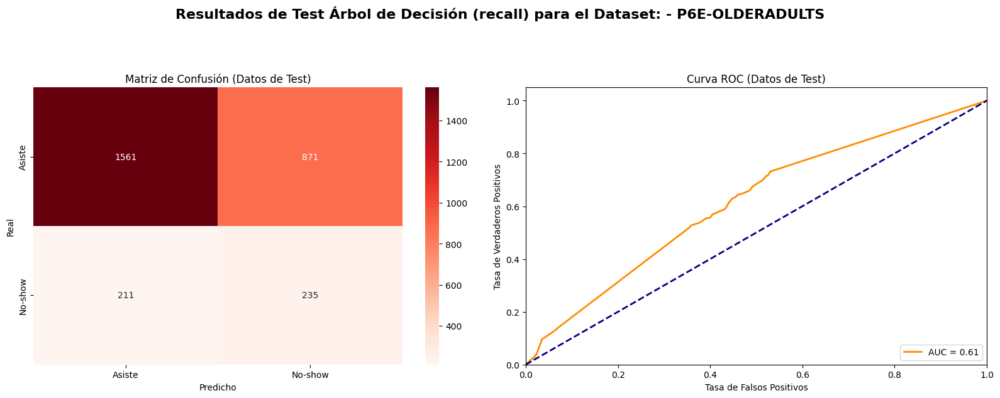

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7369077306733167
Precision (Datos de Train): 0.6996692848284415
Recall (Datos de Train): 0.7766433405988299
F1 Score (Datos de Train): 0.7361496221388572
[[6823 2906]
 [1947 6770]]
AUC (Datos de Train): 0.8153908985591672


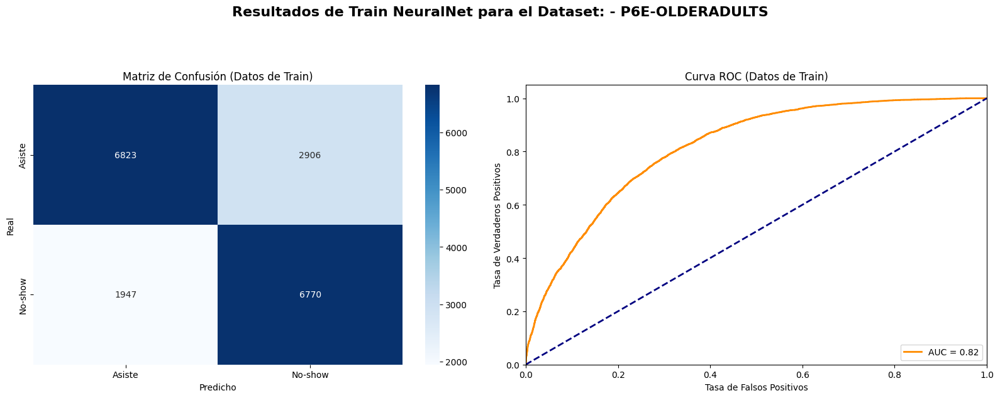

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.5441278665740097
Precision (Datos de Test): 0.18713872832369943
Recall (Datos de Test): 0.5807174887892377
F1 Score (Datos de Test): 0.2830601092896175
[[1307 1125]
 [ 187  259]]
AUC (Datos de Test): 0.5990354687868775


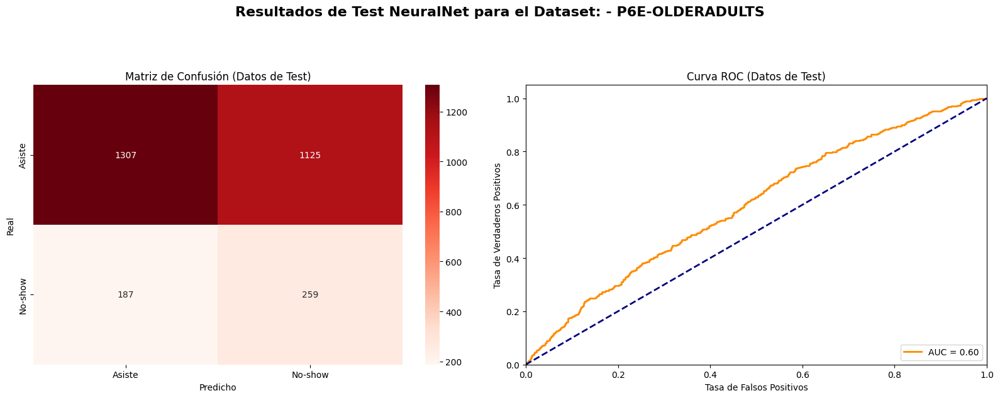

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7000975821316274
Precision (Datos de Train): 0.6704849587838562
Recall (Datos de Train): 0.7184811288287255
F1 Score (Datos de Train): 0.6936537822571713
[[6651 3078]
 [2454 6263]]
AUC (Datos de Train): 0.7745079741763521


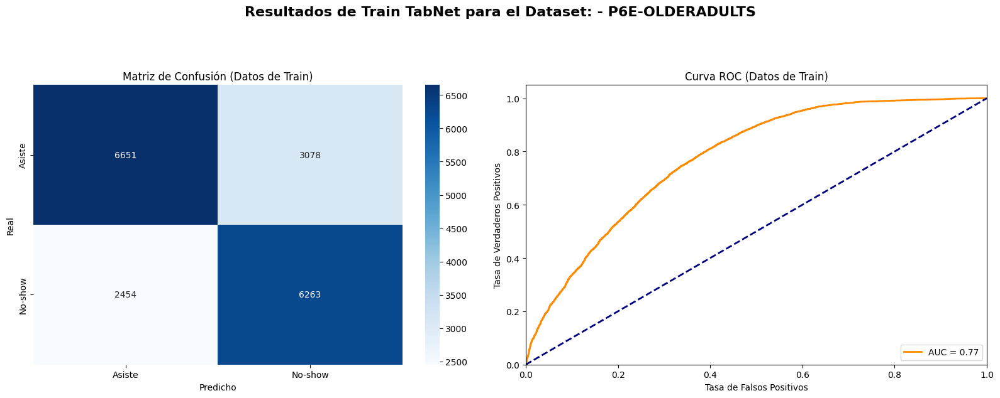

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6782487838776928
Precision (Datos de Test): 0.22093023255813954
Recall (Datos de Test): 0.4260089686098655
F1 Score (Datos de Test): 0.29096477794793263
[[1762  670]
 [ 256  190]]
AUC (Datos de Test): 0.6324114571040831


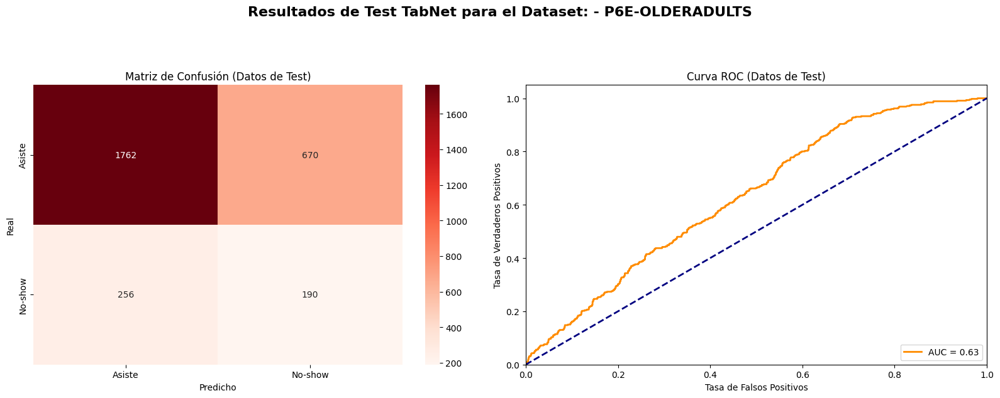

In [10]:
def load_data(file_path):
    return joblib.load(file_path)

# Listado de archivos
X_test_files = [
    "X_test_P1-ALL-ADASYN.pkl", "X_test_P1-ALL.pkl", "X_test_P2-NOCONDITIONS.pkl", 
    "X_test_P3-AGE.pkl", "X_test_P4-TIME.pkl", "X_test_P5-HEALTHCENTRE.pkl",
    "X_test_P6A-KIDS.pkl", "X_test_P6B-ADOLESCENTS.pkl", "X_test_P6C-YOUNGADULTS.pkl",
    "X_test_P6D-ADULTS.pkl", "X_test_P6E-OLDERADULTS.pkl"
]

X_train_files = [
    "X_train_P1-ALL-ADASYN.pkl", "X_train_P1-ALL.pkl", "X_train_P2-NOCONDITIONS.pkl", 
    "X_train_P3-AGE.pkl", "X_train_P4-TIME.pkl", "X_train_P5-HEALTHCENTRE.pkl",
    "X_train_P6A-KIDS.pkl", "X_train_P6B-ADOLESCENTS.pkl", "X_train_P6C-YOUNGADULTS.pkl",
    "X_train_P6D-ADULTS.pkl", "X_train_P6E-OLDERADULTS.pkl"
]

y_test_files = [
    "y_test_P1-ALL-ADASYN.pkl", "y_test_P1-ALL.pkl", "y_test_P2-NOCONDITIONS.pkl", 
    "y_test_P3-AGE.pkl", "y_test_P4-TIME.pkl", "y_test_P5-HEALTHCENTRE.pkl",
    "y_test_P6A-KIDS.pkl", "y_test_P6B-ADOLESCENTS.pkl", "y_test_P6C-YOUNGADULTS.pkl",
    "y_test_P6D-ADULTS.pkl", "y_test_P6E-OLDERADULTS.pkl"
]

y_train_files = [
    "y_train_P1-ALL-ADASYN.pkl", "y_train_P1-ALL.pkl", "y_train_P2-NOCONDITIONS.pkl", 
    "y_train_P3-AGE.pkl", "y_train_P4-TIME.pkl", "y_train_P5-HEALTHCENTRE.pkl",
    "y_train_P6A-KIDS.pkl", "y_train_P6B-ADOLESCENTS.pkl", "y_train_P6C-YOUNGADULTS.pkl",
    "y_train_P6D-ADULTS.pkl", "y_train_P6E-OLDERADULTS.pkl"
]

file_names = [
    "P1-ALL-ADASYN", "P1-ALL", "P2-NOCONDITIONS", 
    "P3-AGE", "P4-TIME", "P5-HEALTHCENTRE",
    "P6A-KIDS", "P6B-ADOLESCENTS", "P6C-YOUNGADULTS",
    "P6D-ADULTS", "P6E-OLDERADULTS"
]

# Lista de métricas a evaluar
scoring = ['accuracy', 'precision', 'recall']

# Se cargan los archivos en un diccionario
data = {}
for file_list in [X_test_files, X_train_files, y_test_files, y_train_files]:
    for file_name in file_list:
        data[file_name] = load_data(file_name)

# Se crea bucle para analizar los datos con el modelo de PyTorch
for idx, (X_train_file, y_train_file, X_test_file, y_test_file) in enumerate(zip(X_train_files, y_train_files, X_test_files, y_test_files)):
    try:
        if X_train_file in data and y_train_file in data and X_test_file in data and y_test_file in data:
            X_train = data[X_train_file]
            y_train = data[y_train_file]
            X_test = data[X_test_file]
            y_test = data[y_test_file]

            dataset_name = file_names[idx]
            titulo = f"\n{'='*40}\nEjecutando modelo para el dataset: {dataset_name}\n{'='*40}\n"
            print(titulo)
            # Se ejecuta el modelo de regresión logística y decision tree con un nuevo bule for para incluir las métricas de scoring
            for score in scoring:
                execute_model_logistic_regression(X_train, y_train, X_test, y_test, dataset_name, score)
                execute_model_decision_tree(X_train, y_train, X_test, y_test, dataset_name, score)
            # Se ejecuta el modelo de PyTorch
            execute_model_pytorch(X_train, y_train, X_test, y_test, device='cuda', dataset_name=dataset_name)
            # Se ejecuta el modelo de TabNet
            execute_model_tabnet(X_train, y_train, X_test, y_test, device='cuda', dataset_name=dataset_name)
        else:
            print(f"Archivos correspondientes no encontrados para {X_train_file}. Omitiendo este archivo.")
    except KeyError as e:
        print(f"Error: {e} - La clave no existe en el diccionario 'data'. Omitiendo este archivo.")